# Importando dados

In [491]:
import json
import sys

import logging

logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

logger = logging.getLogger(__name__)

# Importando dados

In [ ]:
import pandas as pd
import numpy as np
import logging

logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

logger = logging.getLogger(__name__)

def carregar_json(pasta_dados: Path, glob_pattern: str) -> tuple[pd.DataFrame, Path | None]:
    """
    Busca o arquivo mais recente pelo padrão e retorna um DataFrame.
    Retorna DataFrame vazio se não encontrar nenhum arquivo.
    """
    arquivos = list(pasta_dados.glob(glob_pattern))

    if not arquivos:
        logger.warning(f"Nenhum arquivo encontrado para o padrão: {glob_pattern}")
        return pd.DataFrame(), None

    arquivo = max(arquivos, key=lambda f: f.stem.split('_')[-1])
    
    logger.info(f"Arquivo encontrado: {arquivo.name}")

    try:
        with open(arquivo, 'r', encoding='utf-8') as f:
            data = json.load(f)
        return pd.DataFrame(data), arquivo

    except Exception as e:
        logger.error(f"Erro ao carregar {arquivo.name}: {e}")
        return pd.DataFrame(), arquivo
    
import sys
from pathlib import Path

#pasta_dados  = Path(__file__).parent.parent.parent / 'dados'/ 'joinville'
pasta_dados  = Path('../dados/sao_paulo')

name_arquivo_zap = 'saopaulo_zap_imoveis_*.json'

name_arquivo_vivareal = 'saopaulo_vivareal_*.json'

name_arquivo_chave_mao = 'saopaulo_chave_mao_*.json'

df_zap, arquivo_zap      = carregar_json(pasta_dados, name_arquivo_zap)
    
df_vivareal, arquivo_vivareal = carregar_json(pasta_dados,name_arquivo_vivareal)
    
df_chave_mao, arquivo_chave_mao = carregar_json(pasta_dados,name_arquivo_chave_mao)

2026-04-02 09:36:48,002 - WARNING - Nenhum arquivo encontrado para o padrão: saopaulo_zap_imoveis_*.json
2026-04-02 09:36:48,007 - WARNING - Nenhum arquivo encontrado para o padrão: saopaulo_vivareal_*.json
2026-04-02 09:36:48,010 - WARNING - Nenhum arquivo encontrado para o padrão: saopaulo_chave_mao_*.json


In [493]:
df_zap.shape, df_vivareal.shape, df_chave_mao.shape

((0, 0), (0, 0), (0, 0))

In [494]:
df_chave_mao

""


In [495]:
pd_data = pd.concat([df_zap, df_vivareal, df_chave_mao], axis=0, ignore_index=True)

In [496]:
pd_data.shape

(0, 0)

In [497]:
pd_data.columns

RangeIndex(start=0, stop=0, step=1)

In [498]:
pd_data['valor_imovel'].value_counts()

KeyError: 'valor_imovel'

In [ ]:
pd_data = pd_data.drop_duplicates(subset=['url'])

pd_data = pd_data[pd_data['valor_imovel'].notna()].copy()


In [ ]:
pd_data.head()

,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,endereco,iptu,descricao,data_criacao,caracteristicas,fotos,link_maps
0,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 63m² - Saúde",63 m²,2,1,2,R$ 530.000,R$ 977/mês,"Rua Doutor Nogueira Martins, 510 - Saúde, São ...",R$ 207,Apartamento no Bairro Saúde. Sala para 2 ambie...,"Anúncio criado em 22 de agosto de 2023, atuali...","[63 m², 2 quartos, 2 banheiros, 1 vaga, Sala d...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
2,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 70m² - Libe...",70 m²,2,1,2,R$ 600.000,R$ 828/mês,"Rua Conselheiro Carrão - Liberdade, São Paulo ...",R$ 235,Apartamento com excelente distribuição interna...,"Anúncio criado em 17 de março de 2026, atualiz...","[70 m², 2 quartos, 2 banheiros, 1 vaga, Área d...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
3,https://www.zapimoveis.com.br/imovel/venda-sob...,"Sobrado com 5 Quartos para venda ou aluguel, 2...",256 m²,5,3,5,R$ 1.900.000,Isento,"Alameda dos Guaicanãs - Planalto Paulista, São...",R$ 612,Excelente sobrado no Planato Paulista de 256m2...,"Anúncio criado em 20 de setembro de 2024, atua...","[256 m², 5 quartos, 5 banheiros, 3 vagas, 1 su...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
6,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 105m² - Cidade Sat...",105 m²,3,2,3,R$ 420.000,Isento,Avenida Sousa Castelhanos - Cidade Satélite Sa...,Não informado,Excelente Casa para venda no bairro Cidade Sat...,"Anúncio criado em 2 de dezembro de 2025, atual...","[105 m², 3 quartos, 3 banheiros, 2 vagas, Vara...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
10,https://www.zapimoveis.com.br/imovel/venda-con...,"Conjunto Comercial / Sala à venda, 48m² - Sant...",48 m²,1,2,--,R$ 375.000,R$ 630/mês,"Avenida Padre José Maria, 1500 - Santo Amaro, ...",R$ 1.000,"Imovel novo com piso elevado, 2 maquinas de ar...","Anúncio criado em 9 de agosto de 2021, atualiz...","[48 m², 1 banheiro, 2 vagas, 5 andar]",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...


**Removendo linhas com muitos valores faltantes**

In [ ]:
pd_data_sem_nulos = pd_data.dropna(thresh=10)
pd_data_sem_nulos.head()


,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,endereco,iptu,descricao,data_criacao,caracteristicas,fotos,link_maps
0,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 63m² - Saúde",63 m²,2,1,2,R$ 530.000,R$ 977/mês,"Rua Doutor Nogueira Martins, 510 - Saúde, São ...",R$ 207,Apartamento no Bairro Saúde. Sala para 2 ambie...,"Anúncio criado em 22 de agosto de 2023, atuali...","[63 m², 2 quartos, 2 banheiros, 1 vaga, Sala d...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
2,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 70m² - Libe...",70 m²,2,1,2,R$ 600.000,R$ 828/mês,"Rua Conselheiro Carrão - Liberdade, São Paulo ...",R$ 235,Apartamento com excelente distribuição interna...,"Anúncio criado em 17 de março de 2026, atualiz...","[70 m², 2 quartos, 2 banheiros, 1 vaga, Área d...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
3,https://www.zapimoveis.com.br/imovel/venda-sob...,"Sobrado com 5 Quartos para venda ou aluguel, 2...",256 m²,5,3,5,R$ 1.900.000,Isento,"Alameda dos Guaicanãs - Planalto Paulista, São...",R$ 612,Excelente sobrado no Planato Paulista de 256m2...,"Anúncio criado em 20 de setembro de 2024, atua...","[256 m², 5 quartos, 5 banheiros, 3 vagas, 1 su...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
6,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 105m² - Cidade Sat...",105 m²,3,2,3,R$ 420.000,Isento,Avenida Sousa Castelhanos - Cidade Satélite Sa...,Não informado,Excelente Casa para venda no bairro Cidade Sat...,"Anúncio criado em 2 de dezembro de 2025, atual...","[105 m², 3 quartos, 3 banheiros, 2 vagas, Vara...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
10,https://www.zapimoveis.com.br/imovel/venda-con...,"Conjunto Comercial / Sala à venda, 48m² - Sant...",48 m²,1,2,--,R$ 375.000,R$ 630/mês,"Avenida Padre José Maria, 1500 - Santo Amaro, ...",R$ 1.000,"Imovel novo com piso elevado, 2 maquinas de ar...","Anúncio criado em 9 de agosto de 2021, atualiz...","[48 m², 1 banheiro, 2 vagas, 5 andar]",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...


In [ ]:
pd_data_sem_nulos.shape

(3049, 15)

In [ ]:
pd_data_sem_nulos.isnull().sum()

url                   0
titulo                0
metragem             44
banheiros             0
vagas                46
quartos             175
valor_imovel          0
condominio            0
endereco              0
iptu                  0
descricao             9
data_criacao       1436
caracteristicas       0
fotos                 0
link_maps             0
dtype: int64

**A varios valores faltantes em descricao, esses nao seram apagados pois os outros dados nao sao NaN.**

In [ ]:

pd_data_sem_nulos[pd_data_sem_nulos.isnull()['descricao']].head()

,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,endereco,iptu,descricao,data_criacao,caracteristicas,fotos,link_maps
612,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 3 Quartos à venda, 78m² - Jard...",78 m²,2,1,3,R$ 423.000,R$ 800/mês,"Jardim Ubirajara Zona Sul, São Paulo - SP",R$ 540,None,"Anúncio criado em 30 de janeiro de 2026, atual...","[78 m², 3 quartos, 2 banheiros, 1 vaga, 5 anda...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
3021,https://www.chavesnamao.com.br/imovel/apartame...,"Apartamento com 1 dormitório à venda, 41 m² po...",41m²,1,1,1,380000,0,Descrição,0,None,None,[],[https://www.chavesnamao.com.br/imn/1200x0800/...,https://www.google.com/maps/embed/v1/place?key...
3094,https://www.chavesnamao.com.br/imovel/kitnet-a...,Excelente Studio todo mobiliado na Vila Matild...,27m²,1,--,1,320000,580,Descrição,960,None,None,[],[https://www.chavesnamao.com.br/imn/1200x0800/...,https://www.google.com/maps/embed/v1/place?key...
3252,https://www.chavesnamao.com.br/imovel/apartame...,Apartamento com 2 quartos à venda na Vila Mari...,119m²,2,1,2,700000,1630,Descrição,0,None,None,[],[https://www.chavesnamao.com.br/imn/1200x0800/...,https://www.google.com/maps/embed/v1/place?key...
3465,https://www.chavesnamao.com.br/imovel/cobertur...,Cobertura com 3 quartos à venda na Rua Baturit...,234m²,6,4,3,1790000,0,Descrição,1820,None,None,[],[https://www.chavesnamao.com.br/imn/1200x0800/...,https://www.google.com/maps/embed/v1/place?key...


In [ ]:
pd_data_sem_nulos.shape

(3049, 15)

**Separando o endereço em rua, bairro, cidade e estado**

In [ ]:
import unicodedata
class LimpaEndereco:
    def __init__(self, endereco):
        self.endereco = endereco 

    
    def explit_endereco(self) -> list:
        endereco_split = self.endereco.split(',')
        return endereco_split
    
    def explit_rua_bairro(self):
        endereco_split = self.explit_endereco()

        if len(endereco_split) == 3:
            # [Rua X,  351 - Boa Vista,  Cidade - Estado]
            rua = endereco_split[0].strip()
            bairro_parte = endereco_split[1].strip()
            if ' - ' in bairro_parte:
                bairro = bairro_parte.split(' - ')[-1].strip()
            else:
                bairro = bairro_parte

        elif len(endereco_split) == 2:
            primeira_parte = endereco_split[0].strip()

            if ' - ' in primeira_parte:
                # [Rua X - Bairro,  Cidade - Estado]
                partes = primeira_parte.split(' - ')
                rua = partes[0].strip()
                bairro = partes[-1].strip()
            else:
                # ✅ [Bairro,  Cidade - Estado] — só bairro, sem rua
                rua = ""
                bairro = primeira_parte

        else:
            rua = endereco_split[0].strip() if endereco_split else ""
            bairro = ""

        return rua, bairro
    
    def limpar_rua(self) -> str:
        rua, _ = self.explit_rua_bairro()
        rua_lower = rua.lower()
        
        if 'rua ' in rua_lower:
            rua = rua_lower.split('rua ')[1].strip()
        elif 'avenida ' in rua_lower:
            rua = rua_lower.split('avenida ')[1].strip()
        elif 'estrada ' in rua_lower:
            rua = rua_lower.split('estrada ')[1].strip()
        else:
            rua = rua_lower
            
        return unicodedata.normalize('NFD', rua).encode('ascii', 'ignore').decode('utf-8')
    
    def limpar_bairro(self) -> str:
        _, bairro = self.explit_rua_bairro()
        
        bairro_limpo = unicodedata.normalize('NFD', bairro).encode('ascii', 'ignore').decode('utf-8')
        
        return bairro_limpo.lower()
    
    def extract_cidade_estado(self) -> tuple:
        endereco_split = self.explit_endereco()
        cidade_estado = endereco_split[-1].strip()  # Último elemento
        
        if ' - ' in cidade_estado:
            partes = cidade_estado.split(' - ')
            cidade = partes[0].strip()
            estado = partes[1].strip() if len(partes) > 1 else ""
        else:
            cidade = cidade_estado
            estado = ""
           
        
        return cidade.lower(), estado.upper()
    
    def endereco_completo(self) -> tuple:
        try:
            rua = self.limpar_rua()
            rua = unicodedata.normalize('NFD', rua).encode('ascii', 'ignore').decode('utf-8')
        except:
            rua = "s/r"
        try:
            bairro = self.limpar_bairro().replace("-", "").strip()
        except:
            bairro = "s/b"
        try:
            cidade, estado = self.extract_cidade_estado()
            cidade = unicodedata.normalize('NFD', cidade).encode('ascii', 'ignore').decode('utf-8')
            estado = unicodedata.normalize('NFD', estado).encode('ascii', 'ignore').decode('utf-8')
        except:
            bairro = "s/c"
        return rua or "s/r", bairro or "s/b" ,cidade or "s/c" , estado or "s/e"

In [ ]:
import unicodedata

class LimpaEndereco:
    def __init__(self, endereco):
        self.endereco = str(endereco) 

    def explit_endereco(self) -> list:
        return self.endereco.split(',')
    
    def explit_rua_bairro_numero(self):
        endereco_split = self.explit_endereco()
        rua, numero, bairro = "", "s/n", ""

        if len(endereco_split) >= 3:
            # Ex: [Rua 1041, 12 - Centro, Balneário Camboriú - SC]
            rua = endereco_split[0].strip()
            
            parte_meio = endereco_split[1].strip()
            if ' - ' in parte_meio:
                # Separa "12 - Centro" em ["12", "Centro"]
                subpartes = parte_meio.split(' - ')
                numero = subpartes[0].strip()
                bairro = subpartes[1].strip()
            else:
                bairro = parte_meio

        elif len(endereco_split) == 2:
            # Ex: [Avenida Atlântica - Centro, Balneário Camboriú]
            primeira_parte = endereco_split[0].strip()
            if ' - ' in primeira_parte:
                partes = primeira_parte.split(' - ')
                rua = partes[0].strip()
                bairro = partes[-1].strip()
            else:
                rua = ""
                bairro = primeira_parte
        
        # Validar se o número extraído é realmente um número
        # (evita pegar "Frente Mar" como número)
        if not any(char.isdigit() for char in numero):
            numero = "s/n"

        return rua, numero, bairro
    
    def limpar_rua(self) -> str:
        rua, _, _ = self.explit_rua_bairro_numero()
        rua_lower = rua.lower()
        
        prefixos = ['rua ', 'avenida ', 'estrada ', 'travessa ', 'alameda ']
        for prefixo in prefixos:
            if prefixo in rua_lower:
                rua = rua_lower.split(prefixo)[1].strip()
                break
        else:
            rua = rua_lower
            
        return unicodedata.normalize('NFD', rua).encode('ascii', 'ignore').decode('utf-8')
    
    def limpar_bairro(self) -> str:
        _, _, bairro = self.explit_rua_bairro_numero()
        bairro_limpo = unicodedata.normalize('NFD', bairro).encode('ascii', 'ignore').decode('utf-8')
        return bairro_limpo.lower().replace("-", "").strip()
    
    def extract_cidade_estado(self) -> tuple:
        endereco_split = self.explit_endereco()
        cidade_estado = endereco_split[-1].strip()
        
        if ' - ' in cidade_estado:
            partes = cidade_estado.split(' - ')
            cidade = partes[0].strip()
            estado = partes[1].strip() if len(partes) > 1 else ""
        else:
            cidade = cidade_estado
            estado = ""
        
        return cidade.lower(), estado.upper()
    
    def endereco_completo(self) -> tuple:
        try:
            rua, numero, _ = self.explit_rua_bairro_numero()
            rua_limpa = self.limpar_rua()
            bairro = self.limpar_bairro()
            cidade, estado = self.extract_cidade_estado()
            
            # Normalização final
            cidade = unicodedata.normalize('NFD', cidade).encode('ascii', 'ignore').decode('utf-8')
            estado = unicodedata.normalize('NFD', estado).encode('ascii', 'ignore').decode('utf-8')
            
            return (
                rua_limpa or "s/r", 
                numero or "s/n", 
                bairro or "s/b", 
                cidade or "s/c", 
                estado or "s/e"
            )
        except Exception as e:
            return ("error", "error", "error", "error", "error")

In [ ]:
pd_data

,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,endereco,iptu,descricao,data_criacao,caracteristicas,fotos,link_maps
0,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 63m² - Saúde",63 m²,2,1,2,R$ 530.000,R$ 977/mês,"Rua Doutor Nogueira Martins, 510 - Saúde, São ...",R$ 207,Apartamento no Bairro Saúde. Sala para 2 ambie...,"Anúncio criado em 22 de agosto de 2023, atuali...","[63 m², 2 quartos, 2 banheiros, 1 vaga, Sala d...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
2,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 70m² - Libe...",70 m²,2,1,2,R$ 600.000,R$ 828/mês,"Rua Conselheiro Carrão - Liberdade, São Paulo ...",R$ 235,Apartamento com excelente distribuição interna...,"Anúncio criado em 17 de março de 2026, atualiz...","[70 m², 2 quartos, 2 banheiros, 1 vaga, Área d...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
3,https://www.zapimoveis.com.br/imovel/venda-sob...,"Sobrado com 5 Quartos para venda ou aluguel, 2...",256 m²,5,3,5,R$ 1.900.000,Isento,"Alameda dos Guaicanãs - Planalto Paulista, São...",R$ 612,Excelente sobrado no Planato Paulista de 256m2...,"Anúncio criado em 20 de setembro de 2024, atua...","[256 m², 5 quartos, 5 banheiros, 3 vagas, 1 su...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
6,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 105m² - Cidade Sat...",105 m²,3,2,3,R$ 420.000,Isento,Avenida Sousa Castelhanos - Cidade Satélite Sa...,Não informado,Excelente Casa para venda no bairro Cidade Sat...,"Anúncio criado em 2 de dezembro de 2025, atual...","[105 m², 3 quartos, 3 banheiros, 2 vagas, Vara...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
10,https://www.zapimoveis.com.br/imovel/venda-con...,"Conjunto Comercial / Sala à venda, 48m² - Sant...",48 m²,1,2,--,R$ 375.000,R$ 630/mês,"Avenida Padre José Maria, 1500 - Santo Amaro, ...",R$ 1.000,"Imovel novo com piso elevado, 2 maquinas de ar...","Anúncio criado em 9 de agosto de 2021, atualiz...","[48 m², 1 banheiro, 2 vagas, 5 andar]",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4437,https://www.chavesnamao.com.br/imovel/casa-a-v...,Casa com 4 quartos à venda na Rua França Carva...,300m²,4,--,4,2600000,0,Descrição,500,More em um sobrado com requinte em um dos melh...,None,[],[https://www.chavesnamao.com.br/imn/1200x0800/...,https://www.google.com/maps/embed/v1/place?key...
4438,https://www.chavesnamao.com.br/imovel/terreno-...,"Terreno à venda na Rua Manoel Dias do Campo, C...",2.500m²,0,None,None,7000000,0,Descrição,3839,"TERRENO A VENDA NO BAIRRO CASA VERDE ALTA, COM...",None,[],[https://www.chavesnamao.com.br/imn/1200x0800/...,https://www.google.com/maps/embed/v1/place?key...
4439,https://www.chavesnamao.com.br/imovel/apartame...,"Apartamento com 2 dormitórios à venda, 63 m² p...",63m²,1,--,2,287000,610,Descrição,0,Apartamento Bem Localizado à Venda na Zona Nor...,None,[],[https://www.chavesnamao.com.br/imn/1200x0800/...,https://www.google.com/maps/embed/v1/place?key...
4440,https://www.chavesnamao.com.br/imovel/casa-a-v...,"Casa à venda na Rua Vacanga, 642, Vila Fernand...",120m²,4,2,3,750000,0,Descrição,0,"Sobrado com 3 suítes,sendo uma deles com close...",None,[],[https://www.chavesnamao.com.br/imn/1200x0800/...,https://www.google.com/maps/embed/v1/place?key...


In [ ]:
def limpa_endereco_apply(endereco):
    obj = LimpaEndereco(endereco)
    rua, numero, bairro, cidade, estado = obj.endereco_completo()
    return pd.Series({'rua': rua, 'numero': numero, 'bairro': bairro, 'cidade': cidade, 'estado': estado})

def pirabeiraba(bairro):
    if 'pirabeiraba' in bairro.lower() or 'dona francisca' in bairro.lower():
        return 'pirabeiraba'
    return bairro

# Aplicar
endereco_dividido = pd_data_sem_nulos['endereco'].apply(limpa_endereco_apply)

pd_data_endereco_dividido = pd.concat([pd_data_sem_nulos, endereco_dividido], axis=1).drop('endereco', axis=1)

pd_data_endereco_dividido['bairro'] = pd_data_endereco_dividido['bairro'].apply(pirabeiraba)


ValueError: not enough values to unpack (expected 5, got 4)

In [ ]:
pd_data_endereco_dividido[pd_data_endereco_dividido['estado'] == 'SP']

,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,iptu,descricao,data_criacao,caracteristicas,fotos,link_maps,rua,numero,bairro,cidade,estado
0,https://www.zapimoveis.com.br/imovel/venda-con...,"Conjunto Comercial / Sala à venda, 32m² - Moema",32 m²,2,1,--,R$ 300.000,R$ 1.007/mês,R$ 354,32m² com 2 banheiros e 1 vaga. Lateral do conj...,"Anúncio criado em 9 de março de 2026, atualiza...","[32 m², 2 banheiros, 1 vaga]",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,pavao,962,moema,sao paulo,SP
2,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 3 Quartos à venda, 240m² - Ita...",240 m²,3,2,3,R$ 4.950.000,R$ 3.850/mês,R$ 1.150,Itaim Bibi - Localizado na região carinhosamen...,"Anúncio criado em 6 de março de 2026, atualiza...","[240 m², 3 quartos, 3 banheiros, 2 vagas, 1 su...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,jacurici,147,itaim bibi,sao paulo,SP
3,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 4 Quartos à venda, 700m² - Jardim Mar...",700 m²,7,12,4,R$ 5.100.000,Isento,R$ 3.300,Casa térrea com muita iluminação natural e um ...,"Anúncio criado em 20 de setembro de 2024, atua...","[700 m², 4 quartos, 7 banheiros, 12 vagas, 4 s...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,doutor paulo aires neto,250,jardim marajoara,sao paulo,SP
4,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 42m² - Jard...",42 m²,1,1,2,R$ 249.000,R$ 425/mês,R$ 100,Apartamento à Venda – Jardim Santa Terezinha (...,"Anúncio criado em 27 de fevereiro de 2026, atu...","[42 m², 2 quartos, 1 banheiro, 1 vaga, 5 andar]",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,aveleda,88,jardim santa terezinha zona leste,sao paulo,SP
5,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 48m² - Jard...",48 m²,1,1,2,R$ 349.000,R$ 350/mês,Isento,APARTAMENTO COM APROXIMADAMENTE 50 METROS QUAD...,"Anúncio criado em 26 de janeiro de 2024, atual...","[48 m², 2 quartos, 1 banheiro, 1 vaga, 11 anda...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,rego barros,s/n,jardim vila formosa,sao paulo,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9979,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 4 Quartos à venda, 120m² - Jabaquara",120 m²,3,--,4,R$ 671.000,Isento,R$ 394,Casa térrea em São Judas próxima do Metrô Conc...,"Anúncio criado em 20 de junho de 2022, atualiz...","[120 m², 4 quartos, 3 banheiros, Cozinha, Copa]",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,jorge faleiros,55,jabaquara,sao paulo,SP
9982,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 67m² - Vila...",67 m²,1,1,2,R$ 676.000,R$ 1.420/mês,R$ 41,Apartamento dispõe de:67m² de área útil2 Dormi...,"Anúncio criado em 16 de janeiro de 2025, atual...","[67 m², 2 quartos, 1 banheiro, 1 vaga, Aceita ...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,maestro callia,215,vila mariana,sao paulo,SP
9983,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 45m² - Jard...",45 m²,1,--,2,R$ 469.000,R$ 225/mês,R$ 195,Apartamento dispõe de:45 m² de área útil2 Dorm...,"Anúncio criado em 2 de outubro de 2025, atuali...","[45 m², 2 quartos, 1 banheiro, Aceita animais,...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,guajurus,593,jardim sao paulo zona norte,sao paulo,SP
9984,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 47m² - Tatuapé",47 m²,1,1,2,R$ 679.000,R$ 1.000/mês,R$ 215,Condomínio You Metropolitan!!Apartamento dispõ...,"Anúnc

**Removendo linhas com estado diferente de SC**

In [ ]:
pd_data_endereco_dividido = pd_data_endereco_dividido[pd_data_endereco_dividido['estado'] == 'SP']

In [ ]:
pd_data_endereco_dividido['estado'].value_counts()

estado
SP    6273
Name: count, dtype: int64

In [ ]:
pd_data_endereco_dividido.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6273 entries, 0 to 9985
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   url              6273 non-null   object
 1   titulo           6273 non-null   object
 2   metragem         6273 non-null   object
 3   banheiros        6273 non-null   object
 4   vagas            6273 non-null   object
 5   quartos          6273 non-null   object
 6   valor_imovel     6273 non-null   object
 7   condominio       6273 non-null   object
 8   iptu             6273 non-null   object
 9   descricao        6265 non-null   object
 10  data_criacao     6273 non-null   object
 11  caracteristicas  6273 non-null   object
 12  fotos            6273 non-null   object
 13  link_maps        6273 non-null   object
 14  rua              6273 non-null   object
 15  numero           6273 non-null   object
 16  bairro           6273 non-null   object
 17  cidade           6273 non-null   objec

**Arrumando a coluna metragem, transformando em float**

In [ ]:

def limpar_metragem(dados) -> float:
    try:
        if not dados or not isinstance(dados, str):
            return 0.0
    
        valor = dados.replace('m²', '').strip()
    
        if valor == '':
            return 0.0
        
        return float(valor)    
    except Exception as e:
        logger.warning("""Erro ao limpar metragem: %s, dados no formato %s""", e,dados)
        return 0.0


In [ ]:
pd_data_metragem = pd_data_endereco_dividido.copy()
pd_data_metragem['metragem'] = pd_data_metragem['metragem'].apply(limpar_metragem)

2026-03-11 09:45:48,001 - WARNING - Erro ao limpar metragem: could not convert string to float: '24 - 37', dados no formato 24 - 37 m²
2026-03-11 09:45:48,003 - WARNING - Erro ao limpar metragem: could not convert string to float: '36 - 63', dados no formato 36 - 63 m²
2026-03-11 09:45:48,004 - WARNING - Erro ao limpar metragem: could not convert string to float: '41 - 65', dados no formato 41 - 65 m²


2026-03-11 09:45:48,005 - WARNING - Erro ao limpar metragem: could not convert string to float: '24 - 36', dados no formato 24 - 36 m²
2026-03-11 09:45:48,006 - WARNING - Erro ao limpar metragem: could not convert string to float: '53 - 78', dados no formato 53 - 78 m²


In [ ]:
pd_data_metragem.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6273 entries, 0 to 9985
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   url              6273 non-null   object 
 1   titulo           6273 non-null   object 
 2   metragem         6273 non-null   float64
 3   banheiros        6273 non-null   object 
 4   vagas            6273 non-null   object 
 5   quartos          6273 non-null   object 
 6   valor_imovel     6273 non-null   object 
 7   condominio       6273 non-null   object 
 8   iptu             6273 non-null   object 
 9   descricao        6265 non-null   object 
 10  data_criacao     6273 non-null   object 
 11  caracteristicas  6273 non-null   object 
 12  fotos            6273 non-null   object 
 13  link_maps        6273 non-null   object 
 14  rua              6273 non-null   object 
 15  numero           6273 non-null   object 
 16  bairro           6273 non-null   object 
 17  cidade           62

In [ ]:
pd_data_metragem['metragem'].value_counts()

metragem
200.0     100
120.0      84
300.0      83
250.0      73
100.0      71
         ... 
1070.0      1
953.0       1
449.0       1
405.0       1
741.0       1
Name: count, Length: 732, dtype: int64

**Limpando a coluna valor do imovel**

In [ ]:
import numpy as np
def limpar_valor_venda(valor_venda) -> float:
    try:
        valor_venda_limpo = valor_venda.replace('R$', '').replace('.', '').strip()
    except Exception as e:
        logger.warning("""Erro ao limpar valor venda: %s, dados no formato %s""", e,valor_venda)
        return np.nan
    return float(valor_venda_limpo)

In [ ]:
def limpar_valor_venda(valor_venda):
    try:
        valor_venda_limpo = str(valor_venda)
        
        # Remove letras, $, \xa0 e espaços — deixa só números, ponto e vírgula
        valor_venda_limpo = re.sub(r'[a-zA-ZÀ-ú\$\s\xa0]+', '', valor_venda_limpo)
        
        # Converte formato brasileiro: 1.380.000 → 1380000
        valor_venda_limpo = valor_venda_limpo.replace('.', '').replace(',', '.').strip()

        if valor_venda_limpo in ('', 'nan', 'None'):
            return np.nan

        return float(valor_venda_limpo)

    except Exception as e:
        logger.warning("Erro ao limpar valor venda: %s, dados no formato %s", e, valor_venda)
        return np.nan

In [ ]:
pd_data_valor_imovel = pd_data_metragem.copy()
try:
    pd_data_valor_imovel['valor_venda'] = pd_data_valor_imovel['valor_venda'].apply(limpar_valor_venda)
except Exception as e:
    pd_data_valor_imovel['valor_imovel'] = pd_data_valor_imovel['valor_imovel'].apply(limpar_valor_venda)

In [ ]:
pd_data_metragem

,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,iptu,descricao,data_criacao,caracteristicas,fotos,link_maps,rua,numero,bairro,cidade,estado
0,https://www.zapimoveis.com.br/imovel/venda-con...,"Conjunto Comercial / Sala à venda, 32m² - Moema",32.0,2,1,--,R$ 300.000,R$ 1.007/mês,R$ 354,32m² com 2 banheiros e 1 vaga. Lateral do conj...,"Anúncio criado em 9 de março de 2026, atualiza...","[32 m², 2 banheiros, 1 vaga]",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,pavao,962,moema,sao paulo,SP
2,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 3 Quartos à venda, 240m² - Ita...",240.0,3,2,3,R$ 4.950.000,R$ 3.850/mês,R$ 1.150,Itaim Bibi - Localizado na região carinhosamen...,"Anúncio criado em 6 de março de 2026, atualiza...","[240 m², 3 quartos, 3 banheiros, 2 vagas, 1 su...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,jacurici,147,itaim bibi,sao paulo,SP
3,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 4 Quartos à venda, 700m² - Jardim Mar...",700.0,7,12,4,R$ 5.100.000,Isento,R$ 3.300,Casa térrea com muita iluminação natural e um ...,"Anúncio criado em 20 de setembro de 2024, atua...","[700 m², 4 quartos, 7 banheiros, 12 vagas, 4 s...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,doutor paulo aires neto,250,jardim marajoara,sao paulo,SP
4,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 42m² - Jard...",42.0,1,1,2,R$ 249.000,R$ 425/mês,R$ 100,Apartamento à Venda – Jardim Santa Terezinha (...,"Anúncio criado em 27 de fevereiro de 2026, atu...","[42 m², 2 quartos, 1 banheiro, 1 vaga, 5 andar]",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,aveleda,88,jardim santa terezinha zona leste,sao paulo,SP
5,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 48m² - Jard...",48.0,1,1,2,R$ 349.000,R$ 350/mês,Isento,APARTAMENTO COM APROXIMADAMENTE 50 METROS QUAD...,"Anúncio criado em 26 de janeiro de 2024, atual...","[48 m², 2 quartos, 1 banheiro, 1 vaga, 11 anda...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,rego barros,s/n,jardim vila formosa,sao paulo,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9979,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 4 Quartos à venda, 120m² - Jabaquara",120.0,3,--,4,R$ 671.000,Isento,R$ 394,Casa térrea em São Judas próxima do Metrô Conc...,"Anúncio criado em 20 de junho de 2022, atualiz...","[120 m², 4 quartos, 3 banheiros, Cozinha, Copa]",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,jorge faleiros,55,jabaquara,sao paulo,SP
9982,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 67m² - Vila...",67.0,1,1,2,R$ 676.000,R$ 1.420/mês,R$ 41,Apartamento dispõe de:67m² de área útil2 Dormi...,"Anúncio criado em 16 de janeiro de 2025, atual...","[67 m², 2 quartos, 1 banheiro, 1 vaga, Aceita ...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,maestro callia,215,vila mariana,sao paulo,SP
9983,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 45m² - Jard...",45.0,1,--,2,R$ 469.000,R$ 225/mês,R$ 195,Apartamento dispõe de:45 m² de área útil2 Dorm...,"Anúncio criado em 2 de outubro de 2025, atuali...","[45 m², 2 quartos, 1 banheiro, Aceita animais,...",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,guajurus,593,jardim sao paulo zona norte,sao paulo,SP
9984,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 47m² - Tatuapé",47.0,1,1,2,R$ 679.000,R$ 1.000/mês,R$ 215,Condomínio You Metropolitan!!Apartamento dispõ...,"Anúncio criado

In [ ]:
pd_data_valor_imovel.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6273 entries, 0 to 9985
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   url              6273 non-null   object 
 1   titulo           6273 non-null   object 
 2   metragem         6273 non-null   float64
 3   banheiros        6273 non-null   object 
 4   vagas            6273 non-null   object 
 5   quartos          6273 non-null   object 
 6   valor_imovel     6271 non-null   float64
 7   condominio       6273 non-null   object 
 8   iptu             6273 non-null   object 
 9   descricao        6265 non-null   object 
 10  data_criacao     6273 non-null   object 
 11  caracteristicas  6273 non-null   object 
 12  fotos            6273 non-null   object 
 13  link_maps        6273 non-null   object 
 14  rua              6273 non-null   object 
 15  numero           6273 non-null   object 
 16  bairro           6273 non-null   object 
 17  cidade           62

**Limpando a coluna valor do condominio**

In [ ]:
def limpar_valor_condominio(valor_condominio) -> float:
    if valor_condominio == "N/A" or valor_condominio.lower().strip() == "isento":
        return 0
    elif valor_condominio.lower().strip() == "não informado":
        return "nao informado"
    valor_condominio_limpo = valor_condominio.replace('R$', '').replace('.', '').strip()
        
    if "/mês" in valor_condominio_limpo:
        valor_condominio_limpo = valor_condominio_limpo.replace('/mês', '').strip()
    return valor_condominio_limpo

In [ ]:
import numpy as np

def limpar_valor_condominio(valor_condominio) -> float:
    if not valor_condominio or not isinstance(valor_condominio, str):
        return None
    
    valor_lower = valor_condominio.lower().strip()
    
    if valor_condominio == "N/A" or valor_lower == "isento":
        return 0.0
    
    if valor_lower == "não informado":
        return np.nan 
    valor_limpo = valor_condominio.replace('R$', '').replace('.', '').strip()
    
    if "/mês" in valor_limpo:
        valor_limpo = valor_limpo.replace('/mês', '').strip()
    
    try:
        return float(valor_limpo)
    except ValueError:
        return np.nan

In [ ]:
pd_data_valor_condominio.isnull().sum()

url               0
titulo            0
valor_imovel      0
metragem          0
quartos           9
banheiros         2
vagas             4
condominio      389
iptu            144
descricao         2
data_criacao      1
fotos             0
fonte             0
rua               0
numero            0
bairro            0
cidade            0
estado            0
cep               0
dtype: int64

In [ ]:
pd_data_valor_condominio = pd_data_valor_imovel.copy()

pd_data_valor_condominio['condominio'] = pd_data_valor_condominio['condominio'].apply(limpar_valor_condominio)

In [ ]:
pd_data_valor_condominio.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6273 entries, 0 to 9985
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   url              6273 non-null   object 
 1   titulo           6273 non-null   object 
 2   metragem         6273 non-null   float64
 3   banheiros        6273 non-null   object 
 4   vagas            6273 non-null   object 
 5   quartos          6273 non-null   object 
 6   valor_imovel     6271 non-null   float64
 7   condominio       5871 non-null   float64
 8   iptu             6273 non-null   object 
 9   descricao        6265 non-null   object 
 10  data_criacao     6273 non-null   object 
 11  caracteristicas  6273 non-null   object 
 12  fotos            6273 non-null   object 
 13  link_maps        6273 non-null   object 
 14  rua              6273 non-null   object 
 15  numero           6273 non-null   object 
 16  bairro           6273 non-null   object 
 17  cidade           62

**Limpando a coluna valor do iptu**

In [ ]:
def limpar_valor_iptu(valor_iptu) -> float:
    if not valor_iptu or not isinstance(valor_iptu, str):
        return np.nan
    if valor_iptu.lower().strip() == "não informado":
        return np.nan
    elif valor_iptu.lower().strip() == "isento":
        return 0.0
    valor_iptu_limpo = valor_iptu.replace('R$', '').replace('.', '').strip()
        
    if "/mês" in valor_iptu_limpo:
        valor_iptu_limpo = valor_iptu_limpo.replace('/mês', '').strip()
    try:
        return float(valor_iptu_limpo)
    except ValueError:
        return np.nan

In [ ]:
pd_data_valor_iptu = pd_data_valor_condominio.copy()

pd_data_valor_iptu['iptu'] = pd_data_valor_iptu['iptu'].apply(limpar_valor_iptu)

In [ ]:
pd_data_valor_iptu.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6273 entries, 0 to 9985
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   url              6273 non-null   object 
 1   titulo           6273 non-null   object 
 2   metragem         6273 non-null   float64
 3   banheiros        6273 non-null   object 
 4   vagas            6273 non-null   object 
 5   quartos          6273 non-null   object 
 6   valor_imovel     6271 non-null   float64
 7   condominio       5871 non-null   float64
 8   iptu             5851 non-null   float64
 9   descricao        6265 non-null   object 
 10  data_criacao     6273 non-null   object 
 11  caracteristicas  6273 non-null   object 
 12  fotos            6273 non-null   object 
 13  link_maps        6273 non-null   object 
 14  rua              6273 non-null   object 
 15  numero           6273 non-null   object 
 16  bairro           6273 non-null   object 
 17  cidade           62

**Criando uma coluna data de publicação do anuncio**

In [ ]:
import locale
from datetime import datetime
import unicodedata

def limpar_data_publicacao(data_publicacao) -> str:
    try:
        data_publicacao_limpa = data_publicacao.split(',')[0].strip().split('Anúncio criado em')[1].strip()
    except Exception as e: # ✅ 
        logger.warning("Erro de nome %s", e)
        return ''
    return unicodedata.normalize('NFD', data_publicacao_limpa).encode('ascii', 'ignore').decode('utf-8')

def converter_para_data(data_publicacao) -> str:  # ✅ recebe o argumento
    try:
        locale.setlocale(locale.LC_TIME, 'pt_BR.UTF-8')
    except:
        locale.setlocale(locale.LC_TIME, 'portuguese')
    
    data_limpa = limpar_data_publicacao(data_publicacao)  # ✅ passa o argumento
    
    try:
        data_objeto = datetime.strptime(data_limpa, '%d de %B de %Y')
        return data_objeto.strftime('%d/%m/%Y')
    except (ValueError, AttributeError):
        return None

pd_data_valor_iptu['data_criacao'].apply(converter_para_data)

0             None
2             None
3       20/09/2024
4       27/02/2026
5       26/01/2024
           ...    
9979    20/06/2022
9982    16/01/2025
9983    02/10/2025
9984    17/08/2025
9985    05/09/2025
Name: data_criacao, Length: 6273, dtype: object

In [ ]:
import unicodedata
from datetime import datetime

MESES = {
    'janeiro': '01', 'fevereiro': '02', 'marco': '03',
    'abril': '04', 'maio': '05', 'junho': '06',
    'julho': '07', 'agosto': '08', 'setembro': '09',
    'outubro': '10', 'novembro': '11', 'dezembro': '12'
}

def limpar_data_publicacao(data_publicacao) -> str:
    data_limpa = data_publicacao.split(',')[0].strip().split('Anúncio criado em')[1].strip()
    # ✅ normaliza aqui — março vira marco (consistente com o dicionário)
    return unicodedata.normalize('NFD', data_limpa).encode('ascii', 'ignore').decode('utf-8').lower()

def converter_para_data(data_publicacao) -> str:
    try:
        data_limpa = limpar_data_publicacao(data_publicacao)
        
        partes = data_limpa.split(' de ')  # ['1', 'marco', '2024']
        dia = partes[0].strip().zfill(2)
        mes = MESES[partes[1].strip()]
        ano = partes[2].strip()
        
        return f"{dia}/{mes}/{ano}"
    
    except (KeyError, IndexError, AttributeError):
        return None

pd_data_ano_publicacao = pd_data_valor_iptu.copy()

pd_data_ano_publicacao['data_criacao'] = pd_data_ano_publicacao['data_criacao'].apply(converter_para_data)


pd_data_ano_publicacao['dias_publicacao'] = (pd.to_datetime(datetime.now().strftime('%Y-%m-%d')) - pd.to_datetime(pd_data_ano_publicacao['data_criacao'], format='%d/%m/%Y')).dt.days

In [ ]:
pd_data_ano_publicacao.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6273 entries, 0 to 9985
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   url              6273 non-null   object 
 1   titulo           6273 non-null   object 
 2   metragem         6273 non-null   float64
 3   banheiros        6273 non-null   object 
 4   vagas            6273 non-null   object 
 5   quartos          6273 non-null   object 
 6   valor_imovel     6271 non-null   float64
 7   condominio       5871 non-null   float64
 8   iptu             5851 non-null   float64
 9   descricao        6265 non-null   object 
 10  data_criacao     6273 non-null   object 
 11  caracteristicas  6273 non-null   object 
 12  fotos            6273 non-null   object 
 13  link_maps        6273 non-null   object 
 14  rua              6273 non-null   object 
 15  numero           6273 non-null   object 
 16  bairro           6273 non-null   object 
 17  cidade           62

**Transformando a coluna banheiro**

In [ ]:
pd_data_ano_publicacao[pd_data_ano_publicacao['banheiros'] == "1 - 2"]

,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,iptu,descricao,data_criacao,caracteristicas,fotos,link_maps,rua,numero,bairro,cidade,estado,dias_publicacao
3171,https://www.zapimoveis.com.br/lancamento/venda...,011 Brooklin - Brooklin,0.0,1 - 2,--,2,NaN,NaN,NaN,"Aqui, se unem a modernidade e o aconchego. Ent...",24/09/2025,"[41 - 65 m², 2 quartos, 1 - 2 banheiros]",[https://resizedimgs.zapimoveis.com.br/img/vr-...,https://www.google.com/maps/embed/v1/place?key...,caetano jose batista,s/n,brooklin,sao paulo,SP,168


In [ ]:
pd_data_ano_publicacao['banheiros'].unique()

array(['2', '3', '7', '1', '4', '--', '6', '8', '5', '10', '9', '20',
       '24', '11', '13', '12', '14', '1 - 2', '30', '18', '15', '16',
       '50', '28', '33', '17', '36', '40'], dtype=object)

In [ ]:
pd_data_banheiros = pd_data_ano_publicacao.copy()

#pd_data_banheiros['banheiros'] = pd_data_banheiros['banheiros'].replace('--', 0).astype('int64')

# ✅ Substitua por isso
def limpar_banheiros(valor):
    valor = str(valor).strip()
    if valor in ('--', '', 'nan', 'None'):
        return 0
    if '-' in valor:
        partes = [p.strip() for p in valor.split('-') if p.strip().isdigit()]
        if partes:
            return int(min(partes, key=int))
        return 0
    try:
        return int(float(valor))
    except:
        return 0

pd_data_banheiros['banheiros'] = pd_data_banheiros['banheiros'].apply(limpar_banheiros)

**Transformando a coluna quartos**

In [ ]:
def limpar_quartos(valor):
    """Recebe um valor único, devolve inteiro ou np.nan."""
    try:
        if isinstance(valor, str):
            if valor == '--':
                return 0
            return int(valor)
        elif pd.isna(valor):
            return np.nan
        else:
            return int(valor)
    except Exception as e:
        logger.warning("Erro ao limpar banheiros %s", e)
        return np.nan

pd_data_quartos = pd_data_banheiros.copy()
pd_data_quartos['quartos'] = pd_data_quartos['quartos'].apply(limpar_quartos)

2026-03-11 10:12:20,544 - WARNING - Erro ao limpar banheiros invalid literal for int() with base 10: '1 - 2'
2026-03-11 10:12:20,545 - WARNING - Erro ao limpar banheiros invalid literal for int() with base 10: '1 - 2'
2026-03-11 10:12:20,546 - WARNING - Erro ao limpar banheiros invalid literal for int() with base 10: '1 - 2'


In [ ]:
pd_data_quartos.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6273 entries, 0 to 9985
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   url              6273 non-null   object 
 1   titulo           6273 non-null   object 
 2   metragem         6273 non-null   float64
 3   banheiros        6273 non-null   int64  
 4   vagas            6273 non-null   object 
 5   quartos          6270 non-null   float64
 6   valor_imovel     6271 non-null   float64
 7   condominio       5871 non-null   float64
 8   iptu             5851 non-null   float64
 9   descricao        6265 non-null   object 
 10  data_criacao     6273 non-null   object 
 11  caracteristicas  6273 non-null   object 
 12  fotos            6273 non-null   object 
 13  link_maps        6273 non-null   object 
 14  rua              6273 non-null   object 
 15  numero           6273 non-null   object 
 16  bairro           6273 non-null   object 
 17  cidade           62

**Transformando a coluna vagas**

In [ ]:
pd_data_garagem = pd_data_quartos.copy()

#pd_data_garagem['vagas'] = pd_data_garagem['vagas'].replace('--', 0).astype('int64')

def limpar_vagas(valor):
    valor = str(valor).strip()
    if valor in ('--', '', 'nan', 'None'):
        return 0
    if '-' in valor:
        partes = [p.strip() for p in valor.split('-') if p.strip().isdigit()]
        if partes:
            return int(min(partes, key=int))
        return 0
    try:
        return int(float(valor))
    except:
        return 0

pd_data_garagem['vagas'] = pd_data_garagem['vagas'].apply(limpar_vagas)

In [ ]:
pd_data_garagem.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6273 entries, 0 to 9985
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   url              6273 non-null   object 
 1   titulo           6273 non-null   object 
 2   metragem         6273 non-null   float64
 3   banheiros        6273 non-null   int64  
 4   vagas            6273 non-null   int64  
 5   quartos          6270 non-null   float64
 6   valor_imovel     6271 non-null   float64
 7   condominio       5871 non-null   float64
 8   iptu             5851 non-null   float64
 9   descricao        6265 non-null   object 
 10  data_criacao     6273 non-null   object 
 11  caracteristicas  6273 non-null   object 
 12  fotos            6273 non-null   object 
 13  link_maps        6273 non-null   object 
 14  rua              6273 non-null   object 
 15  numero           6273 non-null   object 
 16  bairro           6273 non-null   object 
 17  cidade           62

**Criando uma coluna com o tipo de imovel, apartamento, casa, terreno, galpao**

In [ ]:
def classificar_tipo_imovel(descricao) -> str:
    if not isinstance(descricao, str):
        return 'outros'
    
    descricao_lower = descricao.lower()
    
    TIPOS = {
        'apartamento': ['apartamento', 'cobertura', 'flat', 'kitnet', 'studio'],
        'casa':        ['casa com', 'casa de condomínio', 'casa comercial', 'sobrado', 'casa'],
        'terreno':     ['terreno', 'lote'],
        'comercial':   ['conjunto comercial', 'sala comercial', 'loja', 'ponto comercial', 'casa comercial', 'prédio comercial', 'salas comercial'],
        'galpao':      ['galpão', 'depósito', 'armazém'],
        'rural':       ['fazenda', 'sítio', 'chácara'],
        'predio_inteiro': ['hotel', 'motel', 'pousada','prédio inteiro'], 
    }
    
    for tipo, palavras in TIPOS.items():
        if any(palavra in descricao_lower for palavra in palavras):
            return tipo
    
    return 'outros'


pd_data_tipo_imovel = pd_data_garagem.copy()

pd_data_tipo_imovel['tipo_imovel'] = pd_data_tipo_imovel['titulo'].apply(classificar_tipo_imovel)

def reclassificar_outros(descricao) -> str:
    try:
        i_split = descricao.split(',')[0].strip().lower()
        resultado = classificar_tipo_imovel(i_split)
        return resultado
    except:
        return 'outros'


# Reclassifica apenas os que ficaram como 'outros'
mask = pd_data_tipo_imovel['tipo_imovel'] == 'outros'

pd_data_tipo_imovel.loc[mask, 'tipo_imovel'] = (
    pd_data_tipo_imovel.loc[mask, 'descricao']
    .apply(reclassificar_outros)
)


In [ ]:
pd_data_tipo_imovel['tipo_imovel'].value_counts()

tipo_imovel
apartamento       3688
casa              1553
comercial          567
terreno            230
predio_inteiro     143
galpao              69
outros              17
rural                6
Name: count, dtype: int64

**A classificação atraves de um modelo de LLM ia demorar muito**

```python
import json
import logging
import os
import re
from typing import Any, Optional

import httpx
import requests
from pydantic import BaseModel, ValidationError

logging.basicConfig(
    level=logging.INFO, format="%(asctime)s %(message)s", datefmt="%m/%d/%Y %I:%M:%S %p"
)
logger = logging.getLogger(__name__)


class RouterApiNvidia:
    def __init__(
        self,
        messages: str,
        model_llm: str,
        strutured_output: Optional[BaseModel] = None,
    ):
        self.messages = messages
        self.model_llm = model_llm
        self.strutured_output = strutured_output
        self.api_key = os.getenv("NVIDIA_API_KEY")
        self.base_url = "https://integrate.api.nvidia.com/v1/chat/completions"
        self.session = requests.Session()

        if not self.api_key:
            raise ValueError("NVIDIA_API_KEY não encontrada nas variáveis de ambiente.")

    @property
    def _headers(self):
        return {"Authorization": f"Bearer {self.api_key}", "Accept": "application/json"}

    def _extract_json(self, text: str) -> str:
        """Extrai o conteúdo JSON de dentro de blocos de código markdown, se existirem."""
        pattern = r"```json\s*(.*?)\s*```"
        match = re.search(pattern, text, re.DOTALL)
        return match.group(1) if match else text.strip()

    # @retry(stop_max_attempt_number=2, wait_fixed=2000)
    def invoke(self) -> Any:
        """
        Método unificado. Se schema for passado, retorna objeto Pydantic.
        Caso contrário, retorna string.
        """
        payload = {
            "model": self.model_llm,
            "messages": [],
            "temperature": 0.1,  # Baixa temperatura para saídas estruturadas
        }

        if self.strutured_output:
            payload["messages"].append(  # type: ignore
                {
                    "role": "system",
                    "content": f"Respond EXCLUSIVELY in JSON. Schema: {json.dumps(self.strutured_output.model_json_schema())}",
                }
            )

        payload["messages"].append({"role": "user", "content": self.messages})  # type: ignore

        try:
            response = self.session.post(
                self.base_url, headers=self._headers, json=payload, timeout=30
            )
            response.raise_for_status()
            content = response.json()["choices"][0]["message"]["content"]

            if self.strutured_output:
                clean_json = self._extract_json(content)
                return self.strutured_output.model_validate_json(clean_json)

            return content

        except requests.exceptions.RequestException as e:
            logger.error("Erro na chamada da API: Nvidia: %s", e)
            return None
        except (ValidationError, json.JSONDecodeError) as e:
            logger.error("Erro ao processar formato estruturado: %s", e)
            return None

    # @retry(stop_max_attempt_number=2, wait_fixed=2000)
    async def ainvoke(self) -> Any:
        """
        Versão assíncrona do método invoke.
        """
        payload = {"model": self.model_llm, "messages": [], "temperature": 0.1}

        if self.strutured_output:
            payload["messages"].append(  # type: ignore
                {
                    "role": "system",
                    "content": f"Respond EXCLUSIVELY in JSON. Schema: {json.dumps(self.strutured_output.model_json_schema())}",
                }
            )

        payload["messages"].append({"role": "user", "content": self.messages})  # type: ignore

        async with httpx.AsyncClient(timeout=60.0) as client:
            try:
                response = await client.post(
                    self.base_url, headers=self._headers, json=payload
                )
                response.raise_for_status()

                content = response.json()["choices"][0]["message"]["content"]

                if self.strutured_output:
                    clean_json = self._extract_json(content)
                    return self.strutured_output.model_validate_json(clean_json)

                return content

            except httpx.HTTPStatusError as e:
                logger.error("Erro HTTP na chamada da API Nvidia: %s", e)
                return None
            except Exception as e:  # pylint: disable=broad-exception-caught
                logger.error("Erro na chamada da API Nvidia: %s", e)
                return None


from pydantic import BaseModel, Field
from typing import Literal


class TipoImovel(BaseModel):
    classification: Literal['apartamento', 'casa', 'terreno', 'comercial', 'galpao', 'rural', 'predio_inteiro'] = Field(
        description="Classificação do tipo de imovel baseado na descricao do anuncio."
    )
    

PROMPT_CLASSIFICACAO_IMOVEL = """
        Você é um especialista em classificação de imóveis brasileiros.
        Analise a descrição do anúncio e classifique o imóvel em UMA das categorias abaixo.

        ## Categorias e critérios:

        - **apartamento**: Unidade em edifício residencial. Inclui cobertura, flat, kitnet, studio, garden, duplex em prédio.
        - **casa**: Residência unifamiliar independente. Inclui casa de condomínio, sobrado, casa geminada, triplex.
        - **terreno**: Lote ou área sem construção relevante, ou com construção sem valor comercial. Inclui terreno urbano, rural, comercial ou residencial.
        - **comercial**: Imóvel destinado a uso comercial ou de serviços. Inclui sala comercial, loja, consultório, escritório, casa comercial, sobrado comercial, conjunto comercial.
        - **galpao**: Estrutura de grande porte para uso industrial ou logístico. Inclui galpão, depósito, armazém, barracão.
        - **rural**: Propriedade em área rural ou agrícola. Inclui fazenda, sítio, chácara, haras.
        - **predio_inteiro**: Edifício inteiro com múltiplas unidades à venda como um único ativo. Inclui prédio residencial, comercial ou misto, hotel, motel, pousada.

        ## Regras:
        - Quando o imóvel for misto (ex: sobrado comercial, casa comercial), priorize o uso predominante descrito.
        - Quando houver dúvida entre terreno e outro tipo, verifique se a construção existente tem valor comercial.
        - Responda APENAS com a categoria correspondente, sem explicações adicionais.

        ## Descrição do anúncio:
        {descricao}
        """
    


PROMPT_CLASSIFICACAO_IMOVEL_FORMATADO = PROMPT_CLASSIFICACAO_IMOVEL.format(descricao = pd_data_tipo_imovel['descricao'].to_list()[0])

import asyncio

async def classificar_imovel(des: str, idx: int) -> dict:
    try:
        PROMPT_FORMATADO = PROMPT_CLASSIFICACAO_IMOVEL.format(descricao=des)
        nvidia = RouterApiNvidia(
            model_llm="qwen/qwen3-next-80b-a3b-instruct",
            strutured_output=TipoImovel,
            messages=PROMPT_FORMATADO
        )
        response = await nvidia.ainvoke()
        return {'idx': idx, 'descricao': des, 'tipo_imovel': response.classification}

    except Exception as e:
        print(f"Erro no índice {idx}: {e}")
        return {'idx': idx, 'descricao': des, 'tipo_imovel': 'outros'}


async def classificar_todos(df, batch_size=20):
    descricoes = df['descricao'].to_list()
    resultados = []
    
    for i in range(0, len(descricoes), batch_size):
        batch = descricoes[i:i + batch_size]
        
        tasks = [
            classificar_imovel(des, idx) 
            for idx, des in enumerate(batch, start=i)
        ]
        
        batch_resultado = await asyncio.gather(*tasks)
        resultados.extend(batch_resultado)
        
        print(f"Progresso: {min(i + batch_size, len(descricoes))}/{len(descricoes)}")
        await asyncio.sleep(1)  

    return resultados

resultados = await classificar_todos(pd_data_tipo_imovel, batch_size=20)

```




**Pegando longitude e latitude do link do google maps**

In [ ]:
pd_data_tipo_imovel.columns

Index(['url', 'titulo', 'metragem', 'banheiros', 'vagas', 'quartos',
       'valor_imovel', 'condominio', 'iptu', 'descricao', 'data_criacao',
       'caracteristicas', 'fotos', 'link_maps', 'rua', 'numero', 'bairro',
       'cidade', 'estado', 'dias_publicacao', 'tipo_imovel'],
      dtype='object')

In [ ]:
pd_data_long_lat = pd_data_tipo_imovel.copy()

pd_data_long_lat['coordenadas'] = pd_data_long_lat['link_maps'].str.extract(r'q=(-?\d+\.\d+%2C-?\d+\.\d+)')

pd_data_long_lat[['lat', 'lng']] = pd_data_long_lat['coordenadas'].str.replace('%2C', ',').str.split(',', expand=True).astype(float)

In [ ]:
pd_data_long_lat.head()

,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,iptu,descricao,...,rua,numero,bairro,cidade,estado,dias_publicacao,tipo_imovel,coordenadas,lat,lng
0,https://www.zapimoveis.com.br/imovel/venda-con...,"Conjunto Comercial / Sala à venda, 32m² - Moema",32.0,2,1,0.0,300000.0,1007.0,354.0,32m² com 2 banheiros e 1 vaga. Lateral do conj...,...,pavao,962,moema,sao paulo,SP,2,comercial,-23.60748%2C-46.667155,-23.607480,-46.667155
2,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 3 Quartos à venda, 240m² - Ita...",240.0,3,2,3.0,4950000.0,3850.0,1150.0,Itaim Bibi - Localizado na região carinhosamen...,...,jacurici,147,itaim bibi,sao paulo,SP,5,apartamento,-23.585278%2C-46.68676,-23.585278,-46.686760
3,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 4 Quartos à venda, 700m² - Jardim Mar...",700.0,7,12,4.0,5100000.0,0.0,3300.0,Casa térrea com muita iluminação natural e um ...,...,doutor paulo aires neto,250,jardim marajoara,sao paulo,SP,537,casa,-23.654555%2C-46.680711,-23.654555,-46.680711
4,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 42m² - Jard...",42.0,1,1,2.0,249000.0,425.0,100.0,Apartamento à Venda – Jardim Santa Terezinha (...,...,aveleda,88,jardim santa terezinha zona leste,sao paulo,SP,12,apartamento,-23.577642%2C-46.491213,-23.577642,-46.491213
5,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 48m² - Jard...",48.0,1,1,2.0,349000.0,350.0,0.0,APARTAMENTO COM APROXIMADAMENTE 50 METROS QUAD...,...,rego barros,s/n,jardim vila formosa,sao paulo,SP,775,apartamento,NaN,NaN,NaN


In [ ]:
import requests

#diogo de azevedo, 331, vila antonio, Sao Paulo, SP

rua = 'diogo de azevedo'
bairro = 'antonio'  
numero = '331'

# Adicionando o número logo após a rua na query 'q'
params = {
    'q': f"{rua}, {numero} - {bairro}, Sao Paulo, SP, Brasil",
    'format': 'json',
    'addressdetails': 1,
    'limit': 1
}

url = "https://nominatim.openstreetmap.org/search"
headers = {
    'User-Agent': 'analise_imoveis_app_v1' # Identificação é obrigatória no Nominatim
}

response = requests.get(url, params=params, headers=headers)

if response.status_code == 200:
    data = response.json()
    if data:
        print(f"Localizado: {data[0]['display_name']}")
        print(f"Coordenadas: Lat {data[0]['lat']}, Lon {data[0]['lon']}")
    else:
        print("Endereço não encontrado.")

Endereço não encontrado.


In [ ]:
"""for i in range(int(pd_data_long_lat.shape[0])):
  
    rua = pd_data_long_lat.iloc[i]['rua']
    bairro = pd_data_long_lat.iloc[i]['bairro']
    numero = pd_data_long_lat.iloc[i]['numero']
    
    params = {
    'q': f"{rua}, {numero} - {bairro}, balneario picarras, SC, Brasil",
    'format': 'json',
    'addressdetails': 1,
    'limit': 1
    }

    url = "https://nominatim.openstreetmap.org/search"
    headers = {
    'User-Agent': 'analise_imoveis_app_v1' # Identificação é obrigatória no Nominatim
    }

    response = requests.get(url, params=params, headers=headers)

    if response.status_code == 200:
        data = response.json()
        if data:
            print(f"Localizado: {data[0]['display_name']}")
            print(f"Coordenadas: Lat {data[0]['lat']}, Lon {data[0]['lon']}")
        else:
            print("Endereço não encontrado.")
    """

'for i in range(int(pd_data_long_lat.shape[0])):\n\n    rua = pd_data_long_lat.iloc[i][\'rua\']\n    bairro = pd_data_long_lat.iloc[i][\'bairro\']\n    numero = pd_data_long_lat.iloc[i][\'numero\']\n\n    params = {\n    \'q\': f"{rua}, {numero} - {bairro}, balneario picarras, SC, Brasil",\n    \'format\': \'json\',\n    \'addressdetails\': 1,\n    \'limit\': 1\n    }\n\n    url = "https://nominatim.openstreetmap.org/search"\n    headers = {\n    \'User-Agent\': \'analise_imoveis_app_v1\' # Identificação é obrigatória no Nominatim\n    }\n\n    response = requests.get(url, params=params, headers=headers)\n\n    if response.status_code == 200:\n        data = response.json()\n        if data:\n            print(f"Localizado: {data[0][\'display_name\']}")\n            print(f"Coordenadas: Lat {data[0][\'lat\']}, Lon {data[0][\'lon\']}")\n        else:\n            print("Endereço não encontrado.")\n    '

In [ ]:
import requests
import time
import pandas as pd

def geocodificar_dataframe(data, cidade="Balneário Piçarras"):
    """
    Geocodifica endereços garantindo o alinhamento correto dos índices.
    """
    url = "https://nominatim.openstreetmap.org/search"
    headers = {'User-Agent': 'analise_imoveis_v1_jeferson'}
    
    # Criamos uma cópia para evitar o SettingWithCopyWarning
    df = data.copy()
    
    # Criar colunas se não existirem
    if 'lat' not in df.columns:
        df['lat'] = None
    if 'lng' not in df.columns:
        df['lng'] = None

    # Usamos o índice real do DataFrame em vez de um range genérico
    for idx in df.index:
        # Pular se já tiver coordenadas
        if pd.notna(df.at[idx, 'lat']):
            continue

        rua = str(df.at[idx, 'rua'])
        bairro = str(df.at[idx, 'bairro'])
        numero = str(df.at[idx, 'numero'])
        
        # Limpeza básica para evitar strings como "nan" na query
        if numero.lower() in ('nan', 'none', 's/n'): numero = ""
        
        if rua.lower() in ('nan', 'none', 's/r'): rua = ""
        
        query = f"{rua}, {numero} - {bairro}, {cidade}, SC, Brasil"
        
        params = {
            'q': query,
            'format': 'json',
            'addressdetails': 1,
            'limit': 1
        }

        try:
            response = requests.get(url, params=params, headers=headers)
            
            if response.status_code == 200:
                res_data = response.json()
                if res_data:
                    # ✅ .at[idx] garante que alteramos a linha certa pelo ID dela
                    df.at[idx, 'lat'] = float(res_data[0]['lat'])
                    df.at[idx, 'lng'] = float(res_data[0]['lon'])
                    print(f"✅ [Index {idx}] Encontrado: {query}")
                else:
                    print(f"❌ [Index {idx}] Não encontrado: {query}")
            
            elif response.status_code == 429:
                print("⚠️ Erro 429: Muita requisição! Pausando...")
                time.sleep(5)
                
        except Exception as e:
            print(f"🔥 Erro no índice {idx}: {e}")

        # Respeitar o limite da API
        time.sleep(1.2)
    
    return df

# Teste com os 10 primeiros
pd_data_tipo_imovel_10 = geocodificar_dataframe(pd_data_tipo_imovel.head(20))

✅ [Index 0] Encontrado: ,  - itacolomi, Balneário Piçarras, SC, Brasil
✅ [Index 2] Encontrado: ,  - itacolomi, Balneário Piçarras, SC, Brasil
✅ [Index 3] Encontrado: ,  - itacolomi, Balneário Piçarras, SC, Brasil
✅ [Index 4] Encontrado: ,  - itacolomi, Balneário Piçarras, SC, Brasil
✅ [Index 5] Encontrado: antonio zimmermann,  - itacolomi, Balneário Piçarras, SC, Brasil
✅ [Index 6] Encontrado: brasilia, 1000 - itacolomi, Balneário Piçarras, SC, Brasil
✅ [Index 7] Encontrado: ,  - itacolomi, Balneário Piçarras, SC, Brasil
✅ [Index 9] Encontrado: ,  - centro, Balneário Piçarras, SC, Brasil
✅ [Index 10] Encontrado: ,  - centro, Balneário Piçarras, SC, Brasil
✅ [Index 11] Encontrado: ,  - itacolomi, Balneário Piçarras, SC, Brasil
✅ [Index 12] Encontrado: ,  - itacolomi, Balneário Piçarras, SC, Brasil
✅ [Index 13] Encontrado: ,  - itacolomi, Balneário Piçarras, SC, Brasil
✅ [Index 14] Encontrado: mario neto, 100 - itacolomi, Balneário Piçarras, SC, Brasil
✅ [Index 16] Encontrado: mario neto

In [ ]:
pd_data_tipo_imovel_10

,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,iptu,descricao,...,link_maps,rua,numero,bairro,cidade,estado,dias_publicacao,tipo_imovel,lat,lng
0,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 85m² - Itacolomi",85.0,2,2,3,680000.0,0.0,141.0,Casa à venda pertinho da praia!Apenas 1km do m...,...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,itacolomi,balneario picarras,SC,264,casa,-26.73031,-48.687397
2,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 120m² - Itacolomi",120.0,3,2,3,850000.0,0.0,NaN,## Excelente oportunidade apenas 350metros da ...,...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,itacolomi,balneario picarras,SC,6,casa,-26.73031,-48.687397
3,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 63m² - Itac...",63.0,2,1,2,380000.0,0.0,NaN,"Uma vaga de garagem, dois quartos, sendo uma s...",...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,itacolomi,balneario picarras,SC,137,apartamento,-26.73031,-48.687397
4,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa de Condomínio com 4 Quartos à venda, 90m²...",90.0,4,2,4,260000.0,NaN,NaN,(23191)2 Casas no mesmo terreno no bairro Itac...,...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,itacolomi,balneario picarras,SC,4,casa,-26.73031,-48.687397
5,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 188m² - Itacolomi",188.0,3,2,3,1249900.0,1.0,1.0,Casa em Rua Antônio Zimmermann - Itacolomi - B...,...,https://www.google.com/maps/embed/v1/place?key...,antonio zimmermann,s/n,itacolomi,balneario picarras,SC,4,casa,-26.73309,-48.687277
6,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 72m² - Itacolomi",72.0,2,1,3,399000.0,0.0,0.0,Excelente oportunidade para morar ou investir ...,...,https://www.google.com/maps/embed/v1/place?key...,brasilia,1000,itacolomi,balneario picarras,SC,6,casa,-26.724873,-48.691109
7,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 63m² - Itac...",63.0,1,1,2,542070.0,0.0,NaN,Apartamento no Condomínio Ibiza Rôgga | Balneá...,...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,itacolomi,balneario picarras,SC,47,apartamento,-26.73031,-48.687397
9,https://www.zapimoveis.com.br/imovel/venda-sob...,"Sobrado com 3 Quartos à venda, 89m² - Centro",89.0,3,2,3,429900.0,NaN,105.0,"Sobrado Novo, localizado a 700 m da Avenida, R...",...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,centro,balneario picarras,SC,1105,casa,-26.766966,-48.670528
10,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 3 Quartos à venda, 105m² - Centro",105.0,4,0,3,800000.0,0.0,1.0,? Sobre o Allure ResidenceO Residencial Allure...,...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,centro,balneario picarras,SC,7,apartamento,-26.766966,-48.670528
11,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 3 Quartos à venda, 99m² - Itac...",99.0,4,2,3,980000.0,400.0,2900.0,Descubra o equilíbrio perfeito entre sofistica...,...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,itacolomi,balneario picarras,SC,19,apartamento,-26.73031,-48.687397


In [ ]:
import pandas as pd
dados = pd.read_csv('../dados/florianopolis_zap_imoveis_com_ind_local_2026-03.csv')

In [ ]:
dados['bairro'].unique().shape

(65,)

In [ ]:
dados['bairro'].unique()

array(['itacorubi', 'centro', 'cachoeira do bom jesus',
       'ingleses do rio vermelho', 'trindade', 'campeche', 'estreito',
       'joao paulo', 'jardim atlantico', 'sao joao do rio vermelho',
       'cacupe', 'abraao', 'rio tavares', 'morro das pedras', 'coqueiros',
       'armacao do pantano do sul', 'balneario', 'corrego grande',
       'sambaqui', 'capoeiras', 'vargem grande', 'lagoa da conceicao',
       'Jurerê', 'agronomica', 'canto', 'saco grande',
       'santo antonio de lisboa', 'coloninha', 'vargem do bom jesus',
       'tapera da base', 'carvoeira', 'praia brava', 'canasvieiras',
       'ratones', 'pantanal', 'vargem pequena', 'ponta das canas',
       'Ingleses do Rio Vermelho', 'costeira do pirajubae', 'bom abrigo',
       'ribeirao da ilha', 'pantano do sul', 'beira mar', 'monte verde',
       'saco dos limoes', 'carianos', 'santinho', 'daniela',
       'porto da lagoa', 'balneario do estreito', 'armacao', 'itaguacu',
       'tapera', 'portal do ribeirao', 'monte cri

In [ ]:
MAPA_BAIRROS_FLORIANOPOLIS = {
        'jurere internacional': 'jurere internacional',
        'jurere tradicional': 'jurere',
        'jurere': 'jurere',
        'praia dos ingleses': 'ingleses do rio vermelho',
        'ingleses norte': 'ingleses do rio vermelho',
        'sc 403 km 1': 'ingleses do rio vermelho',
        'acores' : 'pantano do sul',
        'canto' : 'estreito',
        'beira mar' : 'centro',
        'porto da lagoa' : 'lagoa da conceicao',
        'balneario do estreito' : 'estreito',
        'portal do ribeirao':'ribeirao da ilha',
        'monte cristo' : 'centro',
        'parque sao jorge' : 'itacorubi',
        'canajure' : 'canasvieiras',
        'praia mole': 'barra da lagoa',
        'forte' : 'jurere internacional',
        'canto da lagoa' : 'lagoa da conceicao',
    }

def normalizar_bairro_jaragua(bairro_raw):
    key = str(bairro_raw).strip().lower()
    normalizado = MAPA_BAIRROS_FLORIANOPOLIS.get(key)
    if normalizado is None:
        print(f"⚠️ Bairro sem mapeamento: '{bairro_raw}'")
        return str(bairro_raw).strip()
    return normalizado

dados['bairro'] = dados['bairro'].apply(normalizar_bairro_jaragua)

In [ ]:
dados.to_csv('../dados/florianopolis_zap_imoveis_com_ind_local_2026-03.csv', index=False)

In [ ]:
async def extrair_coords_url(link_maps: str) -> tuple:
    """Tenta extrair lat/lng direto da URL do Maps."""
    try:
        match = re.search(r'q=(-?\d+\.\d+%2C-?\d+\.\d+)', str(link_maps))
        if match:
            return float(match.group(1)), float(match.group(2))
    except:
        pass
    return None, None
    

async def geocodificar_endereco(session: aiohttp.ClientSession, row: pd.Series, cidade:str='Joinville') -> tuple:
    """Geocodifica com tratamento de erro 429 e validação de JSON."""
    
    url = "https://nominatim.openstreetmap.org/search"
    
    # MELHORIA: Identifique seu bot para evitar bloqueios agressivos
    headers = {
        'User-Agent': f'GeocodificadorImoveis{cidade}/1.0 (contato: seu-email@exemplo.com)'
    }
    
    rua = str(row.get('rua', '')).strip()
    
    bairro = str(row.get('bairro', '')).strip()
    
    numero = str(row.get('numero', '')).strip()

    tentativas = []
    
    if numero and numero.lower() not in ('s/n', 'nan', 'none', ''):
        tentativas.append({'q': f"{numero}, {rua}, {bairro}, f'{cidade}', SC, Brasil", 'tag': 'Numero'})
    if rua and rua.lower() not in ('s/r', '', 'nan', 'none'):
        tentativas.append({'q': f"{rua}, {bairro}, f'{cidade}', SC, Brasil", 'tag': 'Rua'})
    if bairro and bairro.lower() not in ('', 'nan', 'none'):
        tentativas.append({'q': f"{bairro}, f'{cidade}', SC, Brasil", 'tag': 'Bairro'})


    for item in tentativas:
        params = {
            'q': item['q'],
            'format': 'json',
            'limit': 1
        }
        
        try:
            async with session.get(url, params=params, headers=headers) as response:
                if response.status == 200:
                    content_type = response.headers.get('Content-Type', '')
                    if 'application/json' in content_type:
                        data = await response.json()
                        if data and len(data) > 0:
                            logger.info(f"✅ {item['tag']} encontrada: {item['q']}")
                            return float(data[0]['lat']), float(data[0]['lon'])
                    else:
                        logger.warning(f"⚠️ Resposta inesperada (não é JSON). Início do texto: {text[:50]}")
                        text = await response.text()
                        coords = re.findall(r'(-?\d+\.\d{4,})', text)
                        
                        if len(coords) >= 2:
                            lat, lon = float(coords[0]), float(coords[1])
                            if -27 < lat < -25 and -49 < lon < -47:
                                logger.info(f"🎯 Coordenadas extraídas do TEXTO para {item['tag']}")
                                return lat, lon
                    
                        logger.warning(f"⚠️ Resposta inesperada e sem coordenadas claras: {text[:50]}")

                if response.status != 200:
                    logger.error(f"❌ Erro HTTP {response.status} para: {item['q']}")
                    return None, None
                    
        except Exception as e:
            logger.error(f"🔥 Falha na requisição para {item['q']}: {e}")
    
        await asyncio.sleep(1.2)

    return None, None

async def preencher_coordenadas(session: aiohttp.ClientSession, row: pd.Series, semaforo: asyncio.Semaphore, cidade: str= 'Joinville') -> dict:
    async with semaforo:
        idx = row.name

        # Já tem coordenadas — pula
        if pd.notna(row['lat']) and pd.notna(row['lng']):
            return {'idx': idx, 'lat': row['lat'], 'lng': row['lng']}

        # Tenta extrair da URL
        lat, lng = await extrair_coords_url(row['link_maps'])
        if lat and lng:
            return {'idx': idx, 'lat': lat, 'lng': lng}

        # Fallback: geocodifica por rua/bairro
        await asyncio.sleep(1)
        lat, lng = await geocodificar_endereco(session, row, cidade) 
        return {'idx': idx, 'lat': lat, 'lng': lng}

async def preencher_todas_coordenadas(df: pd.DataFrame, batch_size: int = 10, cidade: str= 'Joinville') -> pd.DataFrame:
    if 'lat' not in df.columns: df['lat'] = np.nan
    if 'lng' not in df.columns: df['lng'] = np.nan
    mask = df['lat'].isna() | df['lng'].isna()
    linhas_nan = df[mask]
    logger.info(f"Linhas com NaN: {len(linhas_nan)}")

    semaforo = asyncio.Semaphore(batch_size)  # Máximo de requisições simultâneas
    resultados = []

    async with aiohttp.ClientSession() as session:
        tasks = [
            preencher_coordenadas(session, row, semaforo, cidade)
            for _, row in linhas_nan.iterrows()
        ]

        for i, future in enumerate(asyncio.as_completed(tasks)):
            resultado = await future
            resultados.append(resultado)

            if i % 50 == 0:
                logger.info(f"Progresso: {i}/{len(tasks)}")

    # Atualizar DataFrame
    df_resultados = pd.DataFrame(resultados).set_index('idx')
    df.loc[df_resultados.index, 'lat'] = df_resultados['lat']
    df.loc[df_resultados.index, 'lng'] = df_resultados['lng']

    logger.info(f"Ainda com NaN: {df['lat'].isna().sum()}")
    return df

cidades = "balneario piçaras"

pd_data_lat_log_completo = await preencher_todas_coordenadas(pd_data_long_lat, 
                                                             batch_size=1, 
                                                             cidade=cidades
                                                             )

In [ ]:
await geocodificar_endereco() 

In [ ]:
pd_data_lat_log_completo['numero'].unique().shape

(230,)

In [ ]:
import re
import asyncio
import aiohttp
import pandas as pd
import numpy as np
import logging

logging.basicConfig(level=logging.INFO, format="%(asctime)s - %(levelname)s - %(message)s")
logger = logging.getLogger(__name__)

async def extrair_coords_url(link_maps: str) -> tuple:
    """Tenta extrair lat/lng direto da URL do Maps."""
    if not link_maps or pd.isna(link_maps):
        return None, None
    try:
        # Regex melhorado para pegar os dois grupos separados por vírgula ou %2C
        match = re.search(r'q=(-?\d+\.\d+)(?:,|%2C)(-?\d+\.\d+)', str(link_maps))
        if match:
            return float(match.group(1)), float(match.group(2))
    except Exception:
        pass
    return None, None

async def geocodificar_endereco(session: aiohttp.ClientSession, row: pd.Series, cidade: str = 'Joinville') -> tuple:
    url = "https://nominatim.openstreetmap.org/search"
    headers = {'User-Agent': f'GeocodificadorImoveis_{cidade}_Bot/1.0'}
    
    rua = str(row.get('rua', '')).strip()
    bairro = str(row.get('bairro', '')).strip()
    numero = str(row.get('numero', '')).strip()

    tentativas = []
    
    # CORREÇÃO: Strings limpas sem o f'' interno
    if numero and numero.lower() not in ('s/n', 'nan', 'none', ''):
        tentativas.append({'q': f"{numero} {rua}, {bairro}, {cidade}, SC, Brasil", 'tag': 'Numero'})
    if rua and rua.lower() not in ('s/r', '', 'nan', 'none'):
        tentativas.append({'q': f"{rua}, {bairro}, {cidade}, SC, Brasil", 'tag': 'Rua'})
    if bairro and bairro.lower() not in ('', 'nan', 'none'):
        tentativas.append({'q': f"{bairro}, {cidade}, SC, Brasil", 'tag': 'Bairro'})

    for item in tentativas:
        params = {'q': item['q'], 'format': 'json', 'limit': 1}
        try:
            async with session.get(url, params=params, headers=headers) as response:
                if response.status == 200:
                    content_type = response.headers.get('Content-Type', '')
                    if 'application/json' in content_type:
                        data = await response.json()
                        if data:
                            return float(data[0]['lat']), float(data[0]['lon'])
                    else:
                        # CORREÇÃO: Define text antes de logar
                        text = await response.text()
                        coords = re.findall(r'(-?\d+\.\d{4,})', text)
                        if len(coords) >= 2:
                            return float(coords[0]), float(coords[1])
                
                # Se for 429 (Too Many Requests), esperar mais
                if response.status == 429:
                    await asyncio.sleep(2)
                    
        except Exception as e:
            continue # Pula para a próxima tentativa
        
        # O Nominatim exige 1 segundo entre requisições (política de uso)
        await asyncio.sleep(1.1)

    return None, None


async def preencher_coordenadas(session: aiohttp.ClientSession, row: pd.Series, semaforo: asyncio.Semaphore, cidade: str= 'Joinville') -> dict:
    async with semaforo:
        idx = row.name

        # Já tem coordenadas — pula
        if pd.notna(row['lat']) and pd.notna(row['lng']):
            return {'idx': idx, 'lat': row['lat'], 'lng': row['lng']}

        # Tenta extrair da URL
        lat, lng = await extrair_coords_url(row['link_maps'])
        if lat and lng:
            return {'idx': idx, 'lat': lat, 'lng': lng}

        # Fallback: geocodifica por rua/bairro
        await asyncio.sleep(1)
        lat, lng = await geocodificar_endereco(session, row, cidade)  # ✅ passa a row inteira
        return {'idx': idx, 'lat': lat, 'lng': lng}


async def preencher_todas_coordenadas(df: pd.DataFrame, batch_size: int = 10, cidade: str= 'Joinville') -> pd.DataFrame:
    if 'lat' not in df.columns: df['lat'] = np.nan
    if 'lng' not in df.columns: df['lng'] = np.nan
    mask = df['lat'].isna() | df['lng'].isna()
    linhas_nan = df[mask]
    logger.info(f"Linhas com NaN: {len(linhas_nan)}")

    semaforo = asyncio.Semaphore(batch_size)  # Máximo de requisições simultâneas
    resultados = []

    async with aiohttp.ClientSession() as session:
        tasks = [
            preencher_coordenadas(session, row, semaforo, cidade)
            for _, row in linhas_nan.iterrows()
        ]

        for i, future in enumerate(asyncio.as_completed(tasks)):
            resultado = await future
            resultados.append(resultado)

            if i % 50 == 0:
                logger.info(f"Progresso: {i}/{len(tasks)}")

    # Atualizar DataFrame
    df_resultados = pd.DataFrame(resultados).set_index('idx')
    df.loc[df_resultados.index, 'lat'] = df_resultados['lat']
    df.loc[df_resultados.index, 'lng'] = df_resultados['lng']

    logger.info(f"Ainda com NaN: {df['lat'].isna().sum()}")
    return df

cidades = "balneario piçaras"

pd_data_lat_log_completo = await preencher_todas_coordenadas(pd_data_long_lat.head(1000), 
                                                             batch_size=100, 
                                                             cidade=cidades
                                                             )

2026-04-02 09:46:49,236 - INFO - Linhas com NaN: 430


KeyError: 'link_maps'

In [ ]:
pd_data_lat_log_completo

,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,iptu,descricao,...,link_maps,rua,numero,bairro,cidade,estado,dias_publicacao,tipo_imovel,lat,lng
0,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 85m² - Itacolomi",85.0,2,2,3,680000.0,0.0,141.0,Casa à venda pertinho da praia!Apenas 1km do m...,...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,itacolomi,balneario picarras,SC,263,casa,-26.734149,-48.689383
2,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 120m² - Itacolomi",120.0,3,2,3,850000.0,0.0,NaN,## Excelente oportunidade apenas 350metros da ...,...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,itacolomi,balneario picarras,SC,5,casa,None,None
3,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 63m² - Itac...",63.0,2,1,2,380000.0,0.0,NaN,"Uma vaga de garagem, dois quartos, sendo uma s...",...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,itacolomi,balneario picarras,SC,136,apartamento,-26.734149,-48.689383
4,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa de Condomínio com 4 Quartos à venda, 90m²...",90.0,4,2,4,260000.0,NaN,NaN,(23191)2 Casas no mesmo terreno no bairro Itac...,...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,itacolomi,balneario picarras,SC,3,casa,-26.734149,-48.689383
5,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 188m² - Itacolomi",188.0,3,2,3,1249900.0,1.0,1.0,Casa em Rua Antônio Zimmermann - Itacolomi - B...,...,https://www.google.com/maps/embed/v1/place?key...,antonio zimmermann,s/n,itacolomi,balneario picarras,SC,3,casa,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1058,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 3 Quartos à venda, 151m² - Centro",151.0,4,2,3,3100000.0,0.0,0.0,Conheça seu novo apartamento na praia! O Massi...,...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,centro,balneario picarras,SC,11,apartamento,None,None
1059,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 3 Quartos à venda, 85m² - Centro",85.0,2,2,3,1390000.0,NaN,NaN,CÓDIGO DO IMÓVEL: AP04553DISTÂNCIA DO MAR:Imóv...,...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,centro,balneario picarras,SC,853,apartamento,None,None
1060,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 3 Quartos à venda, 140m² - Ita...",140.0,4,2,3,2768209.0,NaN,NaN,"Ter o mar e ondas, a areia e a tranquilidade s...",...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,itacolomi,balneario picarras,SC,781,apartamento,None,None
1061,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 3 Quartos à venda, 141m² - Centro",141.0,3,2,3,2514375.0,NaN,0.0,"A poucos metros da praia e com design ímpar, o...",...,https://www.google.com/maps/embed/v1/place?key...,s/r,s/n,centro,balneario picarras,SC,789,apartamento,None,None


In [ ]:
pd_data_lat_log_completo['lng'].value_counts()

Series([], Name: count, dtype: int64)

**Criando um indice para a localização do imovel, imoveis que tem maior infraestrutura, como mercados,  hospitais, bons transporte publico, recebem uma pontuacao maior.**

```python
import asyncio
import osmnx as ox
import geopandas as gpd
import pandas as pd
import numpy as np
from shapely.geometry import Point
from concurrent.futures import ThreadPoolExecutor

thread_executor = ThreadPoolExecutor(max_workers=4)

async def fetch_osm_data_async(lat, lng, radius=1000):
    """
    Busca dados do OpenStreetMap de forma assíncrona.
    """
    tags = {
        'amenity': True,
        'shop': True,
        'leisure': True,
        'highway': 'bus_stop',
        'railway': ['station', 'subway_entrance']
    }
    
    loop = asyncio.get_running_loop()
    try:
        # ox.features_from_point é síncrona e faz I/O, então rodamos no executor
        gdf = await loop.run_in_executor(
            thread_executor, 
            lambda: ox.features_from_point((lat, lng), tags=tags, dist=radius)
        )
        return gdf
    except Exception as e:
        print(f"Erro ao buscar dados OSM: {e}")
        return None

async def calculate_surroundings_index_v3_async(
    gdf,
    lat,
    lng,
    radius=1000,
    category_weights=None,
    importance_weights=None,
    decay_strength=3
):
    """
    Versão assíncrona do Índice de Entorno 3.0.
    Embora o cálculo em si seja CPU-bound, a estrutura assíncrona permite
    integrar facilmente com fluxos de dados assíncronos.
    """
    if gdf is None or gdf.empty:
        return 0.0, {}

    if category_weights is None:
        category_weights = {
            'amenity': 0.4,
            'shop': 0.25,
            'leisure': 0.2,
            'public_transport': 0.15,
        }

    if importance_weights is None:
        importance_weights = {
            'hospital': 1.5, 'university': 1.4, 'supermarket': 1.3,
            'school': 1.2, 'pharmacy': 1.1, 'bus_stop': 1.2,
            'subway_entrance': 1.5, 'train_station': 1.5,
            'restaurant': 1.1, 'park': 1.2, 'gym': 1.1
        }

    # Projeção e cálculos geométricos (CPU-bound, mas rápidos o suficiente para rodar aqui)
    gdf_proj = ox.projection.project_gdf(gdf)
    
    origin_gdf = gpd.GeoDataFrame(geometry=[Point(lng, lat)], crs="EPSG:4326")
    origin_proj = ox.projection.project_gdf(origin_gdf).geometry.iloc[0]
    
    gdf_proj['distance'] = gdf_proj.geometry.distance(origin_proj)
    decay_factor = radius / decay_strength
    gdf_proj['distance_score'] = 100 * np.exp(-gdf_proj['distance'] / decay_factor)

    category_results = {}

    for cat in category_weights.keys():
        if cat == 'public_transport':
            highway = gdf_proj['highway'] if 'highway' in gdf_proj.columns else pd.Series(index=gdf_proj.index, dtype=str)
            railway = gdf_proj['railway'] if 'railway' in gdf_proj.columns else pd.Series(index=gdf_proj.index, dtype=str)
            amenity = gdf_proj['amenity'] if 'amenity' in gdf_proj.columns else pd.Series(index=gdf_proj.index, dtype=str)
            
            mask = (highway == 'bus_stop') | (railway.isin(['station', 'subway_entrance'])) | (amenity == 'bus_station')
            cat_df = gdf_proj[mask].copy()
            tag_col = 'public_transport_type'
            if not cat_df.empty:
                h_vals = cat_df['highway'] if 'highway' in cat_df.columns else pd.Series(index=cat_df.index, dtype=str)
                r_vals = cat_df['railway'] if 'railway' in cat_df.columns else pd.Series(index=cat_df.index, dtype=str)
                cat_df[tag_col] = h_vals.fillna(r_vals).fillna('other_transport')
        else:
            if cat not in gdf_proj.columns: continue
            cat_df = gdf_proj[gdf_proj[cat].notna()].copy()
            tag_col = cat

        if cat_df.empty: continue

        cat_df['importance'] = cat_df[tag_col].map(importance_weights).fillna(1.0)
        cat_df['weighted_score'] = cat_df['distance_score'] * cat_df['importance']

        proximity_score = cat_df['weighted_score'].max()
        density_score = cat_df['weighted_score'].sum() / 10
        diversity_score = len(cat_df[tag_col].unique()) * 5

        raw_score = (0.6 * proximity_score + 0.3 * density_score + 0.1 * diversity_score)
        normalized_score = 100 * (1 - np.exp(-raw_score / 200))
        category_results[cat] = normalized_score

    final_index = sum(category_results.get(cat, 0) * weight for cat, weight in category_weights.items())
    return round(final_index, 2), category_results

async def main_example(locations, max_concurrent=5):
    
    # ✅ Criar semáforo para limitar concorrência
    semaphore = asyncio.Semaphore(max_concurrent)
    
    async def process_location(loc):
        async with semaphore:  # ✅ Controla acesso
            try:
                print(f"[{loc['name']}] Buscando dados...")
                gdf = await fetch_osm_data_async(loc['lat'], loc['lng'])
                score, breakdown = await calculate_surroundings_index_v3_async(
                    gdf, loc['lat'], loc['lng']
                )
                print(f"[{loc['name']}] ✅ Concluído - Score: {score}")
                return {
                    "name": loc['name'], 
                    "score": score, 
                    "breakdown": breakdown
                }
            except Exception as e:
                print(f"[{loc['name']}] ❌ Erro: {e}")
                return {
                    "name": loc['name'], 
                    "score": 0, 
                    "breakdown": {},
                    "error": str(e)
                }

    # Executa todas as buscas em paralelo (respeitando o semáforo)
    tasks = [process_location(loc) for loc in locations]
    results = await asyncio.gather(*tasks, return_exceptions=True)
    
    # Filtra resultados com erro
    successful = [r for r in results if not isinstance(r, Exception) and 'error' not in r]
    failed = len(results) - len(successful)
    
    return results

primeira_index = 0
segundo_index = 20
pulando = 20

resultado = []
for j in range(round(pd_data_lat_log_completo.head(2000).shape[0]/pulando) +1):

    pd_100 = pd_data_lat_log_completo.iloc[primeira_index:segundo_index, :]

    location = [{"name": i['rua'] + " - " + i['bairro'], "lat": i['lat'], "lng": i['lng']} for i in pd_100.to_dict('records')]
    
    response = await main_example(location, max_concurrent=20)

    # Para DataFrame
    df_results = pd.DataFrame(response)
    print("\nResultados:")
    print(df_results[['name', 'score']].sort_values('score', ascending=False))
    
    resultado.append(df_results[['name', 'score']])
    
    primeira_index= primeira_index + pulando
    
    segundo_index = segundo_index + pulando

```

In [ ]:
pd_data_lat_log_completo.shape

(9208, 22)

: 

# A analise dos dados

In [ ]:
pasta = Path('../dados')

arquivo_indice_mais_recente = list(pasta.glob('zap_imoveis_joinville_com_ind_local_*.csv'))

arquivo_mais_recente = max(arquivo_indice_mais_recente, key=lambda f: f.stem.split('_')[-1])
data_mais_recente = arquivo_mais_recente.stem.split('_')[6]


: 

In [ ]:
pd_data_lat_log_completo = pd.read_csv(arquivo_mais_recente)


: 

In [ ]:
pd_data_lat_log_completo['preco_por_m2'] = pd_data_lat_log_completo['valor_imovel'] / pd_data_lat_log_completo['metragem']


: 

In [ ]:
import pandas as pd
import numpy as np

# 1. Primeiro, garanta que não existam valores infinitos
pd_data_lat_log_completo['preco_por_m2'] = pd_data_lat_log_completo['preco_por_m2'].replace([np.inf, -np.inf], np.nan)
df = pd_data_lat_log_completo.dropna(subset=['preco_por_m2'])

# 2. Cálculo do IQR
Q1 = df['preco_por_m2'].quantile(0.25)
Q3 = df['preco_por_m2'].quantile(0.75)
IQR = Q3 - Q1

# 3. Definindo os limites
limite_inferior = Q1 - 1.5 * IQR
limite_superior = Q3 + 1.5 * IQR

# 4. Filtrando o DataFrame
df_clean = df[(df['preco_por_m2'] >= limite_inferior) & (df['preco_por_m2'] <= limite_superior)]

print(f"Linhas removidas: {len(df) - len(df_clean)}")

Linhas removidas: 214


: 

In [ ]:
#inferior = df['preco_por_m2'].quantile(0.01)
superior = df['preco_por_m2'].quantile(0.996)

df_clean = df[
    #(df['preco_por_m2'] > inferior) & 
    (df['preco_por_m2'] < superior)
              ]

print(f"Linhas removidas: {len(df) - len(df_clean)}")

Linhas removidas: 37


: 

In [ ]:
df_clean

,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,iptu,descricao,...,tipo_imovel,lat,lng,preco_por_m2,faixa,p25_bairro,p50_bairro,p75_bairro,desvio_mediana,score
0,https://www.zapimoveis.com.br/imovel/venda-sob...,"Sobrado com 3 Quartos à venda, 111m² - Itaum",111.0,4,2,3,689000.0,1.0,1.0,Sobrado Geminado Novo com 3 Quartos sendo 3 su...,...,casa,-26.330738,-48.838966,6207.207207,alto_padrao,3469.565217,4714.285714,5396.396396,0.32,33.54
1,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa de Condomínio com 2 Quartos à venda, 112m...",112.0,2,1,2,850000.0,0.0,NaN,Casa à venda no bairro Nova Brasília!Com amplo...,...,casa,-26.341750,-48.870975,7589.285714,alto_padrao,4069.767442,4935.910256,5897.435897,0.54,4.22
2,https://www.zapimoveis.com.br/imovel/venda-sob...,"Sobrado com 3 Quartos à venda, 153m² - América",153.0,3,2,3,1270000.0,NaN,NaN,LINDO SOBRADO GEMINADO NO AMÉRICA! POSSUI 3 DO...,...,casa,-26.290361,-48.853581,8300.653595,medio_alto,6783.715790,8073.936356,9289.048273,0.03,32.02
3,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 130m² - Jarivatuba",130.0,2,2,3,350000.0,0.0,92.0,Oportunidade na Zona Sul: Casa com Amplo Terre...,...,casa,-26.335084,-48.812964,2692.307692,barato,3344.444444,4444.444444,5363.039913,-0.39,18.93
4,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 4 Quartos à venda, 155m² - Boehmerwald",155.0,3,6,4,599636.0,0.0,0.0,2 Casas à venda no Boehmerwald no mesmo terren...,...,casa,-26.360981,-48.826030,3868.619355,medio_baixo,3434.722222,4225.633803,5087.606838,-0.08,23.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9179,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 2 Quartos à venda, 69m² - Petrópolis",69.0,4,2,2,389900.0,NaN,NaN,"Sobrado Geminado com 69,10 m, 02 suítes, banhe...",...,casa,-26.348855,-48.830734,5650.724638,alto_padrao,3590.454545,4576.271186,5500.000000,0.23,34.65
9180,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 2 Quartos à venda, 87m² - Bom Retiro",87.0,3,2,2,460000.0,0.0,0.0,Pra você que procura por ótima localização e n...,...,casa,-26.259699,-48.842369,5287.356322,medio_baixo,5208.333333,5832.116788,6448.598131,-0.09,18.33
9181,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 44m² - Adhe...",44.0,1,1,2,210000.0,250.0,0.0,Seu Novo está aqui!Imagine morar em um aparta...,...,apartamento,-26.321731,-48.801844,4772.727273,medio_baixo,4704.545455,4830.808081,4972.222222,-0.01,18.31
9182,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 43m² - Flor...",43.0,1,1,2,250000.0,NaN,0.0,Apartamentos giardino (terraço) com:2 quartos;...,...,apartamento,-26.341409,-48.852470,5813.953488,medio_baixo,5456.457926,6232.492997,6893.340749,-0.07,32.24


: 

**Criando ranges de preços por m² por bairro e tipo de imovel. Classificando em barato, medio_baixo, medio_alto e alto_padrao.**

In [ ]:
def classificar_dentro_bairro(grupo):
    p25 = grupo["preco_por_m2"].quantile(0.25)
    p50 = grupo["preco_por_m2"].quantile(0.50)
    p75 = grupo["preco_por_m2"].quantile(0.75)
    
    def faixa(val):
        if val <= p25:
            return "barato"
        elif val <= p50:
            return "medio_baixo"
        if val <= p75:
            return "medio_alto"
        else:
            return "alto_padrao"

    grupo = grupo.copy()
    grupo["faixa"]       = grupo["preco_por_m2"].apply(faixa)
    grupo["p25_bairro"]  = p25
    grupo["p50_bairro"]  = p50
    grupo["p75_bairro"]  = p75
    return grupo

pd_data_range_bairro_tipo_imovel = pd_data_lat_log_completo.groupby(["bairro", "tipo_imovel"], group_keys=False, ).apply(classificar_dentro_bairro)
pd_data_range_bairro_tipo_imovel = pd.concat([pd_data_lat_log_completo, pd_data_range_bairro_tipo_imovel[['faixa', 'p25_bairro', 'p50_bairro', 'p75_bairro']]], axis=1)

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\841828451.py:23: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  pd_data_range_bairro_tipo_imovel = pd_data_lat_log_completo.groupby(["bairro", "tipo_imovel"], group_keys=False, ).apply(classificar_dentro_bairro)


: 

**Vericando a distribuição dos preços por m² vs dias de plublicacao**

A ideia seria que a medida que os dias de plubicacao fossem aumentando mais os valores fossem diminuindo, mas isso nao e demostrado no grafico. 

In [ ]:
pd_data_range_bairro_tipo_imovel.shape

(9184, 33)

: 

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` 

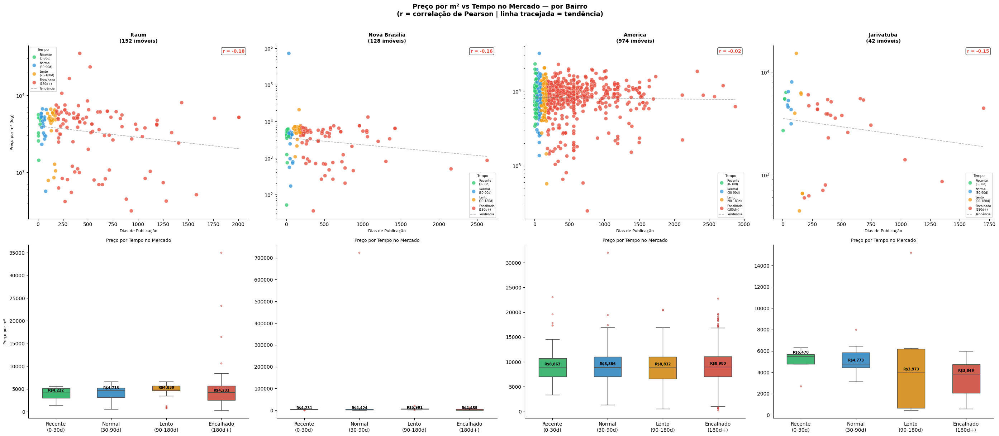

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` 

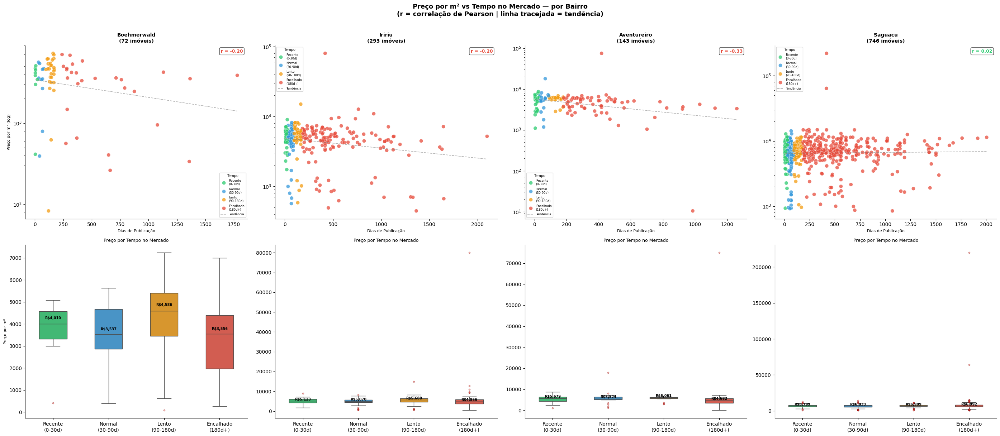

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` 

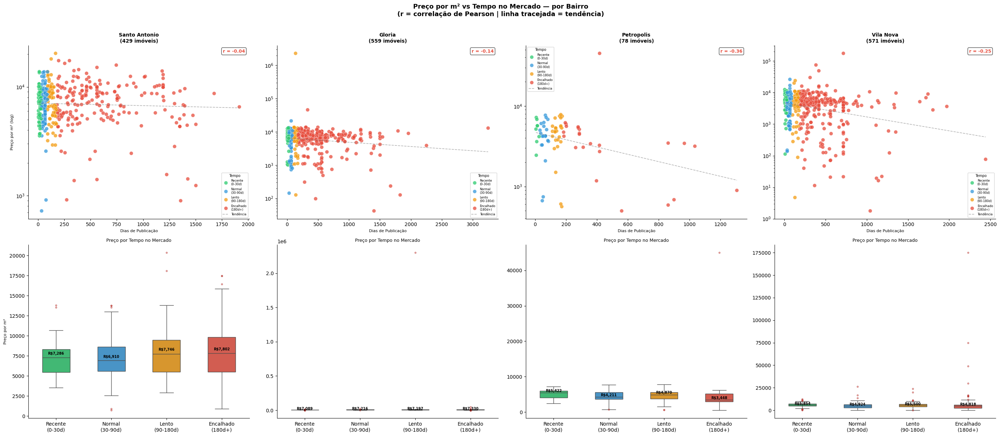

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` 

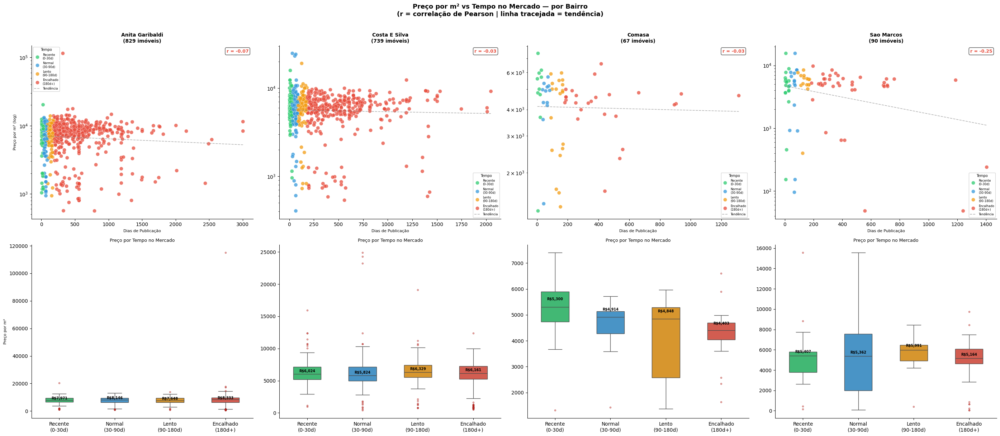

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` 

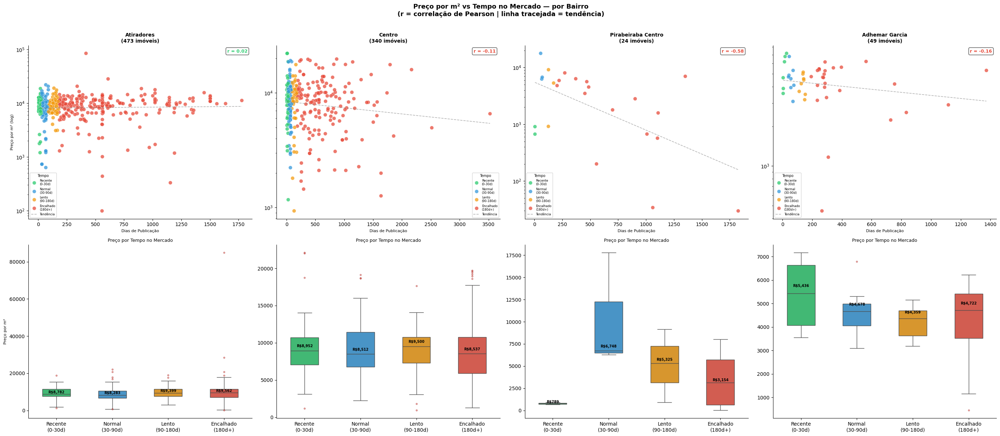

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` 

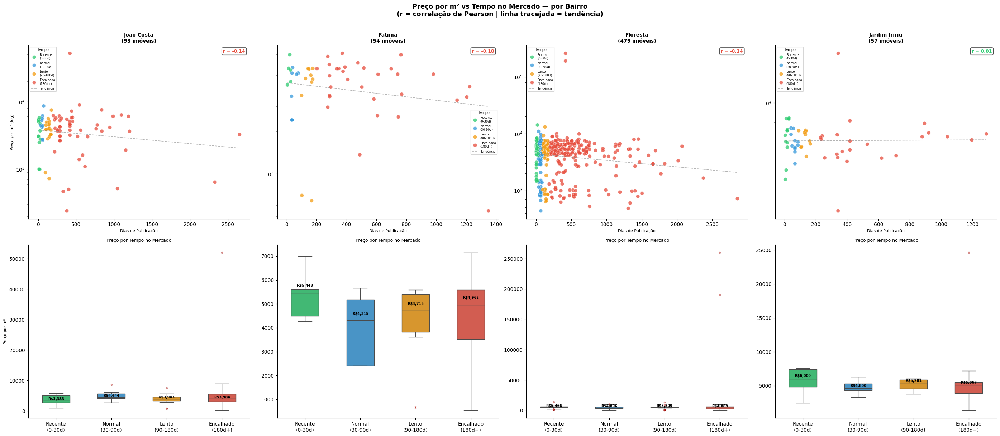

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` 

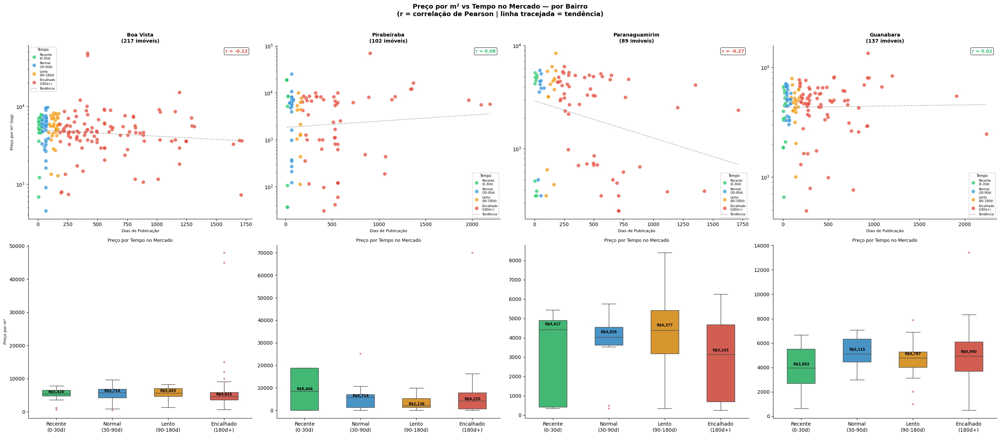

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` 

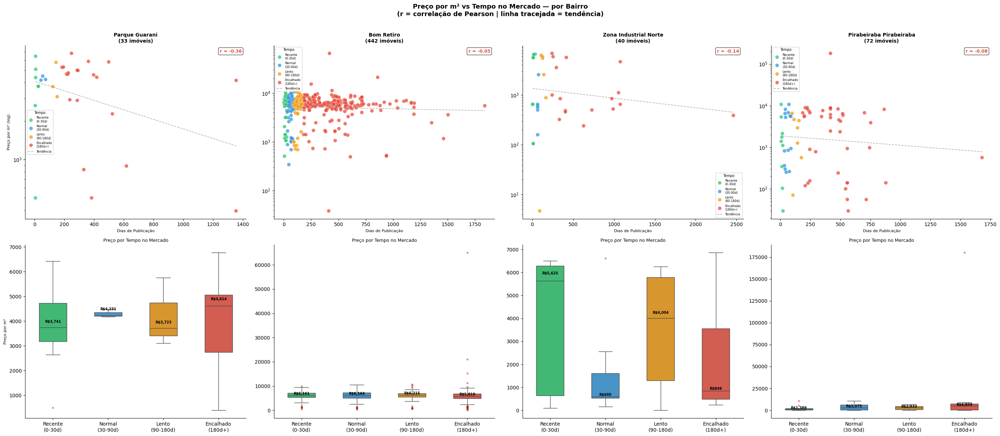

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` 

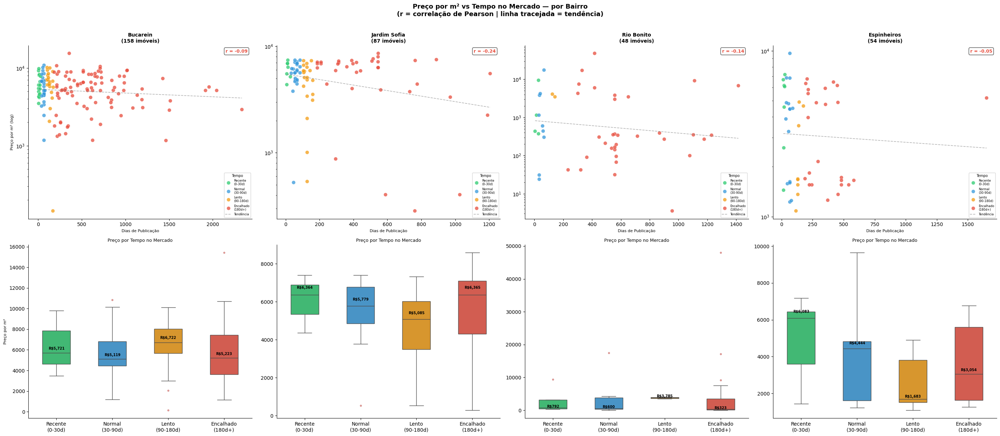

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` 

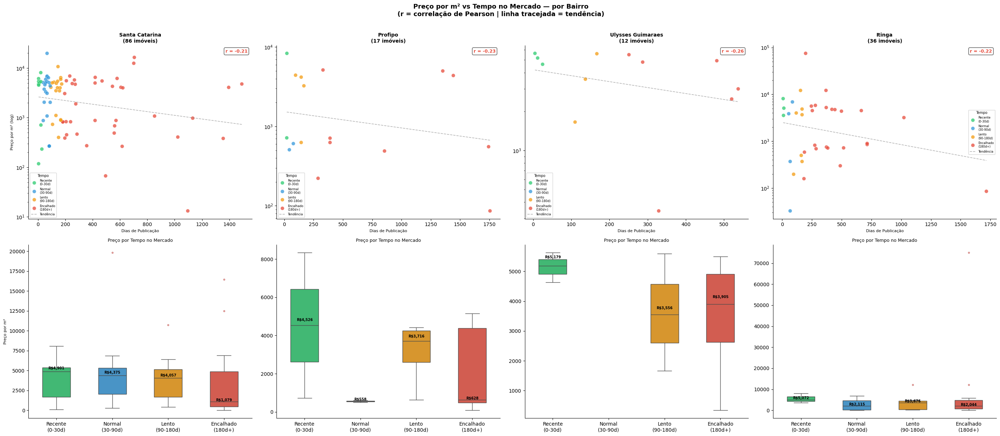

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` 

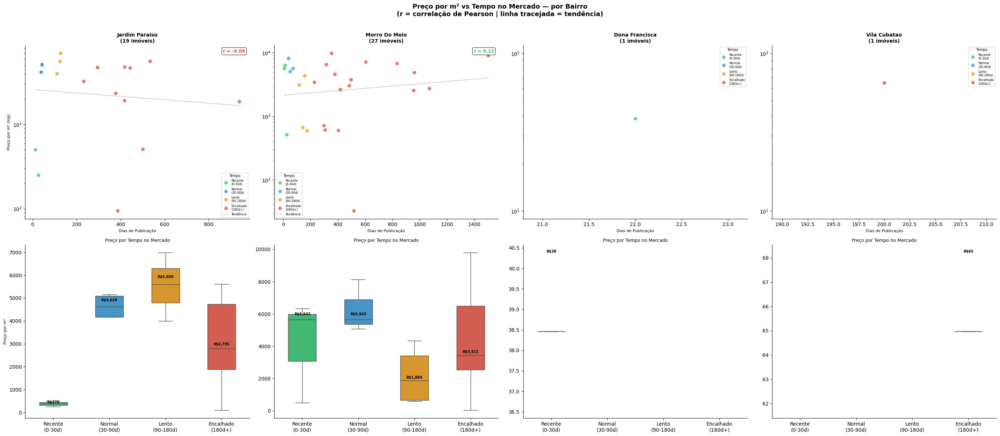

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\387817580.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


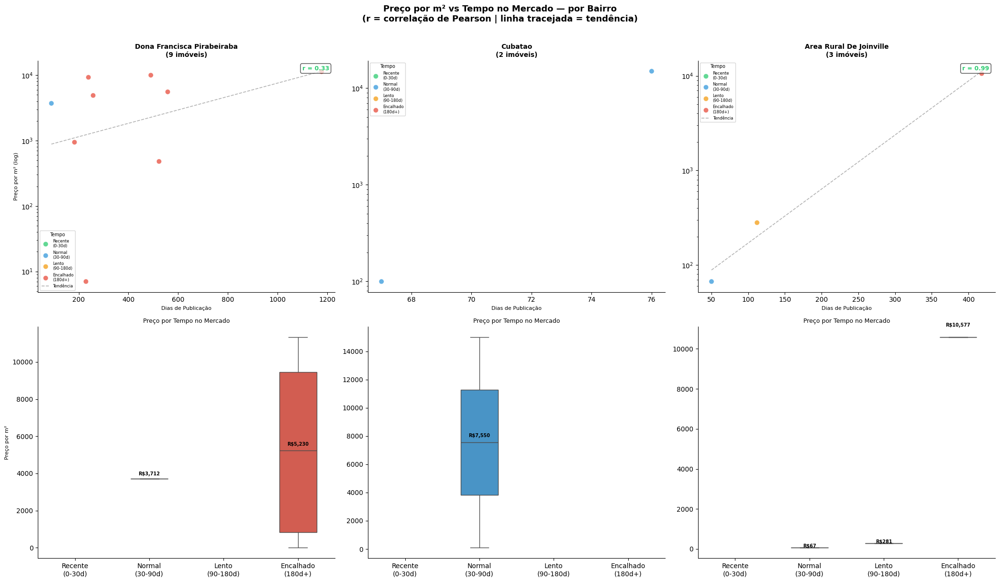

: 

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Criar categorias de tempo no mercado
bins  = [0, 30, 90, 180, np.inf]
labels = ['Recente\n(0-30d)', 'Normal\n(30-90d)', 'Lento\n(90-180d)', 'Encalhado\n(180d+)']
pd_data_lat_log_completo['tempo_mercado'] = pd.cut(pd_data_lat_log_completo['dias_publicacao'], bins=bins, labels=labels)

palette_tempo = {
    'Recente\n(0-30d)' : '#2ecc71',
    'Normal\n(30-90d)' : '#3498db',
    'Lento\n(90-180d)'  : '#f39c12',
    'Encalhado\n(180d+)': '#e74c3c'
}

bairros = pd_data_lat_log_completo['bairro'].unique()
chunks  = [bairros[i:i+4] for i in range(0, len(bairros), 4)]

for chunk in chunks:
    fig, axes = plt.subplots(2, len(chunk), figsize=(7 * len(chunk), 12))

    if len(chunk) == 1:
        axes = axes.reshape(2, 1)

    for col, bairro in enumerate(chunk):
        df_b = pd_data_lat_log_completo[pd_data_lat_log_completo['bairro'] == bairro].dropna(subset=['dias_publicacao','preco_por_m2'])
        # ── Linha 1: Scatter com hue = tempo_mercado ──────────────────────
        ax1 = axes[0, col]

        sns.scatterplot(
            x='dias_publicacao', y='preco_por_m2',
            hue='tempo_mercado', palette=palette_tempo,
            data=df_b, alpha=0.75, s=55,
            edgecolor='white', linewidth=0.4, ax=ax1
        )

        # Linha de tendência geral
        if len(df_b) > 2:
            z = np.polyfit(df_b['dias_publicacao'], np.log10(df_b['preco_por_m2']), 1)
            x_l = np.linspace(df_b['dias_publicacao'].min(), df_b['dias_publicacao'].max(), 100)
            ax1.plot(x_l, 10**np.poly1d(z)(x_l), 'gray', linestyle='--', linewidth=1.2, alpha=0.6, label='Tendência')

        # Correlação
        if len(df_b) > 2:
            r, p = pearsonr(df_b['dias_publicacao'], np.log10(df_b['preco_por_m2']))
            cor_texto = '#2ecc71' if r > 0 else '#e74c3c'
            ax1.text(0.98, 0.98, f'r = {r:.2f}', transform=ax1.transAxes,
                     fontsize=9, fontweight='bold', color=cor_texto, ha='right', va='top',
                     bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

        ax1.set_yscale('log')
        ax1.set_title(f'{bairro.title()}\n({len(df_b)} imóveis)', fontsize=10, fontweight='bold')
        ax1.set_xlabel('Dias de Publicação', fontsize=8)
        ax1.set_ylabel('Preço por m² (log)' if col == 0 else '', fontsize=8)
        ax1.spines['top'].set_visible(False)
        ax1.spines['right'].set_visible(False)
        ax1.legend(title='Tempo', fontsize=6, title_fontsize=7)

        # ── Linha 2: Boxplot preço por categoria de tempo ────────────────
        ax2 = axes[1, col]

        sns.boxplot(
            x='tempo_mercado', y='preco_por_m2',
            palette=palette_tempo, data=df_b,
            width=0.5, linewidth=1, order=labels,
            flierprops=dict(marker='o', markersize=3, alpha=0.4,
                            markerfacecolor='#e74c3c', markeredgecolor='darkred'),
            ax=ax2
        )

        # Mediana em texto
        for i, label in enumerate(labels):
            vals = df_b[df_b['tempo_mercado'] == label]['preco_por_m2']
            if len(vals) > 0:
                med = vals.median()
                ax2.text(i, med * 1.05, f'R${med:,.0f}',
                         ha='center', fontsize=7, fontweight='bold')

        ax2.set_title('Preço por Tempo no Mercado', fontsize=9)
        ax2.set_xlabel('')
        ax2.set_ylabel('Preço por m²' if col == 0 else '', fontsize=8)
        ax2.spines['top'].set_visible(False)
        ax2.spines['right'].set_visible(False)

    plt.suptitle('Preço por m² vs Tempo no Mercado — por Bairro\n(r = correlação de Pearson | linha tracejada = tendência)',
                 fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    plt.show()

**Boxplot de Preço por Tipo de Imóvel por Bairro**

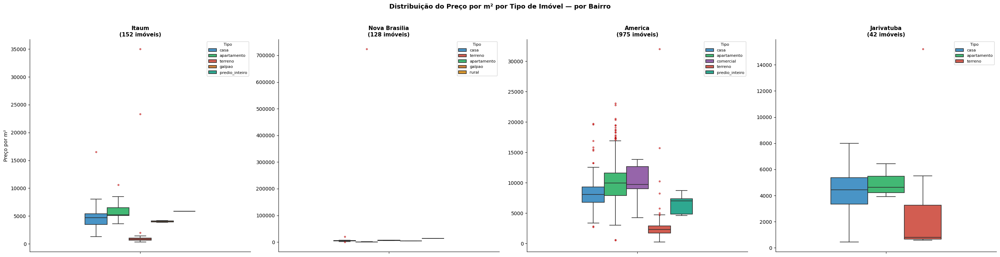

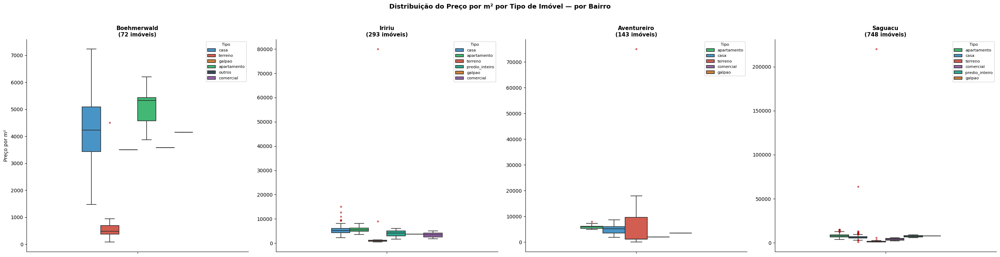

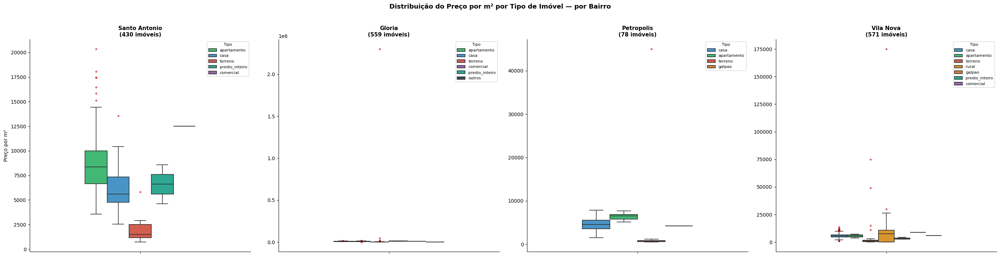

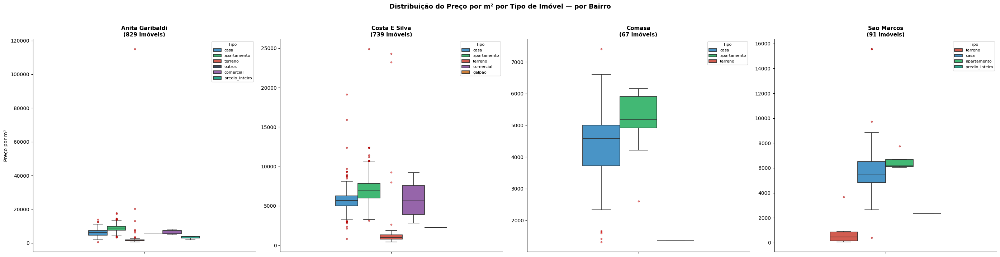

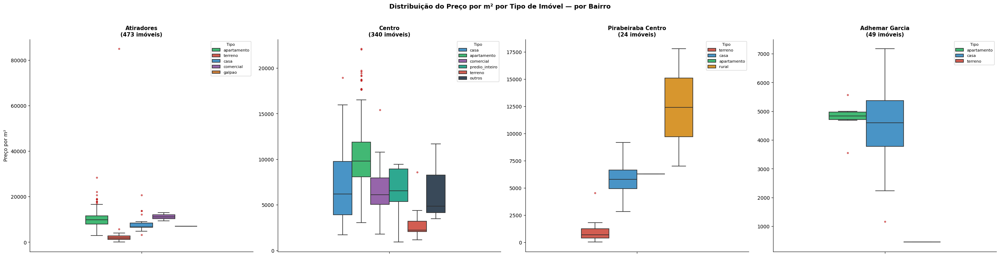

...

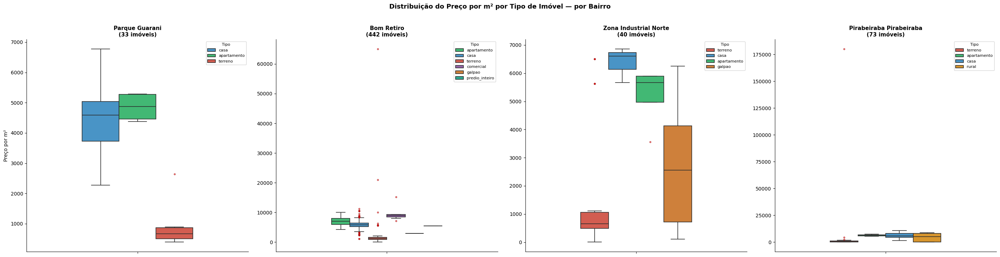

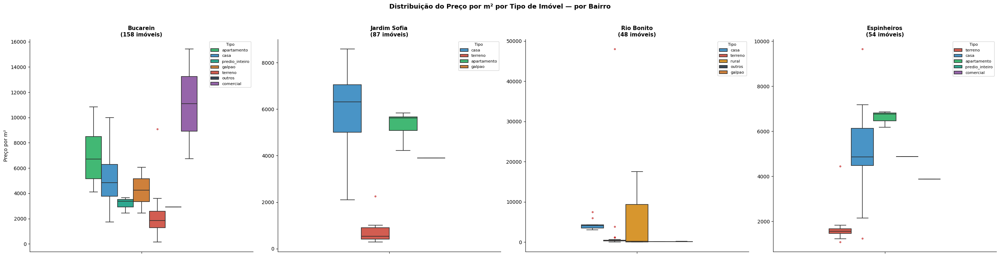

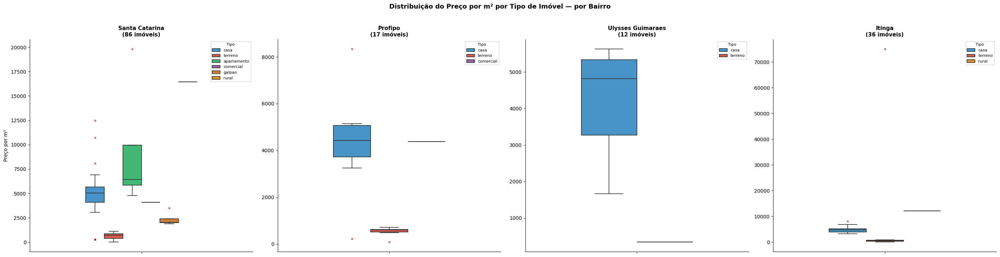

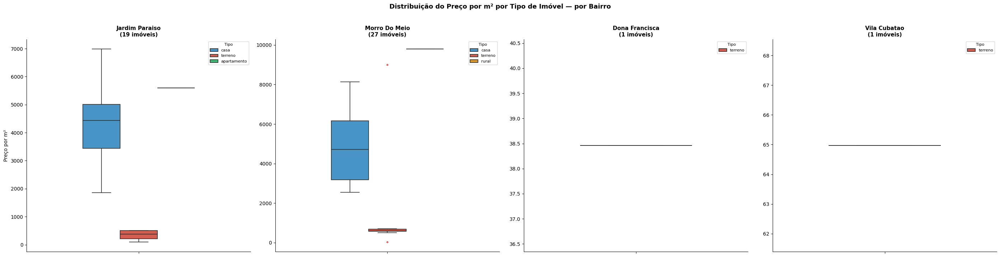

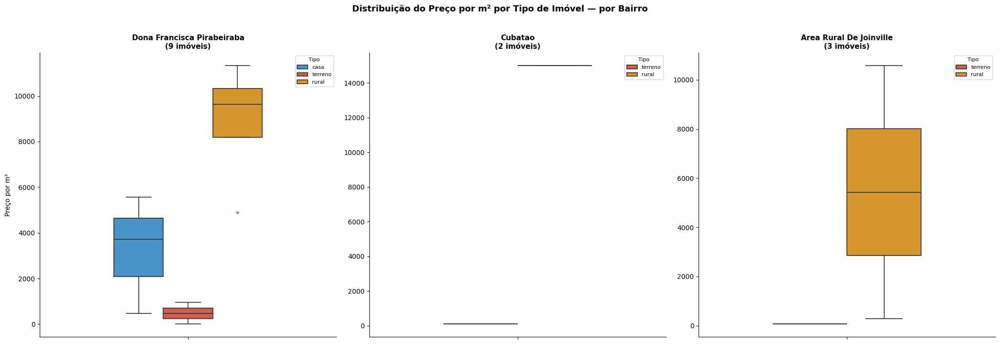

: 

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

bairros = pd_data_lat_log_completo['bairro'].unique()

# Paleta fixa por tipo de imóvel
palette = {tipo: cor for tipo, cor in zip(
    pd_data_lat_log_completo['tipo_imovel'].unique(),
    ['#3498db', '#2ecc71', '#e74c3c', '#f39c12', '#9b59b6', '#1abc9c', '#e67e22', '#34495e']
)}

chunk_size = 4
chunks = [bairros[i:i+chunk_size] for i in range(0, len(bairros), chunk_size)]

for chunk in chunks:
    fig, axes = plt.subplots(1, len(chunk), figsize=(7 * len(chunk), 7))

    if len(chunk) == 1:
        axes = [axes]

    for ax, bairro in zip(axes, chunk):
        df_bairro = pd_data_lat_log_completo[pd_data_lat_log_completo['bairro'] == bairro]
        
        flierprops=dict(marker='o', 
                        markersize=3, 
                        alpha=0.5, 
                        markerfacecolor='red', 
                        markeredgecolor='darkred'
                        )

        sns.boxplot(
            y='preco_por_m2',
            hue='tipo_imovel',
            data=df_bairro,
            palette=palette,
            width=0.5,
            linewidth=1.2,
            flierprops=flierprops,  # outliers menores
            ax=ax
        )

        total = df_bairro.shape[0]
        ax.set_title(f'{bairro.title()}\n({total} imóveis)', fontsize=11, fontweight='bold')
        ax.set_ylabel('Preço por m²' if ax == axes[0] else '', fontsize=10)
        ax.set_xlabel('')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend(title='Tipo', fontsize=8, title_fontsize=8, loc='upper right')

    plt.suptitle('Distribuição do Preço por m² por Tipo de Imóvel — por Bairro',
                 fontsize=13, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

**Agregando os dados por bairro e tipo de imovel**

In [ ]:
pd_data_metragem = pd_data_lat_log_completo.groupby(['bairro', 'tipo_imovel'])['preco_por_m2'].aggregate(['mean', 'count', 'median', 'std', 'min', 'max'])

: 

In [ ]:
pd_data_metragem.head()

mean  count       median          std  \
bairro         tipo_imovel                                                 
adhemar garcia apartamento  4744.341091      6  4830.808081   659.840187   
               casa         4550.295162     42  4599.909139  1284.089539   
               terreno       456.000000      1   456.000000          NaN   
america        apartamento  9932.302533    613  9990.153846  3117.186816   
               casa         8242.041896    278  8073.936356  2434.534107   

                                    min           max  
bairro         tipo_imovel                             
adhemar garcia apartamento  3556.574468   5566.037736  
               casa         1166.666667   7169.811321  
               terreno       456.000000    456.000000  
america        apartamento   573.874097  23057.725000  
               casa         2737.500000  19700.748130

: 

In [ ]:
agregado = pd_data_lat_log_completo.pivot_table(
    index='bairro',
    columns='tipo_imovel',
    values='preco_por_m2',
    aggfunc=['mean', 'count', 'median', 'std', 'min', 'max']
)

: 

In [ ]:
agregado.head()

mean                                     \
tipo_imovel               apartamento         casa     comercial  galpao   
bairro                                                                     
adhemar garcia            4744.341091  4550.295162           NaN     NaN   
america                   9932.302533  8242.041896  10230.589071     NaN   
anita garibaldi           8853.676275  6138.227335   6623.718320     NaN   
area rural de joinville           NaN          NaN           NaN     NaN   
atiradores               10021.794233  7620.689818  11155.607461  7000.0   

                                                                               \
tipo_imovel                   outros predio_inteiro        rural      terreno   
bairro                                                                          
adhemar garcia                   NaN            NaN          NaN   456.000000   
america                          NaN    6511.428028          NaN  3268.643855   
anita garibaldi          5815.789474    3293.997699          NaN  3645.422770   
area rural de joinville          NaN            NaN  5428.812416    67.010309   
atiradores                       NaN            NaN          NaN  4332.775261   

                              count         ...         min              \
tipo_imovel             apartamento   casa  ...       rural     terreno   
bairro                                      ...                           
adhemar garcia                  6.0   42.0  ...         NaN  456.000000   
america                       613.0  278.0  ...         NaN  248.403123   
anita garibaldi               586.0  159.0  ...         NaN  565.428110   
area rural de joinville         NaN    NaN  ...  280.701754   67.010309   
atiradores                    390.0   44.0  ...         NaN   98.654598   

                                  max                                      \
tipo_imovel               apartamento          casa     comercial  galpao   
bairro                                                                      
adhemar garcia            5566.037736   7169.811321           NaN     NaN   
america                  23057.725000  19700.748130  13846.153846     NaN   
anita garibaldi          17730.275229  13909.774436   8175.841270     NaN   
area rural de joinville           NaN           NaN           NaN     NaN   
atiradores               28367.307692  20689.655172  13015.873016  7000.0   

                                                                   \
tipo_imovel                   outros predio_inteiro         rural   
bairro                                                              
adhemar garcia                   NaN            NaN           NaN   
america                          NaN    8709.422011           NaN   
anita garibaldi          5815.789474    4049.295775           NaN   
area rural de joinville          NaN            NaN  10576.923077   
atiradores                       NaN            NaN           NaN   

                                        
tipo_imovel                    terreno  
bairro                                  
adhemar garcia              456.000000  
america                   32004.000000  
anita garibaldi          115000.000000  
area rural de joinville      67.010309  
atiradores                84900.000000  

[5 rows x 48 columns]

: 

**Visualizando os preços por m² por bairro e tipo de imovel**

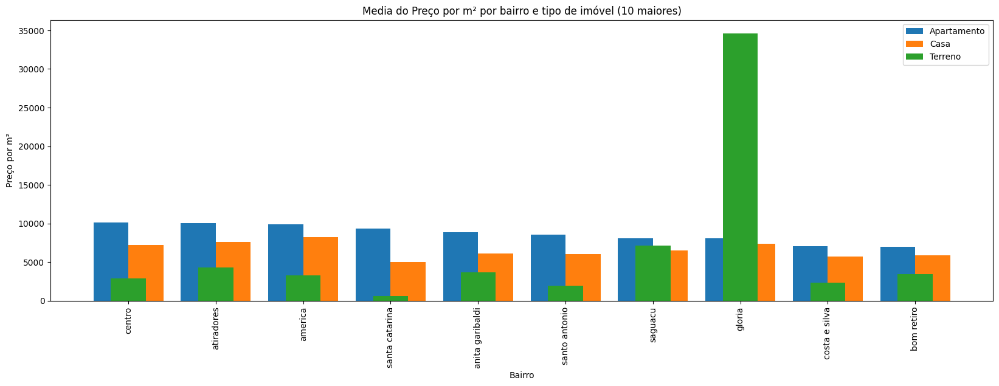

: 

In [ ]:
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

# Seleciona os 20 bairros com maior preço médio de apartamento
bairros_top = agregado['mean']['apartamento'].sort_values(ascending=False).head(10).index

plt.figure(figsize=(20, 6))
plt.title("Media do Preço por m² por bairro e tipo de imóvel (10 maiores)")
plt.xlabel("Bairro")
plt.ylabel("Preço por m²")

# Barras lado a lado para apartamento e casa
largura = 0.4
x = range(len(bairros_top))

plt.bar([i - largura/2 for i in x], agregado['mean']['apartamento'].loc[bairros_top], width=largura, label='Apartamento')

if 'casa' in agregado['mean'].columns:
    plt.bar([i + largura/2 for i in x], agregado['mean']['casa'].loc[bairros_top], width=largura, label='Casa')

if 'terreno' in agregado['mean'].columns:
    plt.bar(x, agregado['mean']['terreno'].loc[bairros_top], width=largura, label='Terreno')

plt.xticks(x, bairros_top, rotation=90)
plt.legend()
#plt.tight_layout()
plt.show();

2026-03-05 09:48:03,021 - INFO - generated new fontManager


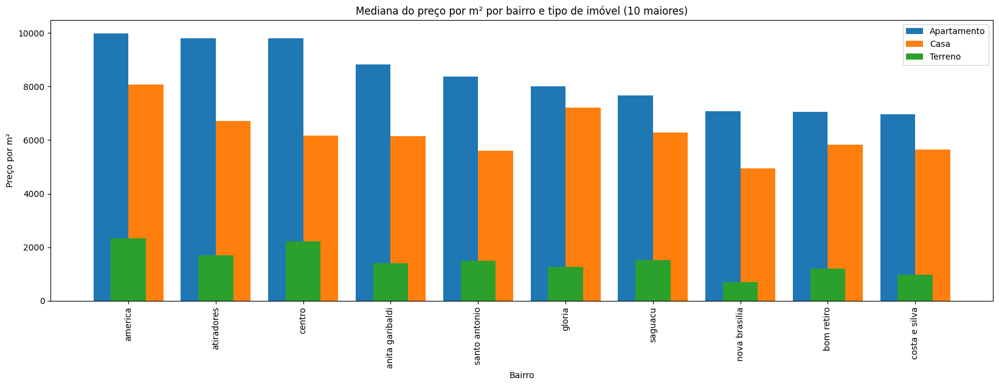

: 

In [ ]:
from matplotlib import pyplot as plt
import warnings

import matplotlib.font_manager
matplotlib.font_manager._load_fontmanager(try_read_cache=False)

warnings.filterwarnings("ignore", category=FutureWarning)

# Seleciona os 20 bairros com maior preço médio de apartamento
bairros_top = agregado['median']['apartamento'].sort_values(ascending=False).head(10).index

plt.figure(figsize=(20, 6))
plt.title("Mediana do preço por m² por bairro e tipo de imóvel (10 maiores)")
plt.xlabel("Bairro")
plt.ylabel("Preço por m²")

# Barras lado a lado para apartamento e casa
largura = 0.4
x = range(len(bairros_top))

plt.bar([i - largura/2 for i in x], agregado['median']['apartamento'].loc[bairros_top], width=largura, label='Apartamento')

if 'casa' in agregado['median'].columns:
    plt.bar([i + largura/2 for i in x], agregado['median']['casa'].loc[bairros_top], width=largura, label='Casa')

if 'terreno' in agregado['median'].columns:
    plt.bar(x, agregado['median']['terreno'].loc[bairros_top], width=largura, label='Terreno')

plt.xticks(x, bairros_top, rotation=90)
plt.legend()
#plt.tight_layout()
plt.show()

**Fazendo agrupamento do preco por m2 por faixa de precos, tipo de imovel e bairro.**

In [ ]:
pd_data_range_bairro_tipo_imovel = pd_data_range_bairro_tipo_imovel.loc[:, ~pd_data_range_bairro_tipo_imovel.columns.duplicated()]

: 

In [ ]:
df_pivot = pd_data_range_bairro_tipo_imovel.groupby(['faixa', 'tipo_imovel','bairro'])['preco_por_m2'].aggregate(['mean', 'median','min', 'max', 'count'])

df_pivot_median = df_pivot.pivot_table(
    index='bairro',
    columns=['tipo_imovel', 'faixa'],
    values=['median'],
    
)

df_pivot_media = df_pivot.pivot_table(
    index='bairro',
    columns=['tipo_imovel', 'faixa'],
    values=['mean'],
    
)


: 

In [ ]:
df_pivot.head()

mean        median  \
faixa       tipo_imovel bairro                                        
alto_padrao apartamento adhemar garcia    5283.018868   5283.018868   
                        america          13886.328828  13041.229508   
                        anita garibaldi  11241.390483  10885.465517   
                        atiradores       13814.828464  12950.000000   
                        aventureiro       6712.787380   6361.702128   

                                                  min           max  count  
faixa       tipo_imovel bairro                                              
alto_padrao apartamento adhemar garcia    5000.000000   5566.037736      2  
                        america          11584.717647  23057.725000    153  
                        anita garibaldi  10006.180000  17730.275229    147  
                        atiradores       11603.473282  28367.307692     97  
                        aventureiro       6140.350877   7913.907285      7

: 

**Plotando as medias e medianas de preco por m2 por bairro. Cada grafico tem o tipo de imovel e faixa de preco**

In [ ]:
mediana = df_pivot_median['median']
mediana.head()

tipo_imovel               apartamento                                          \
faixa                     alto_padrao       barato    medio_alto  medio_baixo   
bairro                                                                          
adhemar garcia            5283.018868  4119.196325   4888.888889  4772.727273   
america                  13041.229508  6527.536232  10708.333333  8840.707965   
anita garibaldi          10885.465517  6818.181818   9268.846154  8437.500000   
area rural de joinville           NaN          NaN           NaN          NaN   
atiradores               12950.000000  6903.404067  10628.977273  9000.000000   

tipo_imovel                      casa                                         \
faixa                     alto_padrao       barato   medio_alto  medio_baixo   
bairro                                                                         
adhemar garcia            6166.666667  3152.173913  5071.255061  4149.126838   
america                  10959.979900  5812.220566  8586.206897  7545.454545   
anita garibaldi           8489.361702  3582.876259  6865.133725  5427.272727   
area rural de joinville           NaN          NaN          NaN          NaN   
atiradores                9000.000000  5500.000000  7278.406681  6606.250000   

tipo_imovel                 comercial               ... predio_inteiro  \
faixa                     alto_padrao       barato  ...     medio_alto   
bairro                                              ...                  
adhemar garcia                    NaN          NaN  ...            NaN   
america                  13779.311475  8297.773655  ...    7374.631268   
anita garibaldi           7772.131161  4866.452991  ...    3913.934426   
area rural de joinville           NaN          NaN  ...            NaN   
atiradores               13015.873016  9375.000000  ...            NaN   

tipo_imovel                                  rural                         \
faixa                    medio_baixo   alto_padrao      barato medio_alto   
bairro                                                                      
adhemar garcia                   NaN           NaN         NaN        NaN   
america                  7018.992568           NaN         NaN        NaN   
anita garibaldi          3380.000000           NaN         NaN        NaN   
area rural de joinville          NaN  10576.923077  280.701754        NaN   
atiradores                       NaN           NaN         NaN        NaN   

tipo_imovel                              terreno                            \
faixa                   medio_baixo  alto_padrao       barato   medio_alto   
bairro                                                                       
adhemar garcia                  NaN          NaN   456.000000          NaN   
america                         NaN  4576.674197  1441.441441  2724.625542   
anita garibaldi                 NaN  2474.402730   987.816925  1507.321275   
area rural de joinville         NaN          NaN    67.010309          NaN   
atiradores                      NaN  4021.739130   732.017823  2206.388182   

tipo_imovel                           
faixa                    medio_baixo  
bairro                                
adhemar garcia                   NaN  
america                  2017.054364  
anita garibaldi          1306.104608  
area rural de joinville          NaN  
atiradores               1295.756398  

[5 rows x 31 columns]

: 

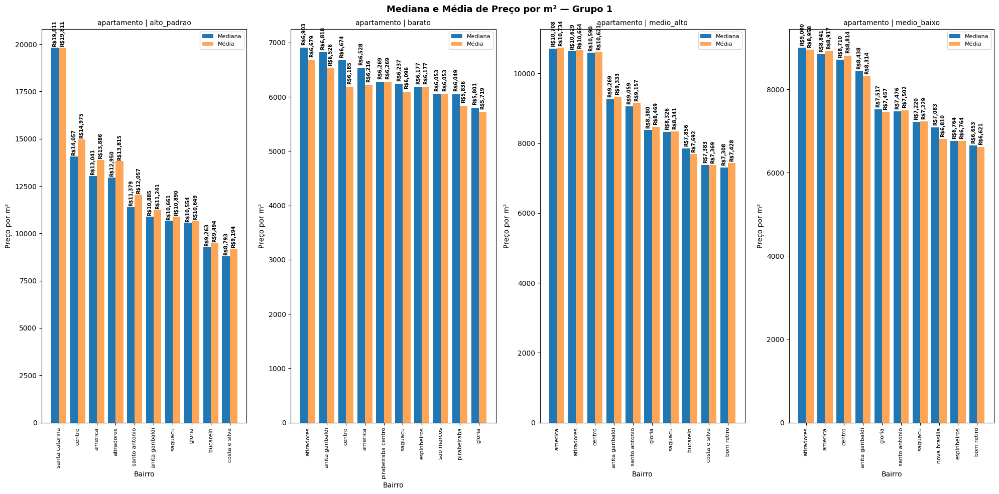

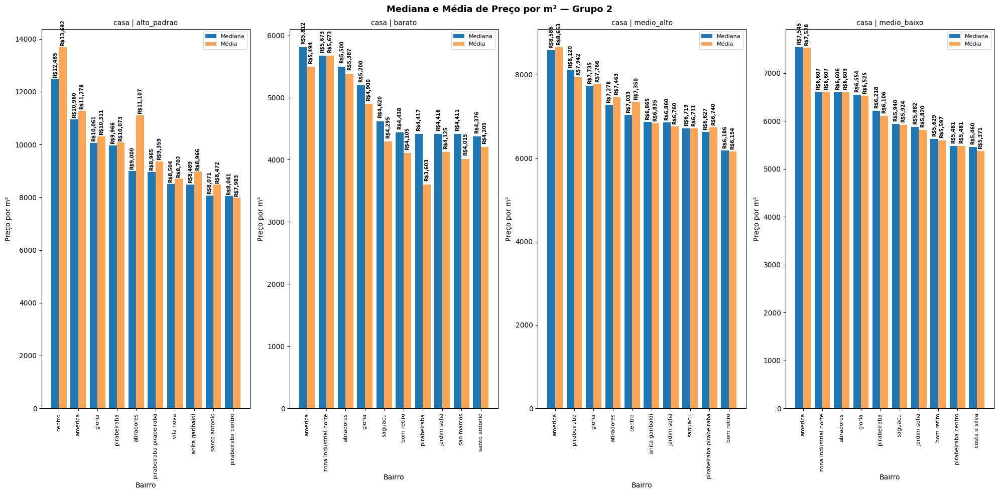

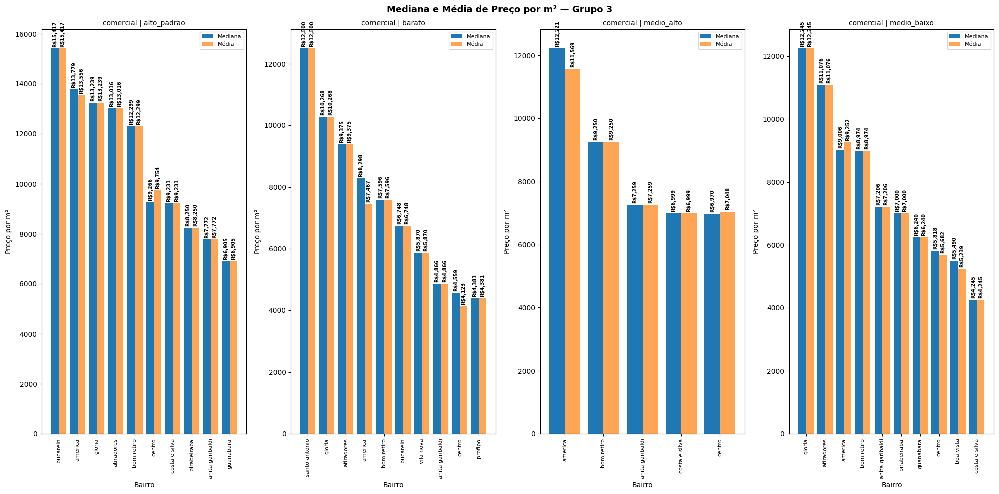

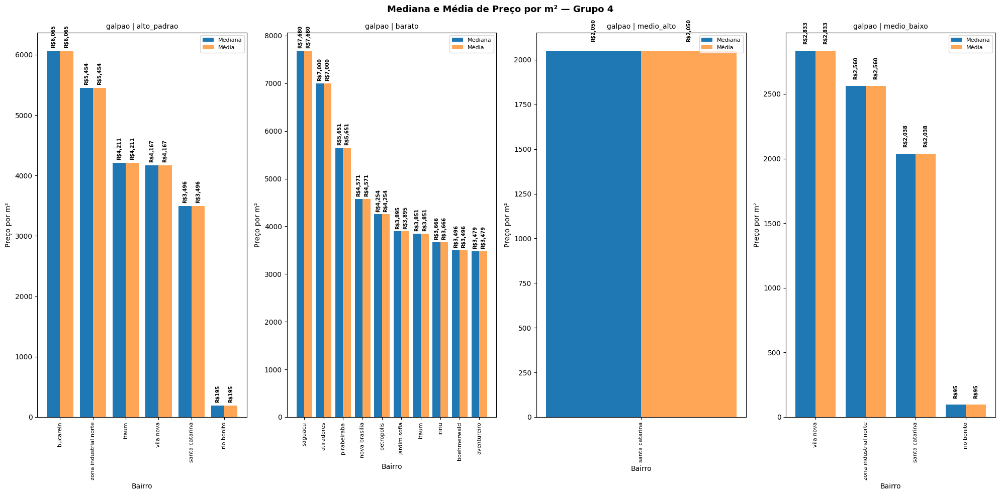

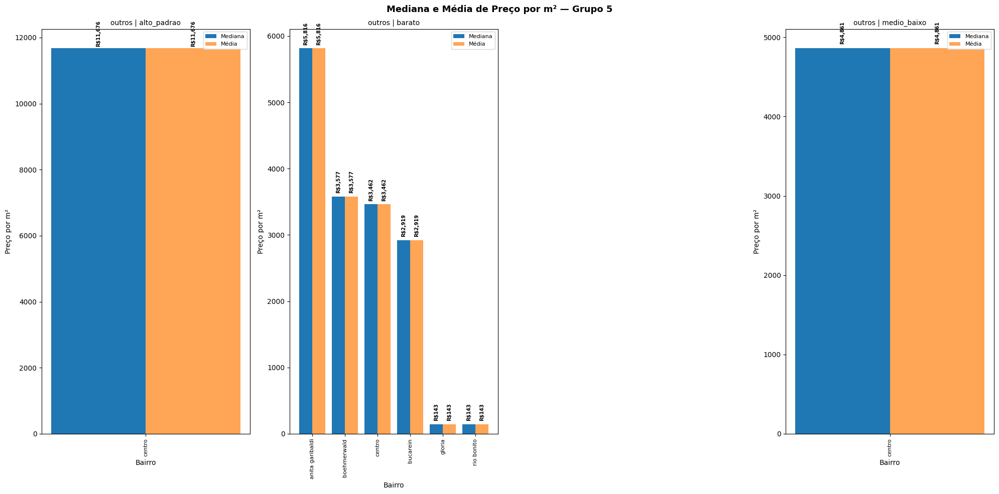

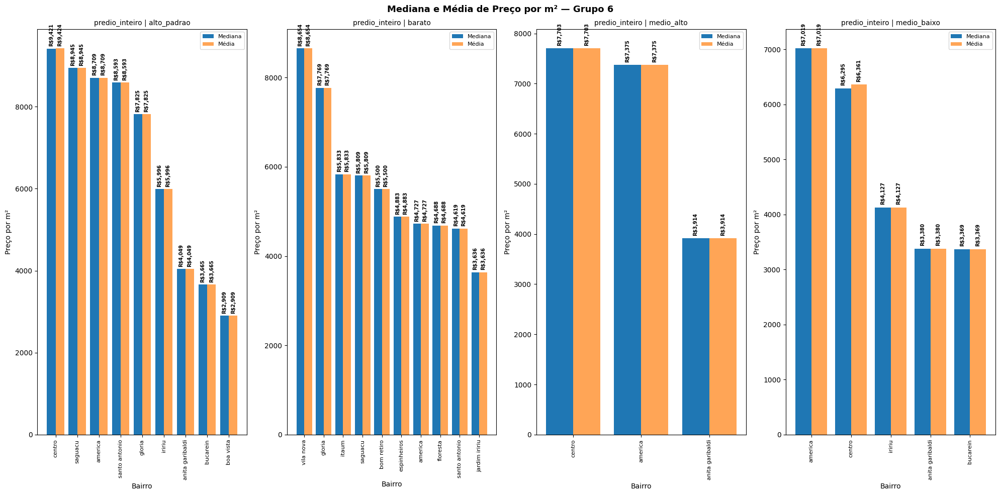

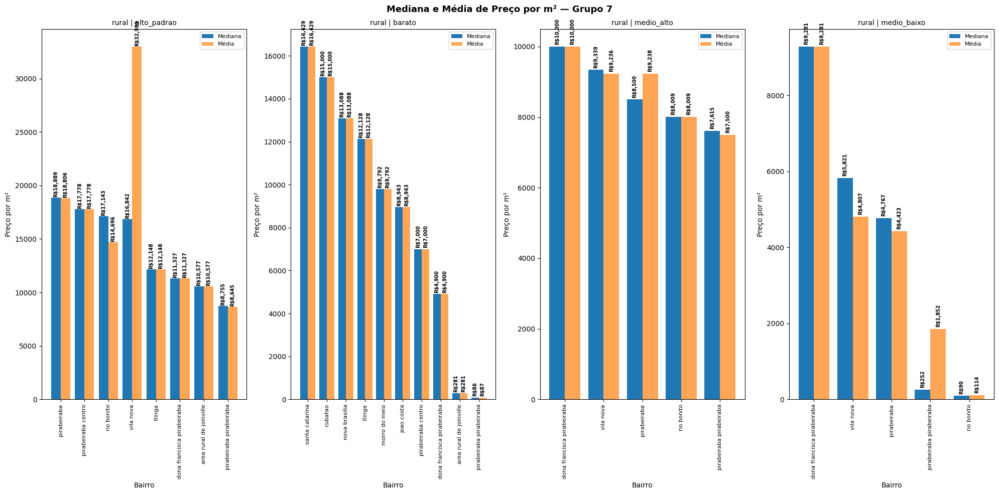

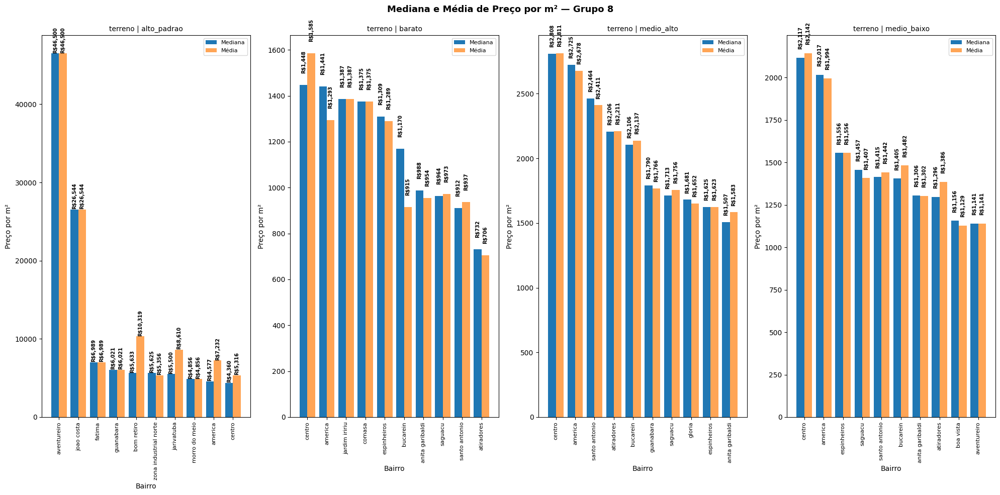

: 

In [ ]:
tipos_imoveis = df_pivot_median['median'].columns.get_level_values(0).unique()
classificacoes = df_pivot_median['median'].columns.get_level_values(1).unique()

combinacoes = [(tipo, classe) for tipo in tipos_imoveis for classe in classificacoes]

# De 4 em 4
chunk_size = 4
for i in range(0, len(combinacoes), chunk_size):
    grupo = combinacoes[i:i + chunk_size]
    
    fig, axes = plt.subplots(1, len(grupo), figsize=(20 * len(grupo) // 4, 10))
    
    # Garantir que axes seja sempre lista
    if len(grupo) == 1:
        axes = [axes]
    
    for ax, (tipo, classe) in zip(axes, grupo):
        try:
            mediana = df_pivot_median['median'][tipo][classe].sort_values(ascending=False).dropna().head(10)
            media   = df_pivot_media['mean'][tipo][classe].reindex(mediana.index)

            x = np.arange(len(mediana))
            width = 0.4

            bars1 = ax.bar(x - width/2, mediana.values, width=width, label='Mediana')
            bars2 = ax.bar(x + width/2, media.values,   width=width, label='Média', alpha=0.7)

            for bar in bars1:
                ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 50,
                        f'R${bar.get_height():,.0f}', ha='center', va='bottom', fontsize=7, fontweight='bold', rotation=90)

            for bar in bars2:
                ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 50,
                        f'R${bar.get_height():,.0f}', ha='center', va='bottom', fontsize=7, fontweight='bold', rotation=90)

            ax.set_xticks(x)
            ax.set_xticklabels(mediana.index, rotation=90, fontsize=8)
            ax.set_title(f'{tipo} | {classe}', fontsize=10)
            ax.set_xlabel('Bairro')
            ax.set_ylabel('Preço por m²')
            ax.legend(fontsize=8)

        except KeyError:
            ax.set_visible(False)

    plt.suptitle(f'Mediana e Média de Preço por m² — Grupo {i // chunk_size + 1}', fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()

**Verificando a diferenca entre o preco por m2 entre a mediana de apartamento e a mediana de casa.Verificando se a alguma discrepancia entre os precos entre casa e apartamento**

In [ ]:
df_agregado_pivot= (pd_data_range_bairro_tipo_imovel.groupby(['bairro', 'tipo_imovel'])['preco_por_m2'].aggregate(['mean', 'median'])).pivot_table(
    index='bairro',
    columns=['tipo_imovel']
    
)
diferenca_mediana_geral = round((df_agregado_pivot['median']['apartamento'] - df_agregado_pivot['median']['casa']) * 100 / df_agregado_pivot['mean']['casa'], 3)

diferenca_mediana_geral.sort_values(ascending=False)

bairro
centro                        50.410
santo antonio                 45.878
anita garibaldi               43.967
nova brasilia                 42.461
petropolis                    42.076
atiradores                    40.683
espinheiros                   37.453
bucarein                      36.788
fatima                        31.585
jardim paraiso                27.756
santa catarina                27.595
joao costa                    26.436
boehmerwald                   25.505
america                       23.249
costa e silva                 23.062
guanabara                     22.996
floresta                      22.323
saguacu                       21.055
bom retiro                    20.832
aventureiro                   15.671
comasa                        13.707
sao marcos                    12.232
gloria                        10.797
itaum                         10.316
pirabeiraba pirabeiraba        9.033
pirabeiraba centro             8.494
iririu                         

: 

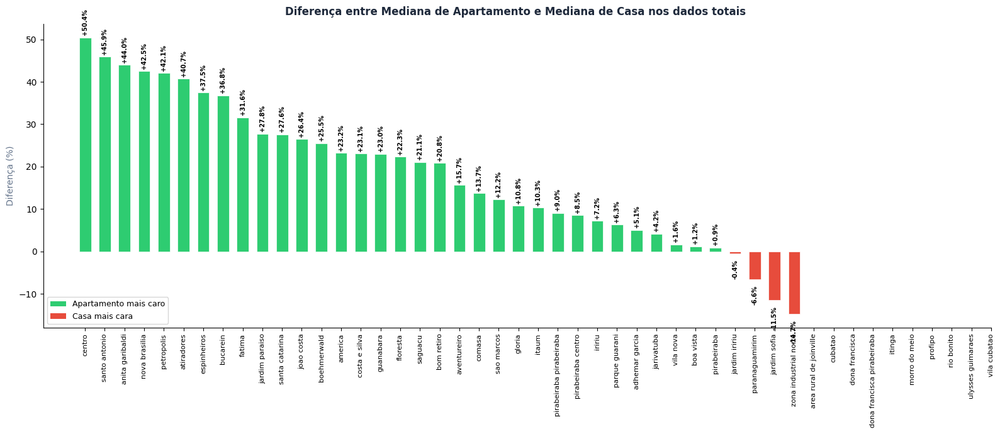

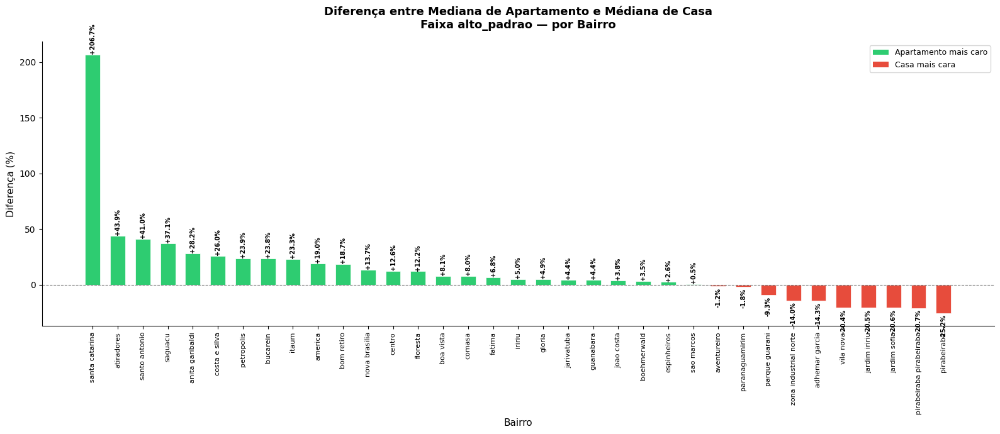

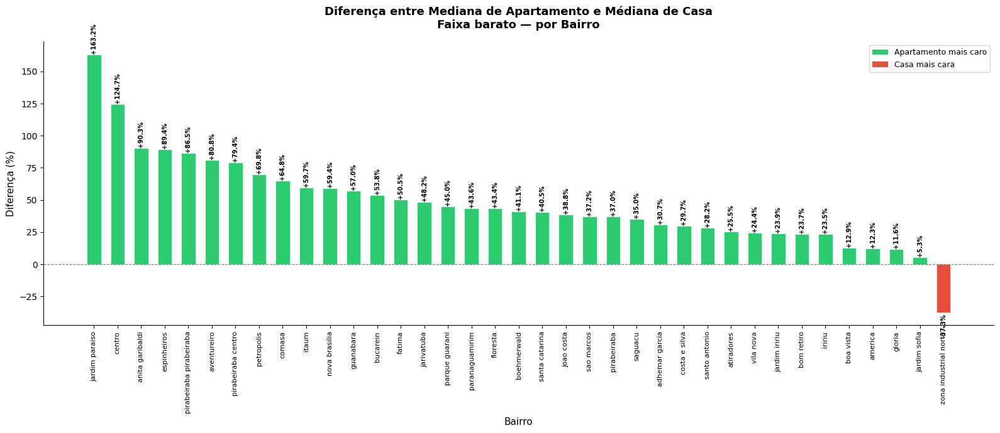

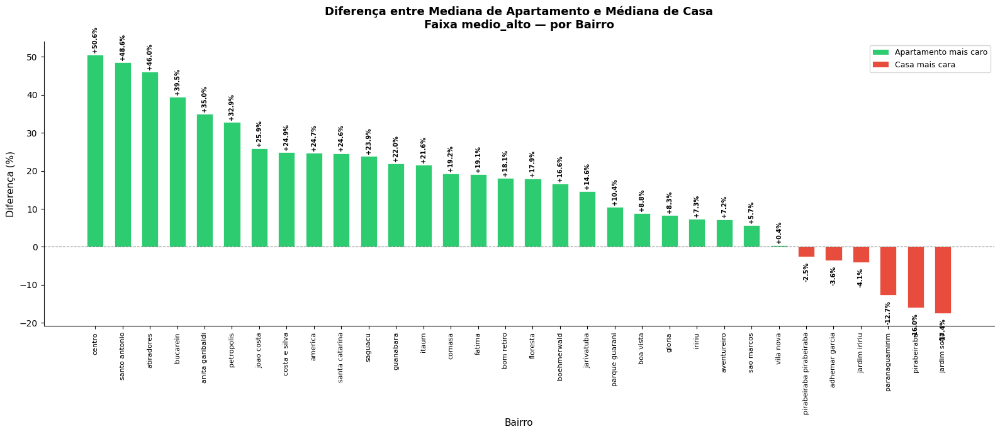

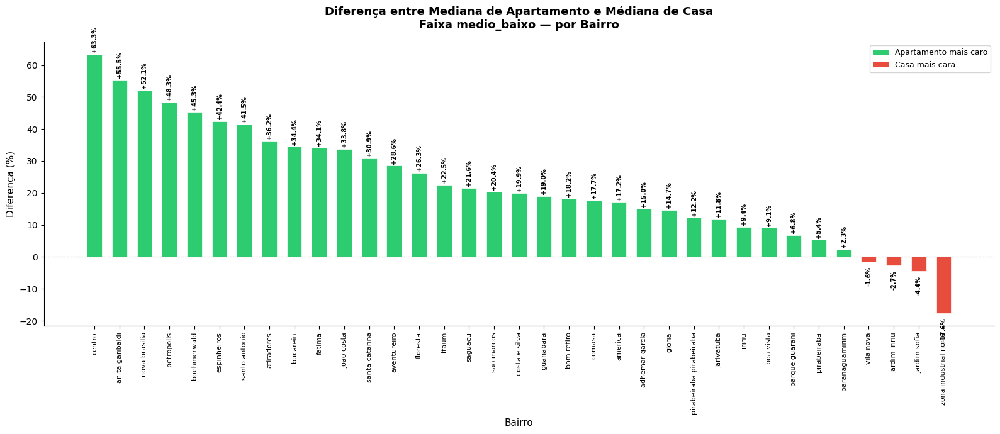

: 

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
df_agregado_pivot= (pd_data_range_bairro_tipo_imovel.groupby(['bairro', 'tipo_imovel'])['preco_por_m2'].aggregate(['mean', 'median'])).pivot_table(
    index='bairro',
    columns=['tipo_imovel']
    
)
diferenca_mediana_geral = round((df_agregado_pivot['median']['apartamento'] - df_agregado_pivot['median']['casa']) * 100 / df_agregado_pivot['mean']['casa'], 3)

diferenca_mediana_geral_sort = diferenca_mediana_geral.sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(16, 7))

cores = ['#2ecc71' if v >= 0 else '#e74c3c' for v in diferenca_mediana_geral_sort.values]

bars = ax.bar(diferenca_mediana_geral_sort.index, diferenca_mediana_geral_sort.values, width=0.6, edgecolor='white', linewidth=0.5, color=cores)

# Valores nas barras
for bar in bars:
    height = bar.get_height()
    offset = 0.5 if height >= 0 else -1.5
    va     = 'bottom' if height >= 0 else 'top'
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        height + offset,
        f'{height:+.1f}%',
        ha='center', va=va,
        fontsize=7, fontweight='bold', rotation=90,
        color='black'
    )

ax.set_title('Diferença entre Mediana de Apartamento e Mediana de Casa nos dados totais ', fontsize=12, fontweight='bold', color='#1e293b', pad=10)
ax.set_ylabel('Diferença (%)', color='#64748b', fontsize=10)
ax.set_xticks(range(len(diferenca_mediana_geral_sort)))
ax.set_xticklabels(diferenca_mediana_geral_sort.index, rotation=90, fontsize=8)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

legend_elements = [Patch(facecolor='#2ecc71', label='Apartamento mais caro'),
                    Patch(facecolor='#e74c3c', label='Casa mais cara')]
ax.legend(handles=legend_elements, fontsize=9)
plt.tight_layout()
plt.show()


for tipo in classificacoes:

    apartamento_alto_padrao = df_pivot_median['median']['apartamento'][tipo]
    casa_alto_padrao        = df_pivot_median['median']['casa'][tipo]

    diferenca = (round((apartamento_alto_padrao - casa_alto_padrao) / casa_alto_padrao, 4) * 100).sort_values(ascending=False).dropna()

    # Cor condicional: verde se positivo, vermelho se negativo
    cores = ['#2ecc71' if v >= 0 else '#e74c3c' for v in diferenca.values]

    fig, ax = plt.subplots(figsize=(16, 7))

    bars = ax.bar(diferenca.index, diferenca.values, width=0.6, color=cores, edgecolor='white', linewidth=0.5)

    # Valores nas barras
    for bar in bars:
        height = bar.get_height()
        offset = 0.5 if height >= 0 else -1.5
        va     = 'bottom' if height >= 0 else 'top'
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            height + offset,
            f'{height:+.1f}%',
            ha='center', va=va,
            fontsize=7, fontweight='bold', rotation=90,
            color='black'
        )

    # Linha de referência no zero
    ax.axhline(0, color='gray', linewidth=0.8, linestyle='--')

    ax.set_xticks(range(len(diferenca)))
    ax.set_xticklabels(diferenca.index, rotation=90, fontsize=8)
    ax.set_title(f'Diferença entre Mediana de Apartamento e Médiana de Casa\nFaixa {tipo} — por Bairro', fontsize=13, fontweight='bold', pad=15)
    ax.set_xlabel('Bairro', fontsize=11)
    ax.set_ylabel('Diferença (%)', fontsize=11)

    # Legenda manual
    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor='#2ecc71', label='Apartamento mais caro'),
                    Patch(facecolor='#e74c3c', label='Casa mais cara')]
    ax.legend(handles=legend_elements, fontsize=9)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    plt.tight_layout()
    plt.show()

**Verificando a quantidade em porcentagem de tipos de imóvel por bairro**

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a

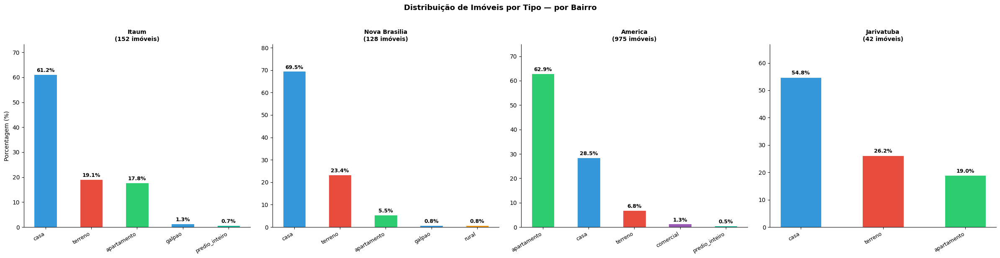

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a

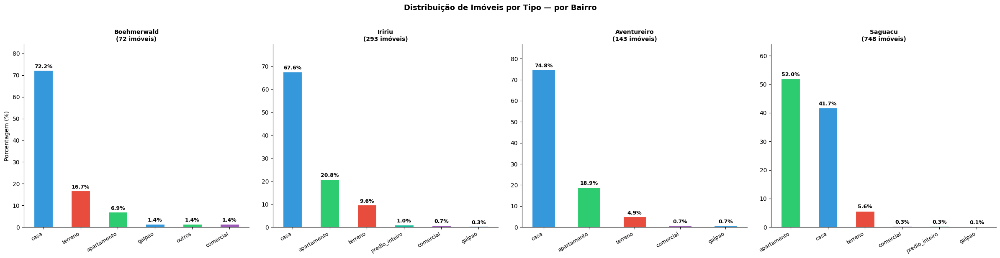

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a

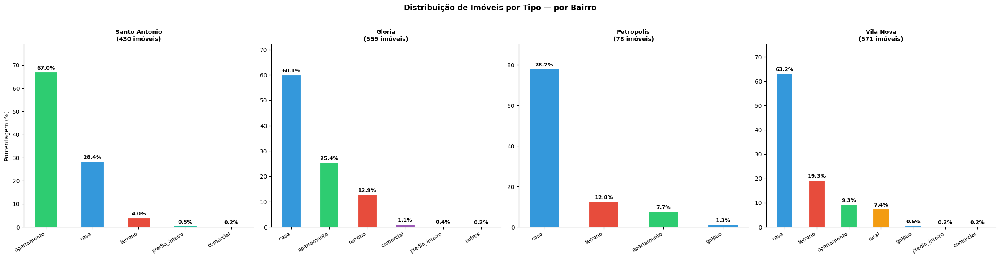

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a

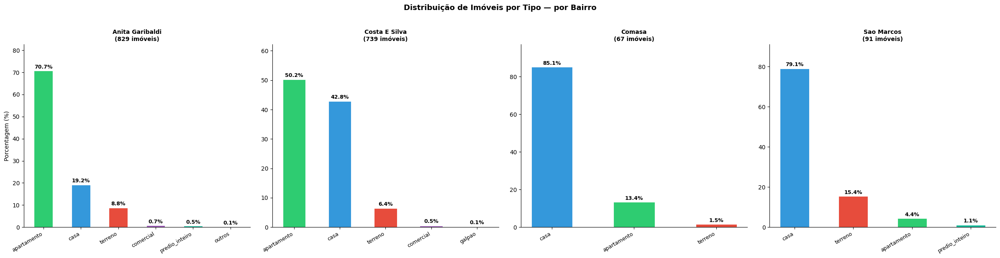

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a

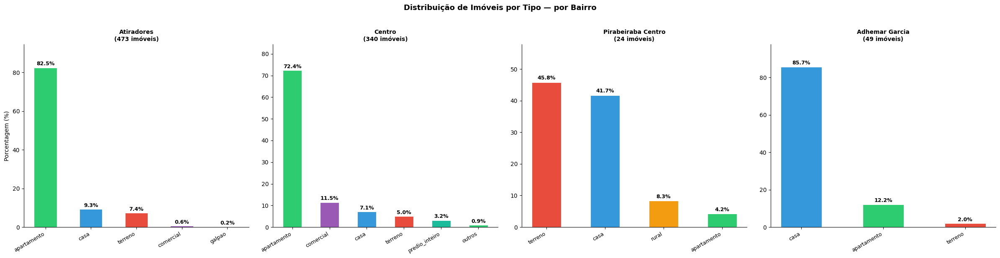

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a

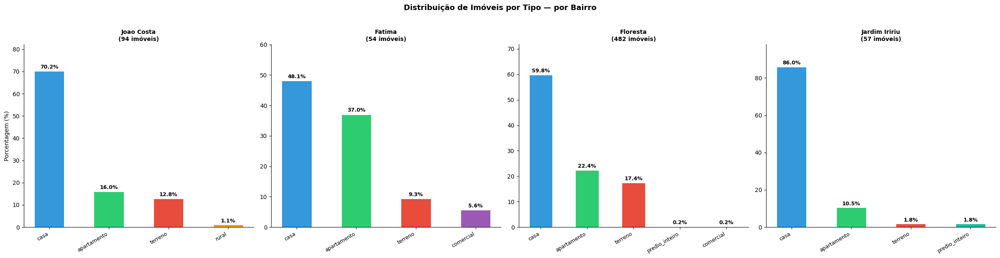

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a

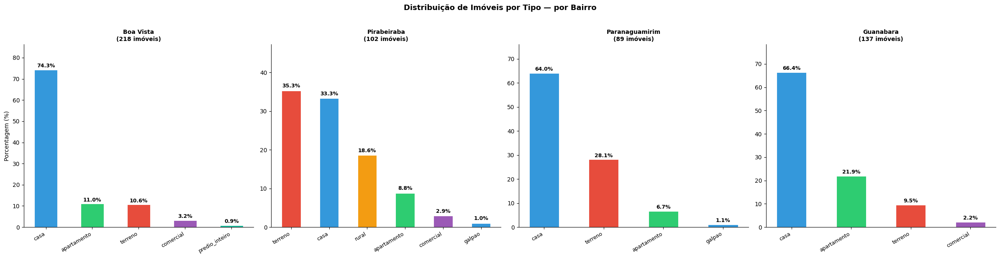

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a

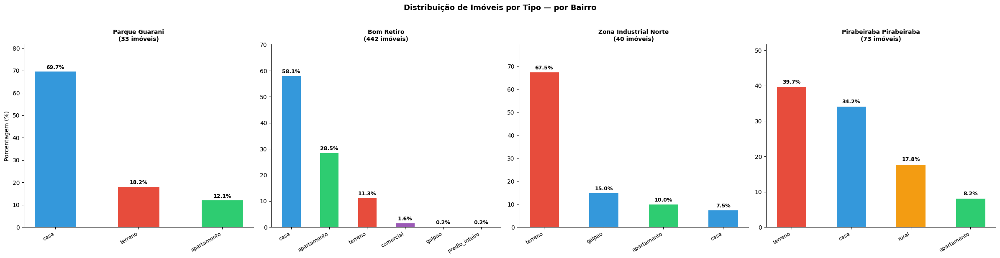

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a

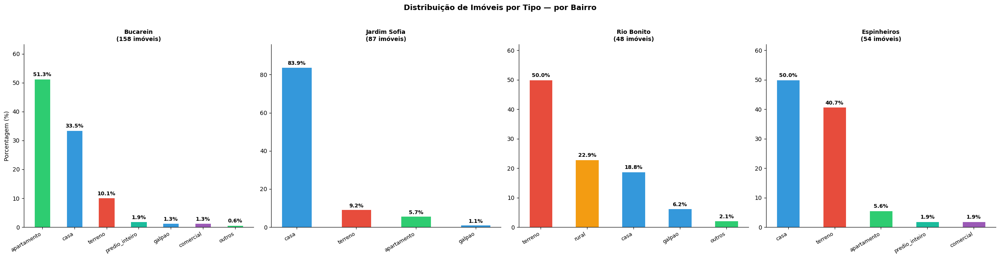

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a

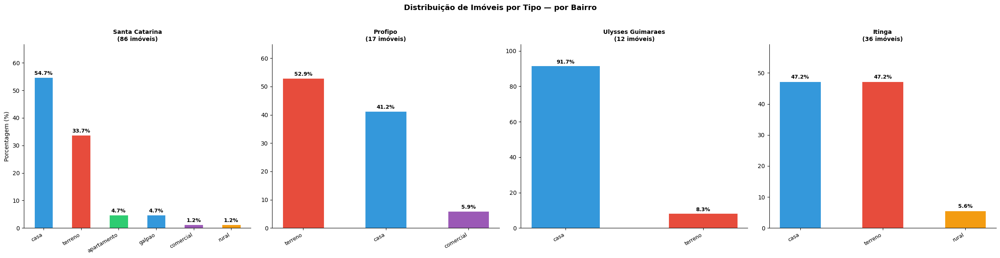

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a

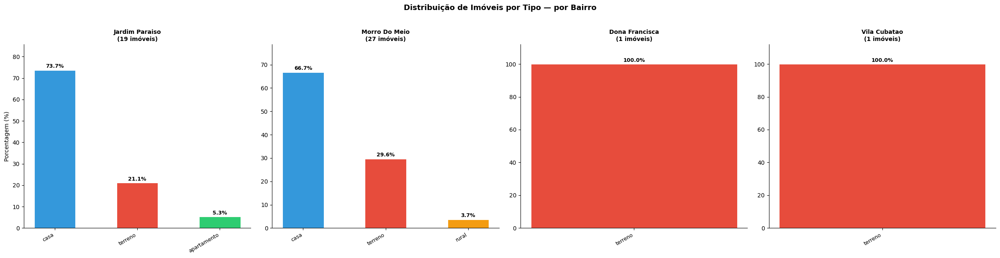

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\1220209095.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)


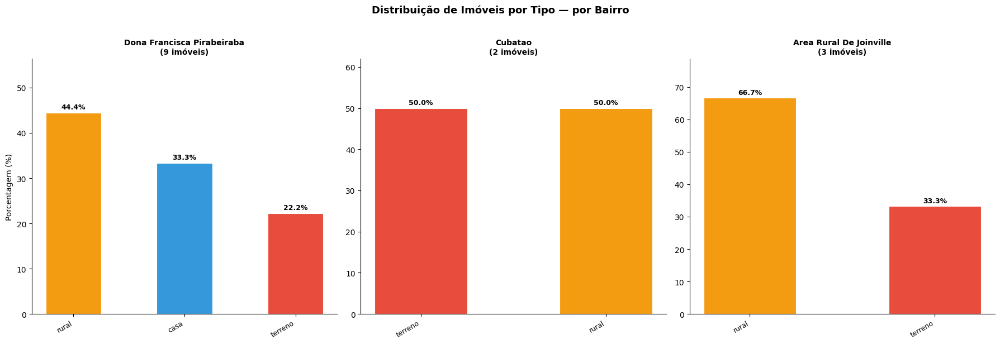

: 

In [ ]:
bairros = pd_data_lat_log_completo['bairro'].unique()

# Paleta de cores fixa por tipo de imóvel
tipos = pd_data_lat_log_completo['tipo_imovel'].unique()
palette = ['#3498db', '#2ecc71', '#e74c3c', '#f39c12', '#9b59b6', '#1abc9c']
cor_por_tipo = {tipo: palette[i % len(palette)] for i, tipo in enumerate(tipos)}

# De 4 em 4 bairros
chunk_size = 4
bairros_chunks = [bairros[i:i+chunk_size] for i in range(0, len(bairros), chunk_size)]

for chunk in bairros_chunks:
    fig, axes = plt.subplots(1, len(chunk), figsize=(6 * len(chunk), 6))
    
    if len(chunk) == 1:
        axes = [axes]

    for ax, bairro in zip(axes, chunk):
        pd_bairro = pd_data_lat_log_completo[pd_data_lat_log_completo['bairro'] == bairro]
        porcentagem = round((pd_bairro['tipo_imovel'].value_counts() / pd_bairro.shape[0]) * 100, 1)
        
        cores = [cor_por_tipo.get(t, '#95a5a6') for t in porcentagem.index]
        bars  = ax.bar(porcentagem.index, porcentagem.values, color=cores, edgecolor='white', linewidth=0.8, width=0.5)

        # Valores nas barras
        for bar in bars:
            height = bar.get_height()
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                height + 0.5,
                f'{height:.1f}%',
                ha='center', va='bottom',
                fontsize=9, fontweight='bold'
            )

        total = pd_bairro.shape[0]
        ax.set_title(f'{bairro.title()}\n({total} imóveis)', fontsize=10, fontweight='bold')
        ax.set_ylabel('Porcentagem (%)' if ax == axes[0] else '')
        ax.set_ylim(0, porcentagem.values.max() + 12)
        ax.set_xticklabels(porcentagem.index, rotation=30, ha='right', fontsize=9)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.axhline(0, color='gray', linewidth=0.5)

    plt.suptitle('Distribuição de Imóveis por Tipo — por Bairro', fontsize=13, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

**Análise de Relação entre % de Apartamentos e Preço por m²**

Apartamentos estão concentrados nos bairros mais valorizados de Joinville, e existe uma relação direta entre densidade de apartamentos e preço por m².

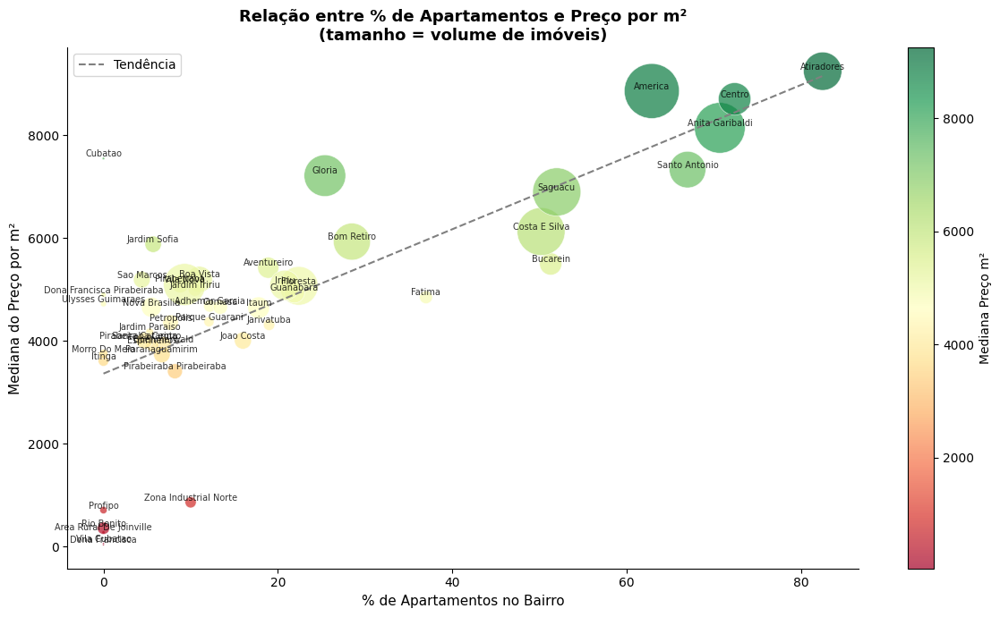

: 

In [ ]:
# Quantidade de cada tipo por bairro
contagem = pd_data_lat_log_completo.groupby(['bairro', 'tipo_imovel']).size().unstack(fill_value=0)

contagem['total'] = contagem.sum(axis=1)

contagem['pct_apartamento'] = round((contagem['apartamento'] / contagem['total']) * 100, 1)

# Preço mediano por bairro (todos os tipos juntos)
mediana_bairro = pd_data_lat_log_completo.groupby('bairro')['preco_por_m2'].median()

# Juntar tudo
df_relacao = contagem[['pct_apartamento', 'total']].join(mediana_bairro).dropna()

df_relacao.columns = ['pct_apartamento', 'total_imoveis', 'mediana_preco_m2']

fig, ax = plt.subplots(figsize=(12, 7))

scatter = ax.scatter(
    df_relacao['pct_apartamento'],
    df_relacao['mediana_preco_m2'],
    s=df_relacao['total_imoveis'] * 2,  # tamanho = volume de imóveis
    alpha=0.7,
    c=df_relacao['mediana_preco_m2'],
    cmap='RdYlGn',
    edgecolors='white',
    linewidth=0.5
)

# Label nos bairros
for bairro, row in df_relacao.iterrows():
    ax.annotate(bairro.title(), (row['pct_apartamento'], row['mediana_preco_m2']),
                fontsize=7, alpha=0.8, ha='center', va='bottom')

# Linha de tendência
z = np.polyfit(df_relacao['pct_apartamento'], df_relacao['mediana_preco_m2'], 1)
p = np.poly1d(z)
x_line = np.linspace(df_relacao['pct_apartamento'].min(), df_relacao['pct_apartamento'].max(), 100)
ax.plot(x_line, p(x_line), 'gray', linestyle='--', linewidth=1.5, label='Tendência')

plt.colorbar(scatter, ax=ax, label='Mediana Preço m²')
ax.set_xlabel('% de Apartamentos no Bairro', fontsize=11)
ax.set_ylabel('Mediana do Preço por m²', fontsize=11)
ax.set_title('Relação entre % de Apartamentos e Preço por m²\n(tamanho = volume de imóveis)', fontsize=13, fontweight='bold')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend()
plt.tight_layout()
plt.show()

**Contagem de Faixas de Preço por Tipo de Imóvel (Casa) nos bairros**

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or us

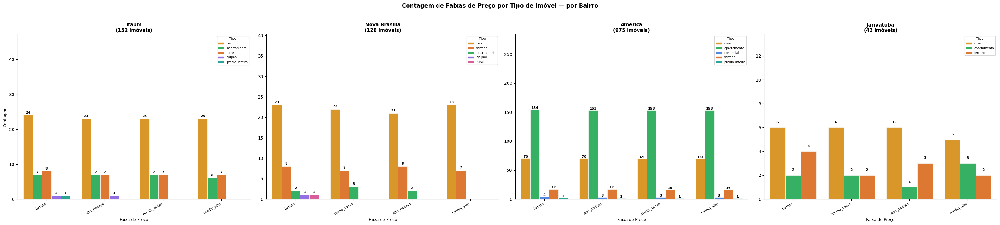

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or us

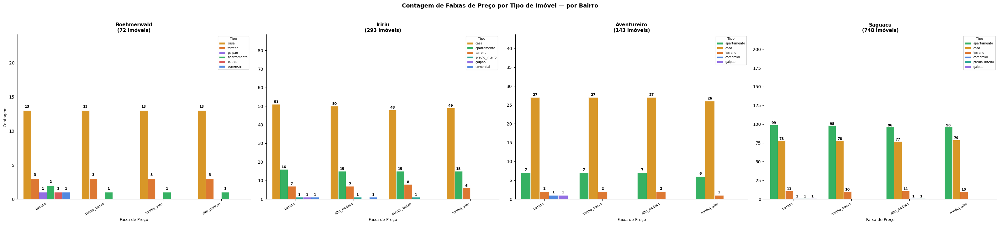

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or us

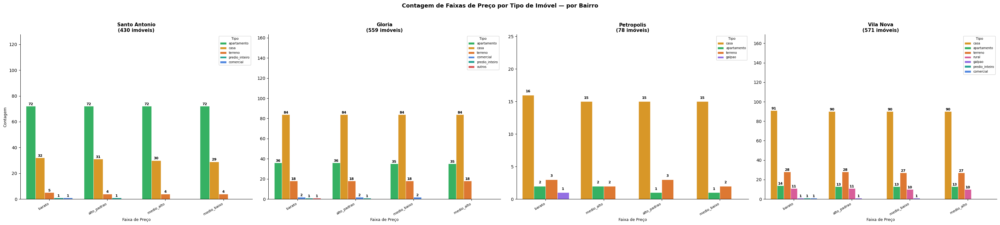

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or us

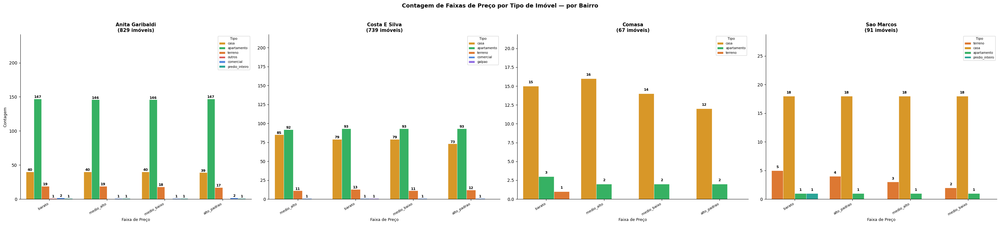

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or us

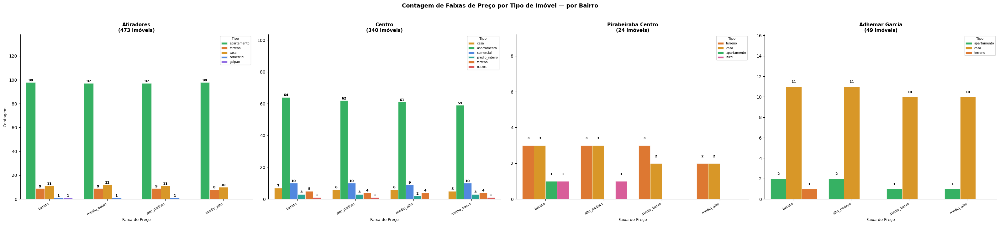

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or us

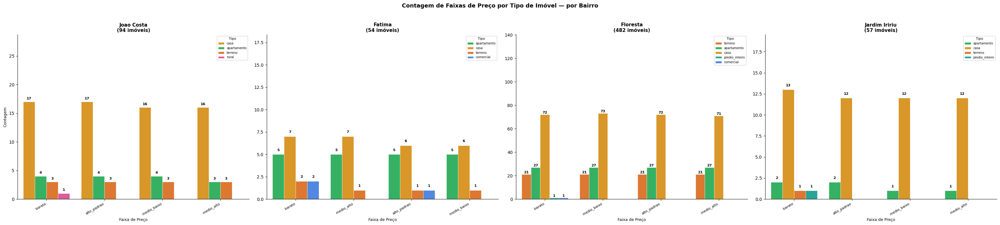

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or us

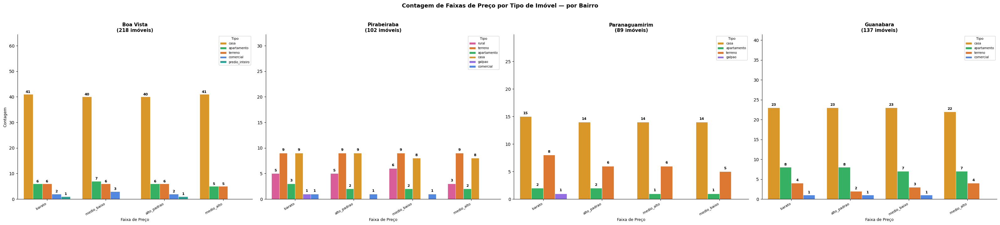

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or us

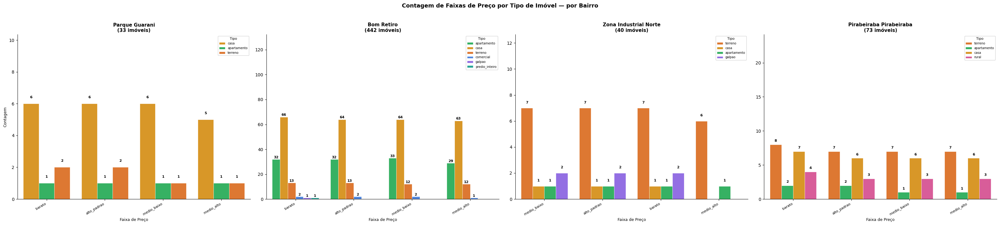

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or us

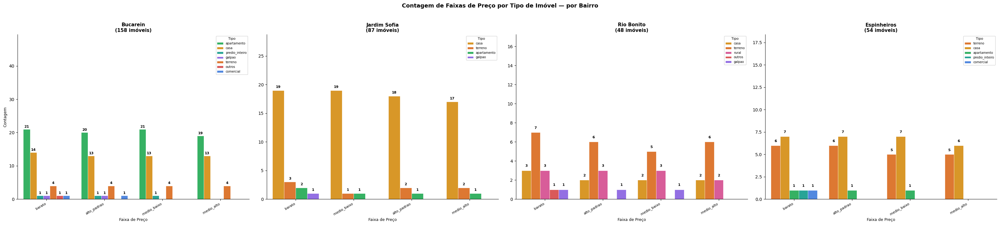

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or us

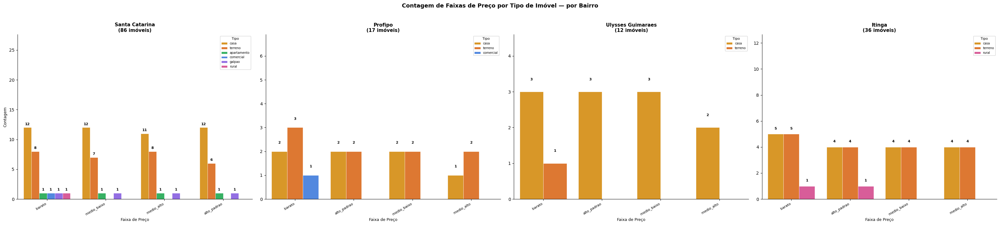

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or us

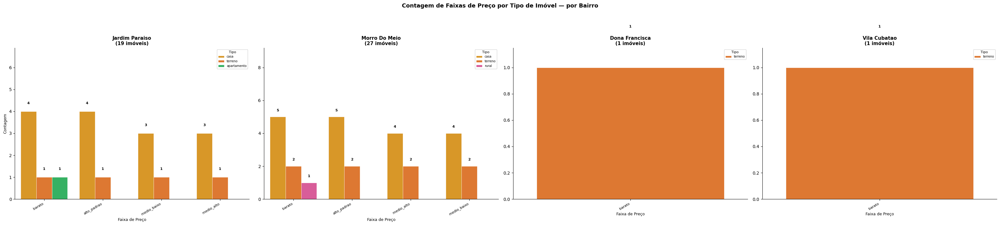

C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
C:\Users\jefer\AppData\Local\Temp\ipykernel_19448\870196651.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)


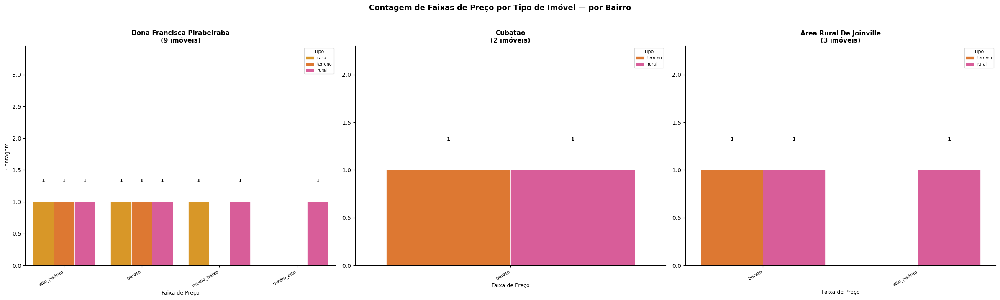

: 

In [ ]:
palette = {
    'apartamento': '#22c55e', 'casa': '#f59e0b', 'terreno': '#f97316',
    'outros': '#ef4444', 'comercial': '#3b82f6', 'galpao': '#8b5cf6',
    'rural': '#ec4899', 'predio_inteiro': '#14b8a6'
}

bairros = pd_data_range_bairro_tipo_imovel['bairro'].unique()
chunks  = [bairros[i:i+4] for i in range(0, len(bairros), 4)]

for chunk in chunks:
    fig, axes = plt.subplots(1, len(chunk), figsize=(8 * len(chunk), 7))

    if len(chunk) == 1:
        axes = [axes]

    for ax, bairro in zip(axes, chunk):
        df_b = pd_data_range_bairro_tipo_imovel[pd_data_range_bairro_tipo_imovel['bairro'] == bairro]

        sns.countplot(
            x='faixa', hue='tipo_imovel',
            data=df_b, palette=palette,
            order=df_b['faixa'].value_counts().index,  # ordena por mais frequente
            edgecolor='white', linewidth=0.5,
            ax=ax
        )

        # Valores nas barras
        for bar in ax.patches:
            height = bar.get_height()
            if height > 0:
                ax.text(
                    bar.get_x() + bar.get_width() / 2,
                    height + 0.3,
                    f'{int(height)}',
                    ha='center', va='bottom',
                    fontsize=8, fontweight='bold', color='black'
                )

        total = df_b.shape[0]
        ax.set_title(f'{bairro.title()}\n({total} imóveis)', fontsize=11, fontweight='bold')
        ax.set_xlabel('Faixa de Preço', fontsize=9)
        ax.set_ylabel('Contagem' if ax == axes[0] else '', fontsize=9)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right', fontsize=8)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.legend(title='Tipo', fontsize=7, title_fontsize=8, loc='upper right')
        ax.set_ylim(0, df_b['faixa'].value_counts().max() * 1.15)  # margem para os valores

    plt.suptitle('Contagem de Faixas de Preço por Tipo de Imóvel — por Bairro',
                 fontsize=13, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

**Adicionando o Indice Localização aos dados**

In [ ]:
pd_indice.isna().sum()

name        0
score       0
url      9191
index       0
dtype: int64

: 

In [ ]:
pd_data_indice_localizacao.isna().sum()

NameError: name 'pd_data_indice_localizacao' is not defined

: 

In [ ]:
pd_data_indice_localizacao = pd_data_range_bairro_tipo_imovel.copy()

pd_indice = pd_indice[['index', 'score']].rename(columns={'score': 'indice_localizacao'})

print("pd_data_indice_localizacao:", pd_data_indice_localizacao.shape)

print("pd_indice:", pd_indice.shape)

pd_data_indice_localizacao = pd_data_indice_localizacao.join(pd_indice.set_index('index'), how='left')

print("pd_data_indice_localizacao:", pd_data_indice_localizacao.shape)

pd_data_indice_localizacao_sem_sr = pd_data_indice_localizacao[pd_data_indice_localizacao['rua'] != 's/r']

print("pd_data_indice_localizacao_sem_sr:", pd_data_indice_localizacao_sem_sr.shape)

def remover_outliers(df, colunas):
    mascara = pd.Series(True, index=df.index)
    for col in colunas:
        Q1  = df[col].quantile(0.25)
        Q3  = df[col].quantile(0.75)
        IQR = Q3 - Q1
        mascara &= df[col].between(Q1 - 1.5 * IQR, Q3 + 1.5 * IQR)
    return df[mascara]

df = pd_data_indice_localizacao_sem_sr.dropna(subset=['indice_localizacao', 'preco_por_m2'])

print("df dropna indice_localizacao e preco_por_m2:", df.shape)

df_sem_outliers = remover_outliers(df, ['indice_localizacao', 'preco_por_m2'])

print("df_sem_outliers:", df_sem_outliers.shape)



pd_data_indice_localizacao: (9208, 27)
pd_indice: (9208, 2)
pd_data_indice_localizacao: (9208, 28)
pd_data_indice_localizacao_sem_sr: (5519, 28)
df dropna indice_localizacao e preco_por_m2: (5512, 28)
df_sem_outliers: (5179, 28)


: 

In [ ]:
pd_data_indice_localizacao_sem_sr.isna().sum()

url                      0
titulo                   0
metragem                 0
banheiros                0
vagas                    0
quartos                  0
valor_imovel             0
condominio            1492
iptu                  1882
descricao               53
data_criacao             0
caracteristicas          0
fotos                    0
link_maps                0
rua                      0
bairro                   0
cidade                   0
estado                   0
dias_publicacao          0
tipo_imovel              0
lat                    104
lng                    104
preco_por_m2             7
faixa                    0
p25_bairro               0
p50_bairro               0
p75_bairro               0
indice_localizacao       0
dtype: int64

: 

In [ ]:
pd_data_indice_localizacao_sem_sr.dropna(subset=['indice_localizacao', 'preco_por_m2'])

,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,iptu,descricao,...,dias_publicacao,tipo_imovel,lat,lng,preco_por_m2,faixa,p25_bairro,p50_bairro,p75_bairro,indice_localizacao
2,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 185m² - Vila Nova",185.0,2,2,3,1000000.0,NaN,NaN,None,...,305,casa,-26.284974,-48.919675,5405.405405,medio_baixo,4540.895455,5416.666667,6519.230769,19.95
5,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 49m² - Aven...",49.0,1,2,2,290000.0,336.0,0.0,"Apartamento à venda no Aventureiro, JoinvilleS...",...,11,apartamento,-26.247749,-48.821432,5918.367347,medio_baixo,5754.847222,6090.909091,6173.245614,30.06
6,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 47m² - Saguaçú",47.0,1,1,2,347900.0,0.0,0.0,"Apartamentos no Home Club Brasil 70, bairro Sa...",...,11,apartamento,NaN,NaN,7402.127660,medio_baixo,6777.777778,7680.444444,9031.198795,28.42
7,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 3 Quartos à venda, 65m² - Iririú",65.0,1,1,3,300000.0,345.0,35.0,Localização: Esse lindo apartamento está estra...,...,12,apartamento,-26.266841,-48.823187,4615.384615,barato,4889.423913,5180.722892,6264.547414,26.78
9,https://www.zapimoveis.com.br/imovel/venda-sob...,"Sobrado com 2 Quartos à venda, 83m² - Comasa",83.0,2,1,2,368000.0,0.0,100.0,Sobrado Geminado à Venda no bairro Comasa em J...,...,189,casa,-26.279041,-48.811054,4433.734940,medio_baixo,3650.000000,4588.235294,5000.000000,30.98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9945,https://www.zapimoveis.com.br/imovel/venda-apa...,Apartamento com 2 Quartos para venda ou alugue...,87.0,2,1,2,750000.0,537.0,NaN,"Apartamento Mobiliado, no condomínio Riviera d...",...,456,apartamento,-26.305723,-48.841699,8620.689655,medio_baixo,8024.691358,9996.103896,12252.631579,52.86
9946,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 3 Quartos à venda, 112m² - Bom...",112.0,2,2,3,649000.0,0.0,NaN,"Geminado com área ampla nos fundos, no bairro ...",...,20,apartamento,-26.252862,-48.846423,5794.642857,barato,5917.272192,6957.081981,7809.318378,21.66
9948,https://www.zapimoveis.com.br/imovel/venda-apa...,"Apartamento com 2 Quartos à venda, 59m² - Anit...",59.0,1,1,2,399000.0,295.0,712.0,Apartamento mobiliado à venda no Residencial C...,...,26,apartamento,-26.319989,-48.861831,6762.711864,barato,7500.000000,8795.665205,10001.008065,32.18
9952,https://www.zapimoveis.com.br/imovel/venda-cas...,"Casa com 3 Quartos à venda, 110m² - Boehmerwald",110.0,1,3,3,270000.0,0.0,250.0,RESIDÊNCIA COM 3 QUARTOS NO BAIRRO BOEHMERWALD...,...,875,casa,-26.360981,-48.826030,2454.545455,barato,3355.357143,4225.633803,5321.754808,23.70


: 

**Verificando os histogramas das colunas numéricas**

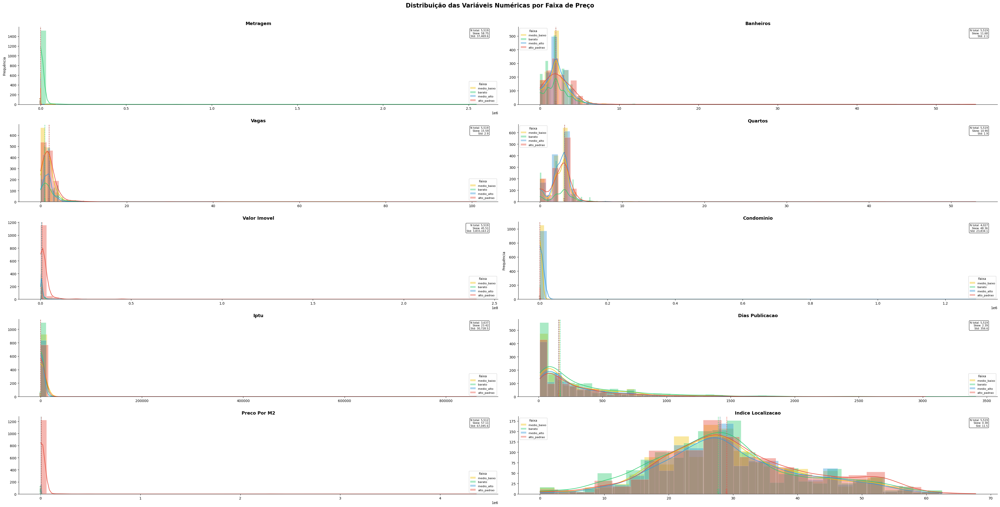

: 

In [ ]:
colunas = ['metragem', 'banheiros', 'vagas', 'quartos', 'valor_imovel',
           'condominio', 'iptu', 'dias_publicacao', 'preco_por_m2', 'indice_localizacao']

df = pd_data_indice_localizacao_sem_sr.copy()

palette_faixa = {
    'barato'      : '#2ecc71',
    'medio_alto'       : '#3498db',
    'medio_baixo' : '#f1c40f',
    'alto_padrao' : '#e74c3c',
}

faixas = df['faixa'].unique()

fig, axes = plt.subplots(5, 2, figsize=(40, 20))
axes = axes.flatten()

for i, col in enumerate(colunas):
    ax = axes[i]

    for faixa in faixas:
        dados = df[df['faixa'] == faixa][col].dropna()

        if len(dados) == 0:
            continue

        cor = palette_faixa.get(faixa, '#95a5a6')

        sns.histplot(
            x=dados, ax=ax,
            kde=True,
            color=cor,
            edgecolor='white',
            linewidth=0.3,
            alpha=0.4,
            label=faixa
        )

        # Mediana por faixa
        mediana = dados.median()
        ax.axvline(mediana, color=cor, linestyle='--', linewidth=1.2, alpha=0.9)
        ax.text(mediana, ax.get_ylim()[1] * 0.01,
                f'{mediana:,.1f}', color=cor,
                fontsize=6.5, ha='center', va='bottom', rotation=90)

    # Estatísticas gerais
    dados_total = df[col].dropna()
    ax.text(0.98, 0.97,
            f'N total: {len(dados_total):,}\nSkew: {dados_total.skew():.2f}\nStd: {dados_total.std():,.1f}',
            transform=ax.transAxes, fontsize=7.5, va='top', ha='right',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

    ax.set_title(col.replace('_', ' ').title(), fontsize=13, fontweight='bold')
    ax.set_xlabel('')
    ax.set_ylabel('Frequência' if i % 5 == 0 else '')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.legend(title='Faixa', fontsize=8, title_fontsize=9)

plt.suptitle('Distribuição das Variáveis Numéricas por Faixa de Preço',
             fontsize=17, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

**Verificando as correlações das colunas numéricas**

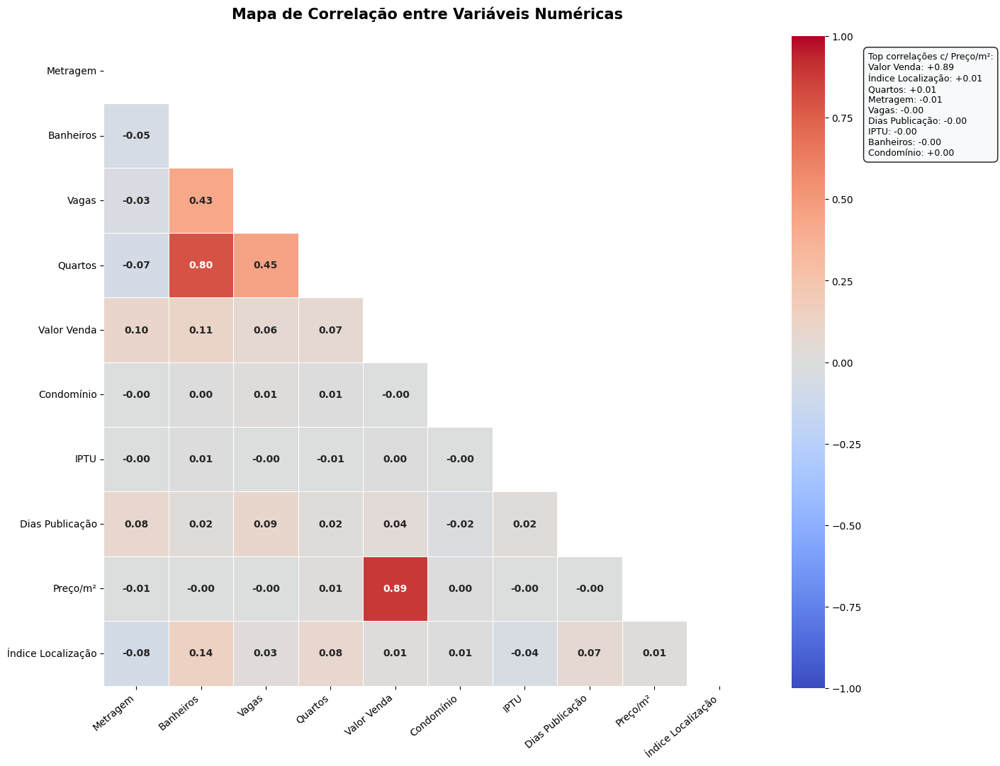

: 

In [ ]:
colunas = ['metragem', 'banheiros', 'vagas', 'quartos', 'valor_imovel',
           'condominio', 'iptu', 'dias_publicacao', 'preco_por_m2', 'indice_localizacao']

data_corre = pd_data_indice_localizacao_sem_sr.copy().dropna(subset=colunas)[colunas]
corr = data_corre.corr()

# Máscara para ocultar triângulo superior (evita duplicidade)
mask = np.triu(np.ones_like(corr, dtype=bool))

fig, ax = plt.subplots(figsize=(14, 11))

sns.heatmap(
    corr,
    mask=mask,
    annot=True, fmt='.2f',
    cmap='coolwarm',
    center=0,
    vmin=-1, vmax=1,
    linewidths=0.5,
    linecolor='white',
    annot_kws={'size': 10, 'weight': 'bold'},
    square=True,
    ax=ax
)

# Destacar correlações fortes com preco_por_m2
ax.set_title('Mapa de Correlação entre Variáveis Numéricas',
             fontsize=15, fontweight='bold', pad=20)

# Nomes mais legíveis
nomes = {
    'metragem': 'Metragem', 'banheiros': 'Banheiros', 'vagas': 'Vagas',
    'quartos': 'Quartos', 'valor_imovel': 'Valor Venda', 'condominio': 'Condomínio',
    'iptu': 'IPTU', 'dias_publicacao': 'Dias Publicação',
    'preco_por_m2': 'Preço/m²', 'indice_localizacao': 'Índice Localização'
}
labels = [nomes.get(c, c) for c in colunas]
ax.set_xticklabels(labels, rotation=40, ha='right', fontsize=10)
ax.set_yticklabels(labels, rotation=0, fontsize=10)

# Tabela de top correlações com preco_por_m2
corr_preco = corr['preco_por_m2'].drop('preco_por_m2').sort_values(key=abs, ascending=False)
texto = 'Top correlações c/ Preço/m²:\n' + '\n'.join(
    [f'{nomes.get(k, k)}: {v:+.2f}' for k, v in corr_preco.items()]
)
ax.text(1.18, 0.98, texto, transform=ax.transAxes,
        fontsize=9, va='top', ha='left',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='#f8f9fa', alpha=0.9))

plt.tight_layout()
plt.show()

**Verificando o indice_localizacao sem outliers e comparando com o preco_por_m2**

Antes: 5,512 imóveis | Depois: 5,179 | Removidos: 333


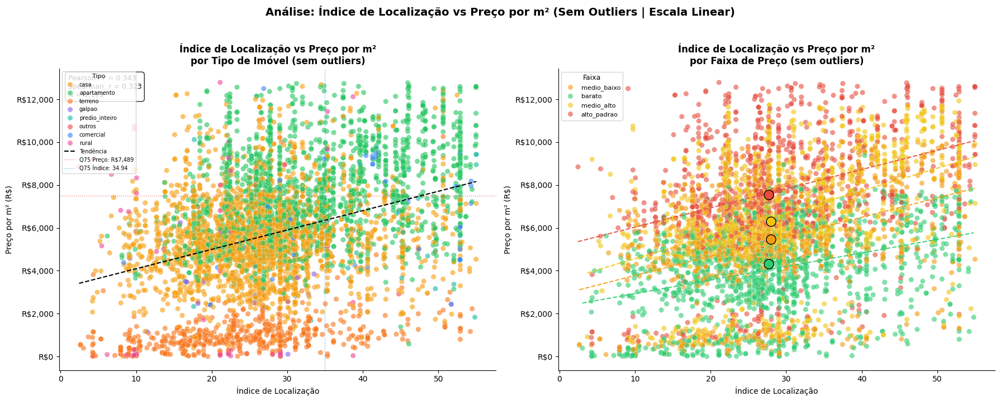

: 

In [ ]:
from scipy.stats import pearsonr, spearmanr

print(f'Antes: {len(df):,} imóveis | Depois: {len(df_sem_outliers):,} | Removidos: {len(df) - len(df_sem_outliers):,}')

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# ── Scatter por tipo ──────────────────────────────────────────────────
ax1 = axes[0]

sns.scatterplot(
    x='indice_localizacao', y='preco_por_m2',
    hue='tipo_imovel', palette=palette,
    data=df_sem_outliers, alpha=0.6, s=45,
    edgecolor='white', linewidth=0.3, ax=ax1
)

# Tendência linear simples (sem log)
z   = np.polyfit(df_sem_outliers['indice_localizacao'], df_sem_outliers['preco_por_m2'], 1)
x_l = np.linspace(df_sem_outliers['indice_localizacao'].min(), df_sem_outliers['indice_localizacao'].max(), 200)
ax1.plot(x_l, np.poly1d(z)(x_l), color='black', linestyle='--', linewidth=1.5, label='Tendência')

q75_preco  = df_sem_outliers['preco_por_m2'].quantile(0.75)
q75_indice = df_sem_outliers['indice_localizacao'].quantile(0.75)
ax1.axhline(q75_preco,  color='#e74c3c', linestyle=':', linewidth=1, alpha=0.7, label=f'Q75 Preço: R${q75_preco:,.0f}')
ax1.axvline(q75_indice, color='#3498db', linestyle=':', linewidth=1, alpha=0.7, label=f'Q75 Índice: {q75_indice:.2f}')

r_p, _ = pearsonr(df_sem_outliers['indice_localizacao'], df_sem_outliers['preco_por_m2'])
r_s, _ = spearmanr(df_sem_outliers['indice_localizacao'], df_sem_outliers['preco_por_m2'])
ax1.text(0.02, 0.98,
         f'Pearson:  r = {r_p:.3f}\nSpearman: r = {r_s:.3f}\nN = {len(df_sem_outliers):,}',
         transform=ax1.transAxes, fontsize=9, va='top',
         bbox=dict(boxstyle='round,pad=0.4', facecolor='white', alpha=0.85))

ax1.set_title('Índice de Localização vs Preço por m²\npor Tipo de Imóvel (sem outliers)', fontsize=12, fontweight='bold')
ax1.set_xlabel('Índice de Localização', fontsize=10)
ax1.set_ylabel('Preço por m² (R$)', fontsize=10)
ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'R${x:,.0f}'))
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.legend(title='Tipo', fontsize=7, title_fontsize=8)

# ── Scatter por faixa ─────────────────────────────────────────────────
ax2 = axes[1]

palette_faixa = {'barato': '#2ecc71', 'medio_baixo': '#f39c12', 'medio_alto': '#f1c40f', 'alto_padrao': '#e74c3c'}

sns.scatterplot(
    x='indice_localizacao', y='preco_por_m2',
    hue='faixa', palette=palette_faixa,
    data=df_sem_outliers, alpha=0.6, s=45,
    edgecolor='white', linewidth=0.3, ax=ax2
)

for faixa, cor in palette_faixa.items():
    df_f = df_sem_outliers[df_sem_outliers['faixa'] == faixa]
    if len(df_f) > 2:
        z_f = np.polyfit(df_f['indice_localizacao'], df_f['preco_por_m2'], 1)
        x_f = np.linspace(df_f['indice_localizacao'].min(), df_f['indice_localizacao'].max(), 100)
        ax2.plot(x_f, np.poly1d(z_f)(x_f), color=cor, linestyle='--', linewidth=1.5, alpha=0.9)

for faixa, cor in palette_faixa.items():
    df_f  = df_sem_outliers[df_sem_outliers['faixa'] == faixa]
    med_x = df_f['indice_localizacao'].median()
    med_y = df_f['preco_por_m2'].median()
    ax2.scatter(med_x, med_y, color=cor, s=150, zorder=5, edgecolor='black', linewidth=1)
    ax2.text(med_x, med_y + 80, f'R${med_y:,.0f}',  # offset fixo na escala normal
             ha='center', fontsize=8, fontweight='bold', color=cor)

ax2.set_title('Índice de Localização vs Preço por m²\npor Faixa de Preço (sem outliers)', fontsize=12, fontweight='bold')
ax2.set_xlabel('Índice de Localização', fontsize=10)
ax2.set_ylabel('Preço por m² (R$)', fontsize=10)
ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'R${x:,.0f}'))
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.legend(title='Faixa', fontsize=8, title_fontsize=9)

plt.suptitle('Análise: Índice de Localização vs Preço por m² (Sem Outliers | Escala Linear)',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

In [ ]:
df_2 = pd.read_csv('../dados/zap_imoveis_joinville_limpo_2026-02-23.csv')

pd_indice_2 = pd.read_csv('../dados/resultado_final_indice_2026-02-23.csv')

pd_indice_2 = pd_indice_2[['index', 'score']].rename(columns={'score': 'indice_localizacao'})
#pd_data_indice_localizacao_2 = df_2.join(pd_indice_2.set_index('index'), how='left')
df_2['indice_localizacao'] = pd_indice_2['indice_localizacao']

#pd_indice_2 = pd_indice_2[['index', 'score']].rename(columns={'score': 'indice_localizacao'})
#pd_data_indice_localizacao_2 = df_2.join(pd_indice_2.set_index('index'), how='left')
df_2['indice_localizacao'] = pd_indice_2['indice_localizacao']

df_2.isna().sum(), pd_indice_2.isna().sum()

(url                      0
 titulo                   0
 metragem                 0
 banheiros                0
 vagas                    0
 quartos                  0
 valor_imovel             0
 condominio            3434
 iptu                  4084
 descricao               54
 data_criacao             0
 caracteristicas          0
 fotos                    0
 link_maps                0
 rua                      0
 bairro                   0
 cidade                   0
 estado                   0
 dias_publicacao          0
 tipo_imovel              0
 lat                      3
 lng                      3
 preco_por_m2             0
 faixa                    0
 p25_bairro               0
 p50_bairro               0
 p75_bairro               0
 desvio_mediana           0
 indice_localizacao       0
 dtype: int64,
 index                 0
 indice_localizacao    0
 dtype: int64)

: 

In [ ]:
df_2 = pd.read_csv('../dados/zap_imoveis_joinville_limpo_2026-02-23.csv')

pd_indice_2 = pd.read_csv('../dados/resultado_final_indice_2026-02-23.csv')

pd_indice_2 = pd_indice_2[['index', 'score']].rename(columns={'score': 'indice_localizacao'})
#pd_data_indice_localizacao_2 = df_2.join(pd_indice_2.set_index('index'), how='left')
df_2['indice_localizacao'] = pd_indice_2['indice_localizacao']

print("pd_data_indice_localizacao:", df_2.shape)

print("pd_indice:", pd_indice_2.shape)

df_2['preco_por_m2'] = df_2['preco_por_m2'].replace([np.inf, -np.inf], np.nan)

metro_quadrado_mediana = df_2['preco_por_m2'].median()

df_2['preco_por_m2'] = df_2['preco_por_m2'].fillna(metro_quadrado_mediana).astype(int)


superior = df_2['preco_por_m2'].quantile(0.996).astype(int)

df_2["desvio_mediana"] = round((df_2["preco_por_m2"] - df_2["p50_bairro"]) / df_2["p50_bairro"],2) 

if pd.isna(superior):
    print("ERRO: O valor superior é NaN. Verifique se a coluna preco_por_m2 tem números válidos.")
else:
    df_2 = df_2[df_2['preco_por_m2'] < superior].astype({'preco_por_m2': int})
    
    print('pd_data_indice_localizacao', df_2.shape)

pd_data_indice_localizacao_sem_sr_2 = df_2[df_2['rua'] != 's/r']

print("pd_data_indice_localizacao_sem_sr:", pd_data_indice_localizacao_sem_sr_2.shape)

df_limpo_2 = pd_data_indice_localizacao_sem_sr_2.dropna(subset=['indice_localizacao', 'preco_por_m2'])

print("df_limpo:", df_limpo_2.shape)

df_sem_outliers_2 = remover_outliers(df_limpo_2, ['indice_localizacao', 'preco_por_m2'])

print("df_sem_outliers:", df_sem_outliers_2.shape)

pd_data_indice_localizacao: (9208, 29)
pd_indice: (9208, 2)
pd_data_indice_localizacao (9171, 29)
pd_data_indice_localizacao_sem_sr: (5485, 29)
df_limpo: (5485, 29)
df_sem_outliers: (5187, 29)


: 

In [ ]:
pd_data_indice_localizacao_sem_sr_2.isna().sum()

url                      0
titulo                   0
metragem                 0
banheiros                0
vagas                    0
quartos                  0
valor_imovel             0
condominio            1448
iptu                  1852
descricao               53
data_criacao             0
caracteristicas          0
fotos                    0
link_maps                0
rua                      0
bairro                   0
cidade                   0
estado                   0
dias_publicacao          0
tipo_imovel              0
lat                      3
lng                      3
preco_por_m2             0
faixa                    0
p25_bairro               0
p50_bairro               0
p75_bairro               0
desvio_mediana         462
indice_localizacao     462
dtype: int64

: 

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
from scipy.stats import pearsonr, spearmanr

# 1. Cálculos Estatísticos
r_p, _ = pearsonr(df_sem_outliers['indice_localizacao'], df_sem_outliers['preco_por_m2'])
r_s, _ = spearmanr(df_sem_outliers['indice_localizacao'], df_sem_outliers['preco_por_m2'])
q75_preco = df_sem_outliers['preco_por_m2'].quantile(0.75)
q75_indice = df_sem_outliers['indice_localizacao'].quantile(0.75)

# Cálculo da Linha de Tendência Manual (para maior controle)
z = np.polyfit(df_sem_outliers['indice_localizacao'], df_sem_outliers['preco_por_m2'], 1)
p = np.poly1d(z)
x_range = np.linspace(df_sem_outliers['indice_localizacao'].min(), df_sem_outliers['indice_localizacao'].max(), 100)

# 2. Criação do Gráfico Base com Plotly Express
fig = px.scatter(
    df_sem_outliers, 
    x='indice_localizacao', 
    y='preco_por_m2',
    color='faixa',
    hover_data=['bairro'], # Adicionei bairro para enriquecer o hover
    opacity=0.6,
    title='<b>Índice de Localização vs Preço por m²</b><br><sup>Por Tipo de Imóvel (sem outliers)</sup>',
    labels={'indice_localizacao': 'Índice de Localização', 'preco_por_m2': 'Preço por m² (R$)'},
    template='plotly_white'
)

# 3. Adicionando a Linha de Tendência
fig.add_trace(go.Scatter(
    x=x_range, y=p(x_range),
    mode='lines',
    line=dict(color='black', dash='dash', width=2),
    name='Tendência Linear'
))

# 4. Adicionando Linhas de Quartil (Q75)
fig.add_hline(y=q75_preco, line_dash="dot", line_color="#e74c3c", 
              annotation_text=f"Q75 Preço: R${q75_preco:,.0f}", annotation_position="top left")

fig.add_vline(x=q75_indice, line_dash="dot", line_color="#3498db", 
              annotation_text=f"Q75 Índice: {q75_indice:.2f}", annotation_position="top right")

# 5. Adicionando a Caixa de Texto com Correlações
fig.add_annotation(
    xref="paper", yref="paper",
    x=0.02, y=0.98,
    text=(f"<b>Pearson:</b> r = {r_p:.3f}<br>"
          f"<b>Spearman:</b> r = {r_s:.3f}<br>"
          f"<b>N:</b> {len(df_sem_outliers):,}"),
    showarrow=False,
    align="left",
    bgcolor="rgba(255, 255, 255, 0.85)",
    bordercolor="gray",
    borderwidth=1,
    borderpad=4
)

# 6. Refinamentos de Layout e Formatação
fig.update_layout(
    height=600,
    legend_title_text='Tipo',
    hovermode='closest',
)

fig.update_yaxes(tickprefix="R$", tickformat=",.0f")

fig.show()

: 

In [ ]:
df_sem_outliers["desvio_mediana"] = round((df_sem_outliers["preco_por_m2"] - df_sem_outliers["p50_bairro"]) / df_sem_outliers["p50_bairro"],2)
df_sem_outliers = df_sem_outliers[df_sem_outliers['desvio_mediana'] < 2]

fig = px.scatter(
        df_sem_outliers,
        x='indice_localizacao',
        y='desvio_mediana',
        color='faixa',
        hover_data=['bairro', 'preco_por_m2'],
        #color_discrete_sequence=px.colors.qualitative.Bold,
        opacity=0.6
    )

# 1. Cálculos Estatísticos
r_p, _ = pearsonr(df_sem_outliers['indice_localizacao'], df_sem_outliers['desvio_mediana'])
r_s, _ = spearmanr(df_sem_outliers['indice_localizacao'], df_sem_outliers['desvio_mediana'])     
z = np.polyfit(df_sem_outliers['indice_localizacao'], df_sem_outliers['desvio_mediana'], 1)
p = np.poly1d(z)
x_range = np.linspace(df_sem_outliers['indice_localizacao'].min(), df_sem_outliers['indice_localizacao'].max(), 100)

fig.add_trace(go.Scatter(
            x=x_range, y=p(x_range),
            mode='lines',
            line=dict(color='black', dash='dash', width=3),
            name='Tendência Linear'
        ))

fig.update_layout(
    title="Índice de Localização vs. Desvio da Mediana do Preço por m²",
    xaxis_title="Índice de Localização",
    yaxis_title="Desvio da Mediana (R$)",
    height=500
)

fig.show()


: 

In [ ]:
df_sem_outliers_apartamento.columns

Index(['url', 'titulo', 'metragem', 'banheiros', 'vagas', 'quartos',
       'valor_imovel', 'condominio', 'iptu', 'descricao', 'data_criacao',
       'caracteristicas', 'fotos', 'link_maps', 'rua', 'bairro', 'cidade',
       'estado', 'dias_publicacao', 'tipo_imovel', 'lat', 'lng',
       'preco_por_m2', 'faixa', 'p25_bairro', 'p50_bairro', 'p75_bairro',
       'indice_localizacao', 'desvio_mediana'],
      dtype='object')

: 

In [ ]:
df_sem_outliers_apartamento = df_sem_outliers[df_sem_outliers['tipo_imovel'] == 'apartamento']

df_sem_outliers_apartamento = df_sem_outliers_apartamento[df_sem_outliers_apartamento['vagas'] <= 4]

fig = px.scatter(
    df_sem_outliers_apartamento,
    x='indice_localizacao',
    y='dias_publicacao',
    color='vagas',   
    color_discrete_sequence=px.colors.qualitative.Bold,
    opacity=0.6
    )

fig.show()

: 

**Verificando a relacao entre os dias de publicacao e o desvio da mediana do preco por m2**

In [ ]:
df_sem_outliers["desvio_mediana"] = round((df_sem_outliers["preco_por_m2"] - df_sem_outliers["p50_bairro"]) / df_sem_outliers["p50_bairro"],2)

: 

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1. Configurações da grade
bairros = df_sem_outliers['bairro'].unique()
n_cols = 3  # Defina quantas colunas você quer
n_rows = (len(bairros) + n_cols - 1) // n_cols

# 2. Criar a figura de subplots
fig_final = make_subplots(
    rows=n_rows, 
    cols=n_cols, 
    subplot_titles=bairros,
    
)

# 3. Loop para preencher a grade
for i, bairro in enumerate(bairros):
    row = (i // n_cols) + 1
    col = (i % n_cols) + 1
    
    df_bairro = df_sem_outliers[df_sem_outliers['bairro'] == bairro]
    
    # Criamos o scatter base com px
    fig_temp = px.scatter(
        df_bairro,
        x='dias_publicacao',
        y='desvio_mediana',
        color='faixa',
        hover_data=['bairro', 'preco_por_m2'],
        color_discrete_sequence=px.colors.qualitative.Bold,
        opacity=0.6
    )
    
    # Adicionamos cada trace do px à nossa grade final
    for trace in fig_temp.data:
        # 'showlegend' evita duplicar a legenda para cada bairro
        trace.showlegend = (i == 0) 
        fig_final.add_trace(trace, row=row, col=col)
    
    # Cálculo da linha de tendência
    x = df_bairro['dias_publicacao']
    y = df_bairro['desvio_mediana']
    if not x.empty and len(x) > 1:
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        
        fig_final.add_trace(go.Scatter(
            x=x, 
            y=p(x),
            mode='lines',
            name='Tendência',
            line=dict(color='black', dash='dash'),
            showlegend=(i == 0)
        ), row=row, col=col)

    # Linha de referência no Zero
    fig_final.add_hline(y=0, line_dash="solid", line_color="gray", opacity=0.5, row=row, col=col)

# 4. Ajustes Finais de Layout
fig_final.update_layout(
    height=500 * n_rows, # Ajusta a altura total baseada no número de linhas
    width=2000,
    title_text="Relação: Dias de pulicação vs. Desvio do preco da mediana",
    template='plotly_white',
    legend=dict(orientation="h", yanchor="bottom", y=-0.05, xanchor="center", x=0.5)
)

# Atualizar eixos (títulos individuais podem poluir, então usamos o título geral ou eixos específicos)
fig_final.update_xaxes(title_text="Dias Online")
fig_final.update_yaxes(title_text="Desvio (R$)")

fig_final.show()

: 

**Tempo medio de publicacao por bairro**

In [ ]:
group_bairros_publicacao = pd_data_indice_localizacao.groupby(['bairro', 'tipo_imovel'])['dias_publicacao'].agg(['median', 'mean', 'min', 'max', 'count'])

: 

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go


bairros_com_dados = []
for b in group_bairros_publicacao.index.get_level_values('bairro').unique():
    if (group_bairros_publicacao.xs(b, level='bairro')['count'] >= 10).any():
        bairros_com_dados.append(b)

# 2. Configurações da grade
n_cols = 3  # Defina quantas colunas você quer
n_rows = (len(bairros_com_dados) + n_cols - 1) // n_cols

fig_final = make_subplots(
    rows=n_rows, 
    cols=n_cols, 
    subplot_titles=bairros_com_dados,
    vertical_spacing=0.03,  
    horizontal_spacing=0.05
)

# 3. Loop para preencher a grade
for i, bairro in enumerate(bairros_com_dados):
    row = (i // n_cols) + 1
    col = (i % n_cols) + 1
    
    dados_bairro = group_bairros_publicacao.xs(bairro, level='bairro').reset_index()
    dados_bairro = dados_bairro[dados_bairro['count'] >= 10].sort_values(by='median', ascending=False)
    
    # Adicionar Mediana
    fig_final.add_trace(
        go.Bar(
            x=dados_bairro['tipo_imovel'],
            y=dados_bairro['median'],
            name='Mediana',
            marker_color='#636EFA',
            text=dados_bairro['median'],
            textposition='auto',
            showlegend=(i == 0), # Mostra legenda apenas no primeiro para não repetir
            hovertemplate="Mediana: %{y} dias<extra></extra>"
        ),
        row=row, col=col
    )

    # Adicionar Média
    fig_final.add_trace(
        go.Bar(
            x=dados_bairro['tipo_imovel'],
            y=dados_bairro['mean'].round(1),
            name='Média',
            marker_color='#EF553B',
            text=dados_bairro['mean'].round(1),
            textposition='auto',
            showlegend=(i == 0),
            hovertemplate="Média: %{y} dias<extra></extra>"
        ),
        row=row, col=col
    )

# 4. Refinamento de Layout Geral
fig_final.update_layout(
    height=400 * n_rows, # Altura dinâmica baseada no número de linhas
    title_text='<b>Análise de Tempo de Publicação por Bairro</b><br><span style="font-size:12px">Comparativo Média vs Mediana</span>',
    barmode='group',
    template='plotly_white',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
)

# Ajustar os nomes dos eixos X para não encavalar
fig_final.update_xaxes(tickangle=45, tickfont=dict(size=10))

fig_final.show()

: 

**Analisando o Tempo de Publicação por Bairro e Tipo de Imóvel, criando categorias d**

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots


# 1. Criar as faixas
bins = [0, 60, 180, 365, 730, 9999]
labels = ['0-60 dias (Rápido)', '61-180 dias (Normal)', '181-365 dias (Lento)', '1 ano (Crítico)', '2 anos+ (Extremo)']
pd_data_indice_localizacao['faixa_tempo'] = pd.cut(pd_data_indice_localizacao['dias_publicacao'], bins=bins, labels=labels)


df_temp_ana = pd_data_indice_localizacao.groupby(['bairro', 'tipo_imovel', 'faixa_tempo'], observed=True).size().reset_index(name='quantidade')

df_temp_ana['total_grupo'] = df_temp_ana.groupby(['bairro', 'tipo_imovel'])['quantidade'].transform('sum')

df_temp_ana['porcentagem'] = (df_temp_ana['quantidade'] / df_temp_ana['total_grupo'] * 100).round(1)

bairros_com_dados = df_temp_ana['bairro'].unique()
n_cols = 3
n_rows = (len(bairros_com_dados) + n_cols - 1) // n_cols

# 2. Criar a grade de subplots (sem necessidade de eixo secundário agora, limpando o visual)
fig_final = make_subplots(
    rows=n_rows, 
    cols=n_cols, 
    subplot_titles=[f"<b>{b}</b>" for b in bairros_com_dados],
)

# 3. Loop para preencher a grade
for i, bairro in enumerate(bairros_com_dados):
    row = (i // n_cols) + 1
    col = (i % n_cols) + 1
    
    df_b = df_temp_ana[df_temp_ana['bairro'] == bairro].copy()
    
    # MÁGICA AQUI: Criar um novo nome para o eixo X que já contém o total
    # Ex: "Apartamento" vira "Apartamento (120)"
    df_b['tipo_com_total'] = df_b['tipo_imovel'] + " (" + df_b['total_grupo'].astype(str) + ")"
    
    # Ordenar para manter consistência visual
    df_b = df_b.sort_values(['tipo_imovel', 'faixa_tempo'])

    for j, faixa in enumerate(labels):
        df_faixa = df_b[df_b['faixa_tempo'] == faixa]
        if df_faixa.empty: continue

        fig_final.add_trace(
            go.Bar(
                x=df_faixa['tipo_com_total'], # Usando o nome com o total
                y=df_faixa['porcentagem'],
                name=faixa,
                marker_color=px.colors.diverging.RdYlGn_r[j*2],
                showlegend=(i == 0),
                text=df_faixa['porcentagem'].apply(lambda x: f'{int(x)}%' if x > 10 else ''),
                textposition='inside',
                hovertemplate="<b>%{x}</b><br>"+faixa+": %{y}%<extra></extra>"
            ),
            row=row, col=col
        )

# 4. Ajustes de Layout
fig_final.update_layout(
    height=400 * n_rows,
    title_text="<b>Distribuição de Liquidez por Bairro e Tipo (n=Total de Anúncios)</b>",
    barmode='stack',
    template='plotly_white',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="center", x=0.5),
    margin=dict(t=120, b=100)
)

# Configurar eixos
fig_final.update_yaxes(title_text="%", ticksuffix="%", range=[0, 100])
fig_final.update_xaxes(tickangle=45, tickfont=dict(size=10))

fig_final.show()

: 

In [ ]:
import plotly.express as px

# 1. Preparação dos dados
bins = [0, 60, 180, 365, 730, 9999]
labels = ['0-60 dias (Rápido)', '61-180 dias (Normal)', '181-365 dias (Lento)', '1 ano (Crítico)', '2 anos+ (Extremo)']

pd_data_indice_localizacao['faixa_tempo'] = pd.cut(pd_data_indice_localizacao['dias_publicacao'], bins=bins, labels=labels)

# Agrupamento
df_temp_ana = pd_data_indice_localizacao.groupby(['tipo_imovel', 'faixa_tempo'], observed=True).size().reset_index(name='quantidade')

# Cálculo de Totais e Porcentagem
df_temp_ana['total_grupo'] = df_temp_ana.groupby(['tipo_imovel'])['quantidade'].transform('sum')
df_temp_ana['porcentagem'] = (df_temp_ana['quantidade'] / df_temp_ana['total_grupo'] * 100).round(1)

# MÁGICA: Criar o rótulo do eixo X com o total absoluto
df_temp_ana['tipo_com_total'] = df_temp_ana['tipo_imovel'] + "<br>(" + df_temp_ana['total_grupo'].astype(str) + ")"

# 2. Criação do Gráfico
fig = px.bar(
    df_temp_ana,
    x='tipo_com_total', # Usamos a nova coluna com o total
    y='porcentagem',
    color='faixa_tempo',
    # Melhoramos o texto interno para mostrar o % apenas se houver espaço
    text=df_temp_ana['porcentagem'].apply(lambda x: f'{int(x)}%' if x > 5 else ''),

)

# 3. Configurações de Layout
fig.update_layout(
    height=600,
    title_text="<b>Distribuição de Liquidez por Tipo de Imóvel</b><br><span style='font-size:12px'>(n) = Volume Total de Anúncios</span>",
    barmode="group",
    template='plotly_white',
    legend=dict(
        orientation="h", 
        yanchor="bottom", 
        y=1.02, 
        #xanchor="center", 
        xanchor="auto", 
        x=0.5,
        title=None
    ),
    margin=dict(t=100) # Espaço para a legenda no topo
)

# Configurar eixos
fig.update_yaxes(title_text="Participação (%)", ticksuffix="%", range=[0, df_temp_ana['porcentagem'].max()*1.1])
fig.update_xaxes(title=None, tickangle=0, tickfont=dict(size=11))

# Ajustar a posição do texto para dentro das barras
fig.update_traces(textposition='inside')

fig.show()

: 

In [ ]:
import plotly.express as px

# 1. Preparação dos Dados (Geral para todos os bairros)
bins = [0, 60, 180, 365, 730, 9999]
labels = ['0-60 dias', '61-180 dias', '181-365 dias', '1 ano', '2 anos+']
pd_data_indice_localizacao['faixa_tempo'] = pd.cut(pd_data_indice_localizacao['dias_publicacao'], bins=bins, labels=labels)

# Agrupamento por Bairro e Faixa (consolidando todos os tipos de imóvel)
df_geral = pd_data_indice_localizacao.groupby(['bairro', 'faixa_tempo'], observed=True).size().reset_index(name='quantidade')

# Cálculo da porcentagem dentro de cada bairro
df_geral['total_bairro'] = df_geral.groupby('bairro')['quantidade'].transform('sum')
df_geral['porcentagem'] = (df_geral['quantidade'] / df_geral['total_bairro'] * 100).round(1)

df_geral = df_geral[df_geral['total_bairro'] >  10]

df_geral['bairro_total'] = df_geral['bairro'] + "  (" + df_geral['total_bairro'].astype(str) + ")"

# Ordenar bairros pela maior porcentagem de "Rápido" para criar um ranking de liquidez
bairros_ordenados = df_geral[df_geral['faixa_tempo'] == '2 anos+'].sort_values('porcentagem', ascending=False)['bairro_total']



# 2. Criação do Gráfico
fig = px.bar(
    df_geral,
    x='bairro_total',
    y='porcentagem',
    color='faixa_tempo',
    title='<b>Ranking de Liquidez por Bairro (%)</b>',
    category_orders={'bairro_total': bairros_ordenados}, # Ordena do mais líquido para o menos líquido
    color_discrete_sequence=px.colors.qualitative.Vivid,
    text=df_geral['porcentagem'].apply(lambda x: f'{int(x)}%' if x > 8 else ''), # Mostra % se houver espaço
)

# 3. Ajustes de Layout
fig.update_layout(
    height=700,
    barmode='stack',
    template='plotly_white',
    legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="center", x=0.5, title=None),
    yaxis=dict(title="Participação no Estoque (%)", ticksuffix="%"),
    xaxis=dict(title=None, tickangle=45)
)

fig.update_traces(textposition='inside')

fig.show()

: 

In [ ]:
df_geral

,bairro,faixa_tempo,quantidade,total_bairro,porcentagem,bairro_total
0,adhemar garcia,0-60 dias,9,48,18.8,adhemar garcia (48)
1,adhemar garcia,61-180 dias,14,48,29.2,adhemar garcia (48)
2,adhemar garcia,181-365 dias,15,48,31.2,adhemar garcia (48)
3,adhemar garcia,1 ano,6,48,12.5,adhemar garcia (48)
4,adhemar garcia,2 anos+,4,48,8.3,adhemar garcia (48)
...,...,...,...,...,...,...
215,zona industrial norte,0-60 dias,10,42,23.8,zona industrial norte (42)
216,zona industrial norte,61-180 dias,12,42,28.6,zona industrial norte (42)
217,zona industrial norte,181-365 dias,9,42,21.4,zona industrial norte (42)
218,zona industrial norte,1 ano,5,42,11.9,zona industrial norte (42)


: 

In [ ]:
df_geral['bairro'] + "<br>(" + df_geral['total_bairro'].astype(str) + ")"

0             adhemar garcia<br>(48)
1             adhemar garcia<br>(48)
2             adhemar garcia<br>(48)
3             adhemar garcia<br>(48)
4             adhemar garcia<br>(48)
                   ...              
215    zona industrial norte<br>(42)
216    zona industrial norte<br>(42)
217    zona industrial norte<br>(42)
218    zona industrial norte<br>(42)
219    zona industrial norte<br>(42)
Length: 209, dtype: object

: 

# Testes estatísticos

In [ ]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

: 

In [ ]:
features = ['metragem', 'banheiros', 'vagas', 'quartos', 
            'condominio', 'iptu', 'dias_publicacao', 'indice_localizacao', 'preco_por_m2']

X = pd_data_indice_localizacao[features].copy()

# Remove NaN e inf
X = X.dropna()
X = X.replace([np.inf, -np.inf], np.nan).dropna()
X = X.astype(float)

# Verificar se ainda tem problemas
print(f'Shape: {X.shape}')
print(f'Inf restantes: {np.isinf(X.values).sum()}')
print(f'NaN restantes: {np.isnan(X.values).sum()}')

X = sm.add_constant(X)

vif_df = pd.DataFrame()
vif_df['feature'] = X.columns
vif_df['VIF'] = [
    variance_inflation_factor(X.values, i)
    for i in range(X.shape[1])
]

vif_df.sort_values('VIF', ascending=False)

Shape: (4279, 9)
Inf restantes: 0
NaN restantes: 0


,feature,VIF
0,const,9.843947
2,banheiros,2.288498
4,quartos,2.247062
3,vagas,1.305950
6,iptu,1.153688
5,condominio,1.152870
8,indice_localizacao,1.035329
1,metragem,1.024009
7,dias_publicacao,1.019173
9,preco_por_m2,1.000497


: 

# Anova

In [ ]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.anova import anova_lm

: 

In [ ]:
pd_data_indice_localizacao['preco_por_m2_log'] = np.log1p(pd_data_indice_localizacao['preco_por_m2'])
df_anova = pd_data_indice_localizacao[['preco_por_m2_log', 'bairro', 'faixa', 'tipo_imovel']].dropna().copy()


: 

In [ ]:
# Filter out non-finite values (NaN and Inf)
df_clean = df_anova[np.isfinite(df_anova['preco_por_m2_log'])].copy()

# Re-run the model
model_clean = smf.ols('preco_por_m2_log ~ C(faixa)', data=df_clean).fit()

# Re-run Tukey HSD
from statsmodels.stats.multicomp import pairwise_tukeyhsd
post_hoc = pairwise_tukeyhsd(endog=df_clean['preco_por_m2_log'], 
                             groups=df_clean['faixa'], 
                             alpha=0.05)
print(post_hoc)

     Multiple Comparison of Means - Tukey HSD, FWER=0.05     
   group1      group2   meandiff p-adj  lower   upper  reject
-------------------------------------------------------------
alto_padrao      barato  -0.9917   0.0 -1.0532 -0.9302   True
alto_padrao  medio_alto  -0.3357   0.0 -0.3985 -0.2729   True
alto_padrao medio_baixo  -0.5477   0.0 -0.6101 -0.4853   True
     barato  medio_alto    0.656   0.0   0.594   0.718   True
     barato medio_baixo    0.444   0.0  0.3824  0.5057   True
 medio_alto medio_baixo   -0.212   0.0 -0.2749 -0.1491   True
-------------------------------------------------------------


: 

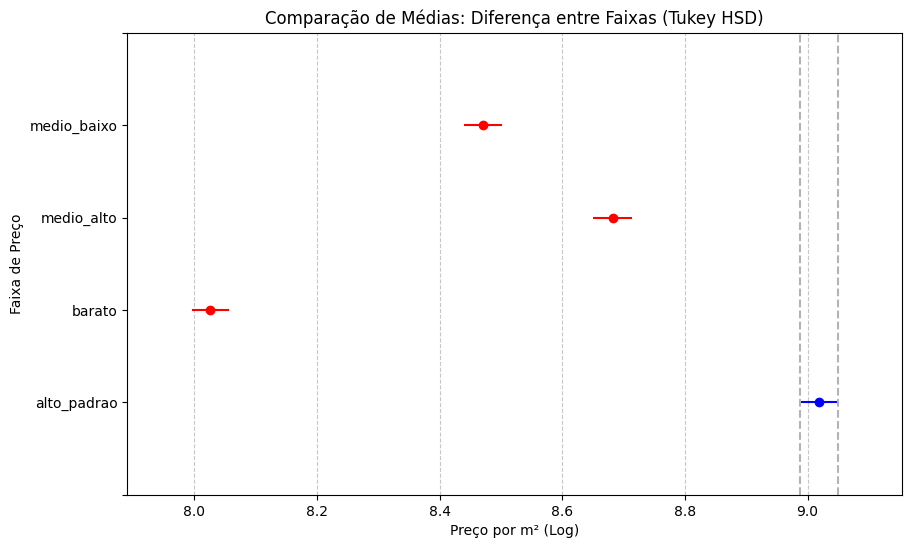

: 

In [ ]:
import matplotlib.pyplot as plt

# A biblioteca statsmodels já tem um método embutido para isso
fig = post_hoc.plot_simultaneous(comparison_name='alto_padrao', 
                                 xlabel='Preço por m² (Log)', 
                                 ylabel='Faixa de Preço')

plt.title("Comparação de Médias: Diferença entre Faixas (Tukey HSD)")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
# Filter out non-finite values (NaN and Inf)
df_clean = df_anova[np.isfinite(df_anova['preco_por_m2_log'])].copy()

# Re-run the model
model_clean = smf.ols('preco_por_m2_log ~ C(bairro)', data=df_clean).fit()

# Re-run Tukey HSD
from statsmodels.stats.multicomp import pairwise_tukeyhsd
post_hoc = pairwise_tukeyhsd(endog=df_clean['preco_por_m2_log'], 
                             groups=df_clean['bairro'], 
                             alpha=0.05)
print(post_hoc)

c:\Users\jefer\Documents\Ciencia-de-dados\Preco-Imoveis\.venv\Lib\site-packages\scipy\integrate\_quadpack_py.py:1286: IntegrationWarning:

The integral is probably divergent, or slowly convergent.



                    Multiple Comparison of Means - Tukey HSD, FWER=0.05                     
          group1                     group2           meandiff p-adj   lower   upper  reject
--------------------------------------------------------------------------------------------
            adhemar garcia                    america   0.7385    0.0  0.2756  1.2014   True
            adhemar garcia            anita garibaldi   0.5578 0.0019  0.0927   1.023   True
            adhemar garcia    area rural de joinville  -1.8891 0.0414 -3.7536 -0.0246   True
            adhemar garcia                 atiradores   0.7535    0.0  0.2785  1.2285   True
            adhemar garcia                aventureiro    0.164    1.0 -0.3596  0.6875  False
            adhemar garcia                  boa vista   0.1419    1.0 -0.3595  0.6434  False
            adhemar garcia                boehmerwald  -0.2329    1.0 -0.8167  0.3509  False
            adhemar garcia                 bom retiro    0.284 0.9708 

: 

In [ ]:
# Filter out non-finite values (NaN and Inf)
df_clean = df_anova[np.isfinite(df_anova['preco_por_m2_log'])].copy()

# Re-run the model
model_clean = smf.ols('preco_por_m2_log ~ C(tipo_imovel)', data=df_clean).fit()

# Re-run Tukey HSD
from statsmodels.stats.multicomp import pairwise_tukeyhsd
post_hoc = pairwise_tukeyhsd(endog=df_clean['preco_por_m2_log'], 
                             groups=df_clean['tipo_imovel'], 
                             alpha=0.05)
print(post_hoc)

        Multiple Comparison of Means - Tukey HSD, FWER=0.05         
    group1         group2     meandiff p-adj   lower   upper  reject
--------------------------------------------------------------------
   apartamento           casa  -0.3895    0.0 -0.4325 -0.3464   True
   apartamento      comercial  -0.2061  0.013 -0.3871 -0.0251   True
   apartamento         galpao  -1.2736    0.0 -1.6049 -0.9422   True
   apartamento         outros  -1.2459    0.0 -1.8461 -0.6458   True
   apartamento predio_inteiro  -0.4858    0.0 -0.7669 -0.2046   True
   apartamento          rural  -1.5057    0.0 -1.6959 -1.3155   True
   apartamento        terreno  -2.0495    0.0 -2.1138 -1.9852   True
          casa      comercial   0.1833  0.044  0.0026  0.3641   True
          casa         galpao  -0.8841    0.0 -1.2154 -0.5528   True
          casa         outros  -0.8565 0.0004 -1.4566 -0.2564   True
          casa predio_inteiro  -0.0963 0.9685 -0.3773  0.1847  False
          casa          rural  -1.

: 

# Verificação rápida dos pressupostos (mínimo aceitável)


In [ ]:
import scipy.stats as stats

stats.shapiro(model_clean.resid.sample(5000))

ShapiroResult(statistic=np.float64(0.7819847629923382), pvalue=np.float64(3.143363601458162e-63))

: 

In [ ]:
from scipy.stats import levene

groups = [
    group['preco_por_m2_log'].values
    for _, group in df_clean.groupby('faixa')
]

levene(*groups)

LeveneResult(statistic=np.float64(53.39484674923573), pvalue=np.float64(3.305156904263462e-34))

: 

# Modelo Primário Econométrico para verificarmos a relação das variáveis

In [ ]:
import numpy as np
import statsmodels.api as sm

: 

In [ ]:
def fit_model(features):
    X = df_model[features]
    X = sm.add_constant(X)
    y = df_model[alvo]
    
    model = sm.OLS(y, X).fit()
    return model

model_1 = fit_model(features)
print(model_1.summary())

                            OLS Regression Results                            
Dep. Variable:       preco_por_m2_log   R-squared:                       0.258
Model:                            OLS   Adj. R-squared:                  0.258
Method:                 Least Squares   F-statistic:                     533.6
Date:                qua, 04 mar 2026   Prob (F-statistic):               0.00
Time:                        09:50:12   Log-Likelihood:                -10677.
No. Observations:                9196   AIC:                         2.137e+04
Df Residuals:                    9189   BIC:                         2.142e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  7.6272      0

: 

In [ ]:
from pathlib import Path
import pandas as pd
import json
pasta = Path('../dados')

arquivo_mais_recente = max(pasta.glob('curitiba_zap_imoveis_limpo*.csv'), key=lambda f: f.stem.split('_')[-1])

data = pd.read_csv(arquivo_mais_recente)

print(f"Arquivo carregado: {arquivo_mais_recente.name}")

Arquivo carregado: curitiba_zap_imoveis_limpo_2026-03.csv


In [ ]:
data['bairro'].unique().shape

(87,)

In [ ]:
data['bairro'].unique()

array(['campo comprido', 'sao braz', 'bigorrilho', 'uberaba', 'umbara',
       'cidade industrial', 'portao', 'santa candida', 'santa quiteria',
       'bairro alto', 'centro', 'guaira', 'jardim social', 'cabral',
       'merces', 'reboucas', 'juveve', 'agua verde', 'xaxim',
       'fazendinha', 'hugo lange', 'sitio cercado', 'alto da rua xv',
       'cajuru', 'tatuquara', 'alto boqueirao', 'novo mundo',
       'pilarzinho', 'parolin', 'centro civico', 'boqueirao', 'boa vista',
       'atuba', 'santa felicidade', 'bacacheri', 'santo inacio', 'ahu',
       'cachoeira', 'batel', 'abranches', 'capao raso', 'tingui',
       'guabirotuba', 'neoville', 'vista alegre', 'mossungue',
       'capao da imbuia', 'cristo rei', 'barreirinha', 'alto da gloria',
       'taboao', 'sao lourenco', 'jardim botanico', 'hauer', 'orleans',
       'pinheirinho', 'prado velho', 'vila izabel', 'butiatuvinha',
       'jardim das americas', 'champagnat', 'caiua', 'ecoville',
       'campina do siqueira', 'bom ret

In [ ]:
# Mapeamento de nomes informais/errados para nomes oficiais
MAPA_BAIRROS_CURITIBA = {
    "alto da rua xv": "alto da xv",
    "ecoville": "mossungue",
    "champagnat": "bigorrilho",
    "campo do santana": "campo de santana",
    "neoville": "cidade industrial",
    "caiua": "cidade industrial",
    "jardim schaffer": "vista alegre",
    "tangua": "taboao",
    "barigui": "santo inacio",
    "passauna": "augusta",
    "619": "cidade industrial",
    "2459": "parolin",
    "n 1321": "capao rosa",
}



def normalizar_bairro_curitiba(bairro_raw):
    key = str(bairro_raw).strip().lower()
    normalizado = MAPA_BAIRROS_CURITIBA.get(key)
    if normalizado is None:
        print(f"⚠️ Bairro sem mapeamento: '{bairro_raw}'")
        return str(bairro_raw).strip()
    return normalizado

data['bairro'] = data['bairro'].apply(normalizar_bairro_curitiba)



In [ ]:
data['bairro'].unique().shape

(76,)

In [ ]:
data['bairro'].sort_values().unique()

array(['abranches', 'agua verde', 'ahu', 'alto', 'alto boqueirao',
       'alto da gloria', 'alto da xv', 'atuba', 'augusta', 'bacacheri',
       'bairro alto', 'barreirinha', 'batel', 'bigorrilho', 'boa vista',
       'bom retiro', 'boqueirao', 'butiatuvinha', 'cabral', 'cachoeira',
       'cajuru', 'campina do siqueira', 'campo comprido',
       'campo de santana', 'capao da imbuia', 'capao raso', 'capao rosa',
       'cascatinha', 'caximba', 'centro', 'centro civico',
       'cidade industrial', 'cristo rei', 'fanny', 'fazendinha',
       'ganchinho', 'guabirotuba', 'guaira', 'hauer', 'hugo lange',
       'jardim botanico', 'jardim das americas', 'jardim social',
       'juveve', 'lamenha pequena', 'lindoia', 'merces', 'mossungue',
       'novo mundo', 'orleans', 'parolin', 'pilarzinho', 'pinheirinho',
       'portao', 'prado velho', 'reboucas', 'riviera', 'santa candida',
       'santa felicidade', 'santa quiteria', 'santo inacio', 'sao braz',
       'sao francisco', 'sao joao', 's

# Testando

In [1]:
from funcoes_limpando_dados_imoveis import (limpar_valor_iptu, 
                                            limpar_banheiros, 
                                            limpar_metragem, 
                                            limpar_vagas,  
                                            limpa_endereco_apply_zap, 
                                            limpa_endereco_apply_chave_mao, 
                                            limpa_endereco_apply_olx,
                                            limpar_valor_condominio, 
                                            converter_para_data, 
                                            classificar_tipo_imovel, 
                                            reclassificar_outros, 
                                            preencher_todas_coordenadas, 
                                            main_example, 
                                            limpar_valor_venda, 
                                            limpar_quartos, 
                                            pirabeiraba_dona_francisca, 
                                            geocodificar_dataframe,
                                            limpa_endereco_apply_zap, 
                                            limpa_endereco_apply_chave_mao, 
                                            limpa_endereco_apply_olx,
                                            )

import json
import sys

import logging
import asyncio
import warnings

warnings.filterwarnings("ignore")


from pathlib import Path

import pandas as pd

logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

def carregar_json(pasta_dados: Path, glob_pattern: str) -> tuple[pd.DataFrame, Path | None]:
    """
    Busca o arquivo mais recente pelo padrão e retorna um DataFrame.
    Retorna DataFrame vazio se não encontrar nenhum arquivo.
    """
    arquivos = list(pasta_dados.glob(glob_pattern))

    if not arquivos:
        logger.warning(f"Nenhum arquivo encontrado para o padrão: {glob_pattern}")
        return pd.DataFrame(), None

    arquivo = max(arquivos, key=lambda f: f.stem.split('_')[-1])
    
    logger.info(f"Arquivo encontrado: {arquivo.name}")

    try:
        with open(arquivo, 'r', encoding='utf-8') as f:
            data = json.load(f)
        return pd.DataFrame(data), arquivo

    except Exception as e:
        logger.error(f"Erro ao carregar {arquivo.name}: {e}")
        return pd.DataFrame(), arquivo


In [2]:
import sys
from pathlib import Path

#pasta_dados  = Path(__file__).parent.parent.parent / 'dados'/ 'joinville'
pasta_dados  = Path('../dados/joinville')

name_arquivo_zap = 'zap_imoveis_joinville*.json'

name_arquivo_vivareal = 'joinville_vivareal_*.json'

name_arquivo_chave_mao = 'joinville_chave_mao_*.json'

name_arquivo_olx = 'joinville_olx_*.json'

df_zap, arquivo_zap      = carregar_json(pasta_dados, name_arquivo_zap)
    
df_vivareal, arquivo_vivareal = carregar_json(pasta_dados,name_arquivo_vivareal)
    
df_chave_mao, arquivo_chave_mao = carregar_json(pasta_dados,name_arquivo_chave_mao)

df_olx , arquivo_olx = carregar_json(pasta_dados, name_arquivo_olx)


df_zap['fonte'] = 'zap_imoveis'

df_vivareal['fonte'] = 'viva_real'

df_chave_mao['fonte'] = 'chave_mao'

df_olx['fonte'] = 'olx'



2026-04-06 17:04:39,948 - INFO - Arquivo encontrado: zap_imoveis_joinville_2026-04.json
2026-04-06 17:04:40,065 - INFO - Arquivo encontrado: joinville_vivareal_2026-04.json
2026-04-06 17:04:40,108 - INFO - Arquivo encontrado: joinville_chave_mao_2026-04.json
2026-04-06 17:04:40,193 - INFO - Arquivo encontrado: joinville_olx_2026-04.json


In [3]:
df_zap.shape, df_vivareal.shape, df_chave_mao.shape, df_olx.shape

((1323, 16), (1316, 16), (1482, 16), (5000, 14))

In [4]:
df_zap.isnull().sum()

url                 0
titulo              4
metragem            4
banheiros           4
vagas               4
quartos             4
valor_imovel        4
condominio          4
endereco            4
iptu                4
descricao          27
data_criacao        4
caracteristicas     0
fotos               0
link_maps           4
fonte               0
dtype: int64

In [5]:
df_vivareal.isnull().sum()

url                  0
titulo             975
metragem           974
banheiros          974
vagas              974
quartos            974
valor_imovel       974
condominio         974
endereco           974
iptu               973
descricao          975
data_criacao       974
caracteristicas      0
fotos                0
link_maps          973
fonte                0
dtype: int64

In [6]:
df_chave_mao.isnull().sum()

url                   0
titulo               10
metragem             71
banheiros             0
vagas               151
quartos             206
valor_imovel         12
condominio            0
endereco              7
iptu                  0
descricao            17
data_criacao       1482
caracteristicas       0
fotos                 0
link_maps            26
fonte                 0
dtype: int64

In [7]:
df_olx.isnull().sum()

url                0
titulo            11
valor_imovel       2
metragem         354
quartos           80
banheiros         14
vagas            123
condominio      3607
iptu            3613
endereco          11
descricao         61
data_criacao      14
fotos              0
fonte              0
dtype: int64

In [8]:
df_vivareal

,url,titulo,metragem,banheiros,vagas,quartos,valor_imovel,condominio,endereco,iptu,descricao,data_criacao,caracteristicas,fotos,link_maps,fonte
0,https://www.vivareal.com.br/imovel/apartamento...,Apartamento com 2 Quartos e 2 banheiros à Vend...,75 m²,2,1,2,R$ 479.000,R$ 297/mês,"Rua Brasil - Saguaçú, Joinville - SC",Isento,Uma planta muito inteligente com muita ilumina...,"Anúncio criado em 22 de março de 2026, atualiz...","[75 m², 2 quartos, 2 banheiros, 1 vaga, 1 suít...",[https://resizedimgs.vivareal.com/img/vr-listi...,https://www.google.com/maps/embed/v1/place?key...,viva_real
1,https://www.vivareal.com.br/imovel/apartamento...,Apartamento com 2 Quartos e 1 banheiro à Venda...,64 m²,1,1,2,R$ 540.000,Não informado,"Rua Rio Grande do Norte, 347 - Anita Garibaldi...",Não informado,Apartamento à Venda no Residencial Torre de To...,"Anúncio criado em 7 de agosto de 2025, atualiz...","[64 m², 2 quartos, 1 banheiro, 1 vaga, 1 suíte]",[https://resizedimgs.vivareal.com/img/vr-listi...,https://www.google.com/maps/embed/v1/place?key...,viva_real
2,https://www.vivareal.com.br/imovel/casa-4-quar...,"Casa com 4 Quartos e 3 banheiros à Venda, 194 ...",194 m²,3,3,4,R$ 890.000,Isento,"Rua São Miguel, 255 - Boa Vista, Joinville - SC",R$ 1.093,Localização: Em um dos melhores bairros de Joi...,"Anúncio criado em 8 de fevereiro de 2026, atua...","[194 m², 4 quartos, 3 banheiros, 3 vagas, 1 su...",[https://resizedimgs.vivareal.com/img/vr-listi...,https://www.google.com/maps/embed/v1/place?key...,viva_real
3,https://www.vivareal.com.br/imovel/lote-terren...,"Lote/Terreno à Venda, 654 m² por R$ 680.000",654 m²,--,--,--,R$ 680.000,Isento,"Rua Florianópolis - Bucarein, Joinville - SC",Isento,Terreno residencial à venda no bairro Bucarein...,"Anúncio criado em 27 de dezembro de 2025, atua...",[654 m²],[https://resizedimgs.vivareal.com/img/vr-listi...,https://www.google.com/maps/embed/v1/place?key...,viva_real
4,https://www.vivareal.com.br/imovel/sobrado-2-q...,"Sobrado com 2 Quartos e 3 banheiros à Venda, 8...",89 m²,3,1,2,R$ 469.998,Isento,"Rua Doutor João Colin, 98 - Santo Antônio, Joi...",R$ 657,Bem-vindo ao seu novo lar! Descubra este encan...,"Anúncio criado em 31 de março de 2026, atualiz...","[89 m², 2 quartos, 3 banheiros, 1 vaga, 2 suít...",[https://resizedimgs.vivareal.com/img/vr-listi...,https://www.google.com/maps/embed/v1/place?key...,viva_real
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1311,https://www.vivareal.com.br/imovel/sobrado-2-q...,"Sobrado com 2 Quartos e 1 banheiro à Venda, 11...",111 m²,1,2,2,R$ 610.000,Isento,"Rua Almirante Jaceguay, 197 - Costa E Silva, J...",R$ 400,COMECE SEU FUTURO AGORA COM ESSE IMÓVEL!Seu no...,"Anúncio criado em 28 de março de 2026, atualiz...","[111 m², 2 quartos, 1 banheiro, 2 vagas, 2 suí...",[https://resizedimgs.vivareal.com/img/vr-listi...,https://www.google.com/maps/embed/v1/place?key...,viva_real
1312,https://www.vivareal.com.br/imovel/casa-2-quar...,"Casa com 2 Quartos e 2 banheiros à Venda, 62 m...",62 m²,2,2,2,R$ 390.000,Não informado,"Aventureiro, Joinville - SC",Não informado,"Casa Averbada com 72m, 2 quartos, banheiro, la...","Anúncio criado em 31 de março de 2026, atualiz...","[62 m², 2 quartos, 2 banheiros, 2 vagas, Mobil...",[https://resizedimgs.vivareal.com/img/vr-listi...,https://www.google.com/maps/embed/v1/place?key...,viva_real
1313,https://www.vivareal.com.br/imovel/sobrado-3-q...,"Sobrado com 3 Quartos e 3 banheiros à Venda, 1...",111 m²,3,2,3,R$ 860.000,Isento,"Rua Ouvidor, 41 - Glória, Joinville - SC",Não informado,"O Residencial RS3 Cecília, está situado na mel...","Anúncio criado em 31 de março de 2026, atualiz...","[111 m², 3 quartos, 3 banheiros, 2 vagas, 1 su...",[https://resizedimgs.vivareal.com/img/vr-listi...,https://www.google.com/maps/embed/v1/place?key...,viva_real
1314,https://www.vivareal.com.br/imovel/apartamento...,Apartamento com 3 Quartos e 4 banheiros à Vend...,135 m²,4,2,3,R$ 1.490.000,Isento,"Rua João Pessoa - América, Joinville -

In [9]:
df_zap_endereco_limpo = df_zap['endereco'].apply(limpa_endereco_apply_zap)
df_vivareal_endereco_limpo = df_vivareal['endereco'].apply(limpa_endereco_apply_zap)
df_chave_mao_endereco_limpo = df_chave_mao['endereco'].apply(limpa_endereco_apply_chave_mao)
df_olx_endereco_limpo = df_olx['endereco'].apply(limpa_endereco_apply_olx)

df_zap_endereco =  pd.concat([df_zap, df_zap_endereco_limpo], axis=1)
df_vivareal_endereco =  pd.concat([df_vivareal, df_vivareal_endereco_limpo], axis=1)
df_chave_mao_endereco =  pd.concat([df_chave_mao, df_chave_mao_endereco_limpo], axis=1)
df_olx_endereco =  pd.concat([df_olx, df_olx_endereco_limpo], axis=1)


In [10]:
df_joinville = pd.concat([df_zap_endereco, df_vivareal_endereco, df_chave_mao_endereco, df_olx_endereco], ignore_index=True)

In [11]:
df_joinville.shape

(9121, 22)

In [12]:
from datetime import datetime
pd_data = df_joinville.drop_duplicates(subset=['url'])

print("pd_data:", pd_data.shape)

pd_data = pd_data[pd_data['valor_imovel'].notna()]

print("pd_data após filtragem:", pd_data.shape)

pd_data_sem_nulos = pd_data.dropna(thresh=10)
print("pd_data_sem_nulos:", pd_data_sem_nulos.shape)

pd_data_metragem = pd_data_sem_nulos.copy()
pd_data_metragem['metragem'] = pd_data_metragem['metragem'].apply(limpar_metragem)

print("pd_data_metragem:", pd_data_metragem.shape)

pd_data_valor_imovel = pd_data_sem_nulos.copy()
pd_data_valor_imovel['valor_imovel'] = pd_data_valor_imovel['valor_imovel'].apply(limpar_valor_venda)

print("pd_data_valor_imovel:", pd_data_valor_imovel.shape)

pd_data_valor_condominio = pd_data_valor_imovel.copy()

pd_data_valor_condominio['condominio'] = pd_data_valor_condominio['condominio'].apply(limpar_valor_condominio)

print("pd_data_valor_condominio:", pd_data_valor_condominio.shape)

pd_data_valor_iptu = pd_data_valor_condominio.copy()

pd_data_valor_iptu['iptu'] = pd_data_valor_iptu['iptu'].apply(limpar_valor_iptu)

print("pd_data_valor_iptu:", pd_data_valor_iptu.shape)

pd_data_ano_publicacao = pd_data_valor_iptu.copy()

pd_data_ano_publicacao['data_criacao'] = pd_data_ano_publicacao['data_criacao'].apply(converter_para_data)

pd_data_ano_publicacao['dias_publicacao'] = (pd.to_datetime(datetime.now().strftime('%Y-%m-%d')) - pd.to_datetime(pd_data_ano_publicacao['data_criacao'], format='%d/%m/%Y')).dt.days

print("pd_data_ano_publicacao:", pd_data_ano_publicacao.shape)

pd_data_banheiros = pd_data_ano_publicacao.copy()
    
pd_data_banheiros['banheiros'] = pd_data_banheiros['banheiros'].apply(limpar_banheiros)

print("pd_data_banheiros:", pd_data_banheiros.shape)




2026-04-06 16:47:15,864 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,865 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,866 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,867 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,869 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,870 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,871 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,872 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,873 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,873 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,874 - WARNING - Erro de nome 'NoneType' object has no attrib

pd_data: (9120, 22)
pd_data após filtragem: (8128, 22)
pd_data_sem_nulos: (8128, 22)
pd_data_metragem: (8128, 22)
pd_data_valor_imovel: (8128, 22)
pd_data_valor_condominio: (8128, 22)
pd_data_valor_iptu: (8128, 22)


2026-04-06 16:47:15,932 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,933 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,933 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,934 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,934 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,935 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,935 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,936 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,936 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,937 - WARNING - Erro de nome 'NoneType' object has no attribute 'split'
2026-04-06 16:47:15,938 - WARNING - Erro de nome 'NoneType' object has no attrib

pd_data_ano_publicacao: (8128, 23)
pd_data_banheiros: (8128, 23)


In [13]:
pd_data_quartos = pd_data_banheiros.copy()

pd_data_quartos['quartos'] = pd_data_quartos['quartos'].apply(limpar_quartos)

print("pd_data_quartos:", pd_data_quartos.shape)

pd_data_garagem = pd_data_quartos.copy()

    #pd_data_garagem['vagas'] = pd_data_garagem['vagas'].replace('--', 0).astype('int64')

pd_data_garagem['vagas'] = pd_data_garagem['vagas'].apply(limpar_vagas)

print("pd_data_garagem:", pd_data_garagem.shape)

pd_data_tipo_imovel = pd_data_garagem.copy()

pd_data_tipo_imovel['tipo_imovel'] = pd_data_tipo_imovel['titulo'].apply(classificar_tipo_imovel)

mask = pd_data_tipo_imovel['tipo_imovel'] == 'outros'

pd_data_tipo_imovel.loc[mask, 'tipo_imovel'] = (
        pd_data_tipo_imovel.loc[mask, 'descricao']
        .apply(reclassificar_outros)
    )
print("pd_data_tipo_imovel:", pd_data_tipo_imovel.shape)

pd_data_long_lat = pd_data_tipo_imovel.copy()
    
   
#pd_data_lat_log_completo = await preencher_todas_coordenadas(pd_data_long_lat, batch_size='100', cidade='Joinville', estado='SC', pais='Brasil')



pd_data_quartos: (8128, 23)
pd_data_garagem: (8128, 23)
pd_data_tipo_imovel: (8128, 24)


In [14]:
pd_data_long_lat['estado'].value_counts()

estado
sc    8113
pr      15
Name: count, dtype: int64

In [ ]:
pd_data_lat_log_completo = await preencher_todas_coordenadas(pd_data_long_lat, batch_size=50, cidade='Joinville', estado='SC', pais='Brasil')


In [18]:
pd_data_lat_log_completo[pd_data_lat_log_completo['lat'].isnull()]['fonte'].value_counts()

fonte
chave_mao      1469
zap_imoveis    1318
olx            1193
viva_real       342
Name: count, dtype: int64

In [19]:
pd_data_lat_log_completo[pd_data_lat_log_completo['lat'].notnull()]['fonte'].value_counts()

fonte
olx            3805
zap_imoveis       1
Name: count, dtype: int64